In [ ]:
# Mount Google Drive (optional, if you need to save/load data)
from google.colab import drive
drive.mount('/content/drive')

# Define file path
f_path = '/content/drive/MyDrive/DiTing2.0'
# !git clone https://github.com/bytedance/VideoWorld.git

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Chinese font configured!


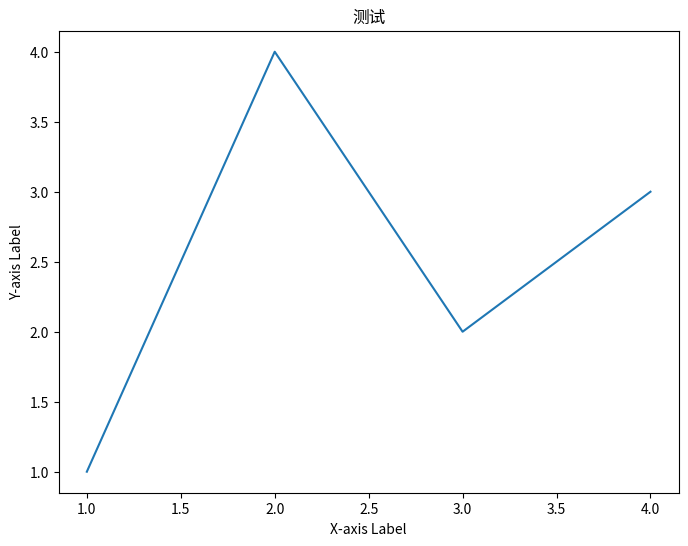

Note: Chinese characters may not display properly with DejaVu Sans
Consider installing a Chinese font for proper display


In [ ]:
import torch
import numpy as np

import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import os
from tqdm import tqdm

#@title 使用matplotlib显示中文字符
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import urllib.request
import os

# Download a Chinese font
font_url = "https://github.com/adobe-fonts/source-han-sans/raw/release/OTF/SimplifiedChinese/SourceHanSansSC-Regular.otf"
font_filename = "SourceHanSansSC-Regular.otf"

if not os.path.exists(font_filename):
    print("Downloading Chinese font...")
    urllib.request.urlretrieve(font_url, font_filename)
    print("Font downloaded successfully!")

# Add the font to matplotlib
fm.fontManager.addfont(font_filename)
plt.rcParams['font.sans-serif'] = ['Source Han Sans SC']
plt.rcParams['axes.unicode_minus'] = False

print("Chinese font configured!")


# Your plot with a note about font limitations
plt.figure(figsize=(8, 6))
plt.plot([1, 2, 3, 4], [1, 4, 2, 3])
plt.title('测试')  # English fallback
plt.xlabel('X-axis Label')  # English fallback
plt.ylabel('Y-axis Label')  # English fallback
plt.show()

print("Note: Chinese characters may not display properly with DejaVu Sans")
print("Consider installing a Chinese font for proper display")





In [ ]:
!pip install prettytable

In [ ]:
#@title 读取Sleipner 4D Seismic Dataset的三维地震体
import matplotlib.pyplot as plt
import numpy as np
import os

# Install required libraries
try:
    import segyio
    print("segyio库已安装")
except ImportError:
    print("正在安装segyio库...")
    !pip install segyio
    import segyio

# Define file paths
file_paths = {
    '1994-2001': '/content/drive/MyDrive/DiTing2.0/dataset/94p01 2001 processing/data/94p01mid.sgy',
    '1994-2007': '/content/drive/MyDrive/DiTing2.0/dataset/94p07 2007 processing/data/94p07mid.sgy',
    '1999-2001': '/content/drive/MyDrive/DiTing2.0/dataset/99p01 2001 processing/data/99p01mid.sgy',
    '2001-2001': '/content/drive/MyDrive/DiTing2.0/dataset/01p01 2001 processing/data/01p01mid.sgy',
    '2010-2011': '/content/drive/MyDrive/DiTing2.0/dataset/10p11 2011 Imaging processing/data/10p11mid',
}

def analyze_segy_structure(file_path):
    """分析SEG-Y文件的3D结构"""
    try:
        with segyio.open(file_path, 'r') as segy:
            info = {
                'traces': segy.tracecount,
                'samples': len(segy.samples),
                'sample_interval': segy.bin[segyio.BinField.Interval],
                'sample_rate': segy.bin[segyio.BinField.Interval] / 1000,
                'format': segy.format,
                'sorting': segy.sorting,
                'is_3d': False,
                'geometry': 'Unknown'
            }

            # 检查是否为3D数据
            try:
                # 尝试获取inline和crossline信息
                if hasattr(segy, 'ilines') and hasattr(segy, 'xlines'):
                    info['is_3d'] = True
                    info['geometry'] = '3D Structured'
                    info['ilines'] = list(segy.ilines)[:10]  # 前10个inline号
                    info['xlines'] = list(segy.xlines)[:10]  # 前10个crossline号
                    info['n_ilines'] = len(segy.ilines)
                    info['n_xlines'] = len(segy.xlines)
                    info['cube_shape'] = (info['n_ilines'], info['n_xlines'], info['samples'])

                    print(f"✅ 检测到3D地震数据!")
                    print(f"   Inline范围: {min(segy.ilines)} - {max(segy.ilines)} (共{len(segy.ilines)}条)")
                    print(f"   Crossline范围: {min(segy.xlines)} - {max(segy.xlines)} (共{len(segy.xlines)}条)")
                    print(f"   3D数据体形状: {info['cube_shape']}")

                else:
                    # 尝试通过header分析几何结构
                    inline_set = set()
                    xline_set = set()

                    # 检查前1000道的inline/crossline信息
                    sample_size = min(1000, segy.tracecount)
                    for i in range(sample_size):
                        try:
                            iline = segy.header[i][segyio.TraceField.INLINE_3D]
                            xline = segy.header[i][segyio.TraceField.CROSSLINE_3D]
                            if iline != 0: inline_set.add(iline)
                            if xline != 0: xline_set.add(xline)
                        except:
                            pass

                    if len(inline_set) > 1 and len(xline_set) > 1:
                        info['is_3d'] = True
                        info['geometry'] = '3D Unstructured'
                        info['estimated_ilines'] = len(inline_set)
                        info['estimated_xlines'] = len(xline_set)
                        print(f"✅ 检测到3D地震数据 (非结构化)")
                        print(f"   估计Inline数量: {len(inline_set)}")
                        print(f"   估计Crossline数量: {len(xline_set)}")
                    else:
                        info['geometry'] = '2D Profile'
                        print(f"📏 检测到2D地震剖面")

            except Exception as e:
                print(f"⚠️ 3D结构分析出错: {e}")
                info['geometry'] = '2D Profile'

            # 获取坐标信息
            try:
                sample_traces = min(100, segy.tracecount)
                x_coords = []
                y_coords = []

                for i in range(sample_traces):
                    x = segy.header[i][segyio.TraceField.SourceX] or segy.header[i][segyio.TraceField.CDP_X]
                    y = segy.header[i][segyio.TraceField.SourceY] or segy.header[i][segyio.TraceField.CDP_Y]
                    if x != 0: x_coords.append(x)
                    if y != 0: y_coords.append(y)

                if x_coords and y_coords:
                    info['x_range'] = (min(x_coords), max(x_coords))
                    info['y_range'] = (min(y_coords), max(y_coords))
                else:
                    info['x_range'] = 'N/A'
                    info['y_range'] = 'N/A'
            except:
                info['x_range'] = 'N/A'
                info['y_range'] = 'N/A'

        return info

    except Exception as e:
        print(f"❌ 文件分析失败: {e}")
        return None

def load_3d_seismic_data(file_path, max_inlines=None):
    """加载3D地震数据"""
    try:
        with segyio.open(file_path, 'r') as segy:
            if hasattr(segy, 'ilines') and hasattr(segy, 'xlines'):
                # 结构化3D数据
                if max_inlines:
                    ilines_to_read = list(segy.ilines)[:max_inlines]
                else:
                    ilines_to_read = list(segy.ilines)

                # 读取3D数据体
                cube = segyio.tools.cube(segy)

                # 创建时间轴
                dt = segy.bin[segyio.BinField.Interval] / 1000
                time_axis = np.arange(len(segy.samples)) * dt

                return cube, time_axis, list(segy.ilines), list(segy.xlines)
            else:
                # 2D数据或非结构化数据
                data = np.array([segy.trace[i] for i in range(min(5000, segy.tracecount))])
                dt = segy.bin[segyio.BinField.Interval] / 1000
                time_axis = np.arange(len(segy.samples)) * dt
                return data, time_axis, None, None

    except Exception as e:
        print(f"❌ 数据加载失败: {e}")
        return None, None, None, None

# 主分析流程
seismic_data = {}
print("=" * 70)
print("SLEIPNER 4D SEISMIC DATASET - 3D结构分析")
print("=" * 70)

for year, file_path in file_paths.items():
    print(f"\n🔍 分析 {year}年数据集:")
    print(f"文件路径: {file_path}")

    if not os.path.exists(file_path):
        print(f"❌ 文件不存在: {file_path}")
        continue

    # 获取文件大小
    file_size = os.path.getsize(file_path) / (1024**2)
    print(f"文件大小: {file_size:.2f} MB")

    # 分析文件结构
    info = analyze_segy_structure(file_path)

    if info:
        print(f"   总道数: {info['traces']:,}")
        print(f"   采样点数: {info['samples']:,}")
        print(f"   采样间隔: {info['sample_interval']} μs")
        print(f"   数据格式: {info['format']}")
        print(f"   排序方式: {info['sorting']}")
        print(f"   几何结构: {info['geometry']}")
        print(f"   坐标范围: X{info['x_range']}, Y{info['y_range']}")

        # 加载数据
        print(f"   正在加载数据...")
        if info['is_3d']:
            cube, time_axis, ilines, xlines = load_3d_seismic_data(file_path, max_inlines=10)
            if cube is not None:
                seismic_data[year] = {
                    'data': cube,
                    'time': time_axis,
                    'ilines': ilines,
                    'xlines': xlines,
                    'info': info,
                    'type': '3D'
                }
                print(f"   ✅ 3D数据加载成功! 形状: {cube.shape}")
        else:
            data, time_axis, _, _ = load_3d_seismic_data(file_path)
            if data is not None:
                seismic_data[year] = {
                    'data': data,
                    'time': time_axis,
                    'info': info,
                    'type': '2D'
                }
                print(f"   ✅ 2D数据加载成功! 形状: {data.shape}")

# 可视化结果
if seismic_data:
    print(f"\n📊 生成可视化图表...")

    n_datasets = len(seismic_data)
    fig = plt.figure(figsize=(20, 12))

    for idx, (year, dataset) in enumerate(seismic_data.items()):
        if dataset['type'] == '3D':
            # 3D数据：显示inline切片、crossline切片和时间切片
            cube = dataset['data']
            time = dataset['time']

            # Inline切片 (中间inline)
            ax1 = plt.subplot(3, n_datasets, idx + 1)
            mid_inline = cube.shape[0] // 2
            inline_slice = cube[mid_inline, :, :]
            im1 = ax1.imshow(inline_slice.T, aspect='auto', cmap='seismic',
                           extent=[0, inline_slice.shape[0], time[-1], time[0]],
                           vmin=np.percentile(cube, 1), vmax=np.percentile(cube, 99))
            ax1.set_title(f'{year} - Inline切片\n(第{mid_inline}条inline)')
            ax1.set_xlabel('Crossline')
            ax1.set_ylabel('Time (ms)')

            # Crossline切片 (中间crossline)
            ax2 = plt.subplot(3, n_datasets, idx + 1 + n_datasets)
            mid_xline = cube.shape[1] // 2
            xline_slice = cube[:, mid_xline, :]
            im2 = ax2.imshow(xline_slice.T, aspect='auto', cmap='seismic',
                           extent=[0, xline_slice.shape[0], time[-1], time[0]],
                           vmin=np.percentile(cube, 1), vmax=np.percentile(cube, 99))
            ax2.set_title(f'{year} - Crossline切片\n(第{mid_xline}条crossline)')
            ax2.set_xlabel('Inline')
            ax2.set_ylabel('Time (ms)')

            # 时间切片 (中间时间)
            ax3 = plt.subplot(3, n_datasets, idx + 1 + 2*n_datasets)
            mid_time = cube.shape[2] // 2
            time_slice = cube[:, :, mid_time]
            im3 = ax3.imshow(time_slice, aspect='auto', cmap='seismic',
                           vmin=np.percentile(cube, 1), vmax=np.percentile(cube, 99))
            ax3.set_title(f'{year} - 时间切片\n(t={time[mid_time]:.1f}ms)')
            ax3.set_xlabel('Crossline')
            ax3.set_ylabel('Inline')

        else:
            # 2D数据：常规显示
            ax = plt.subplot(3, n_datasets, idx + 1)
            data = dataset['data']
            time = dataset['time']

            im = ax.imshow(data.T, aspect='auto', cmap='seismic',
                         extent=[0, data.shape[0], time[-1], time[0]],
                         vmin=np.percentile(data, 1), vmax=np.percentile(data, 99))
            ax.set_title(f'{year} - 2D剖面\n({data.shape[0]} traces)')
            ax.set_xlabel('Trace Number')
            ax.set_ylabel('Time (ms)')

    plt.tight_layout()
    plt.show()

# 总结报告
print(f"\n📋 数据结构总结:")
print("=" * 50)
for year, dataset in seismic_data.items():
    info = dataset['info']
    print(f"\n{year}年数据:")
    print(f"  类型: {dataset['type']}")
    print(f"  几何结构: {info['geometry']}")
    if dataset['type'] == '3D':
        print(f"  3D数据体形状: {dataset['data'].shape}")
        if 'cube_shape' in info:
            print(f"  (Inline × Crossline × Time): {info['cube_shape']}")
    else:
        print(f"  2D数据形状: {dataset['data'].shape}")
    print(f"  文件大小: {os.path.getsize(file_paths[year])/(1024**2):.1f} MB")

print(f"\n✅ 分析完成!")


Output hidden; open in https://colab.research.google.com to view.

## GeoWorld

开始时移地震分析...

正在分析 inline_center...
图像已保存至: /content/drive/MyDrive/DiTing2.0/time_lapse_analysis/inline_center_analysis.pdf


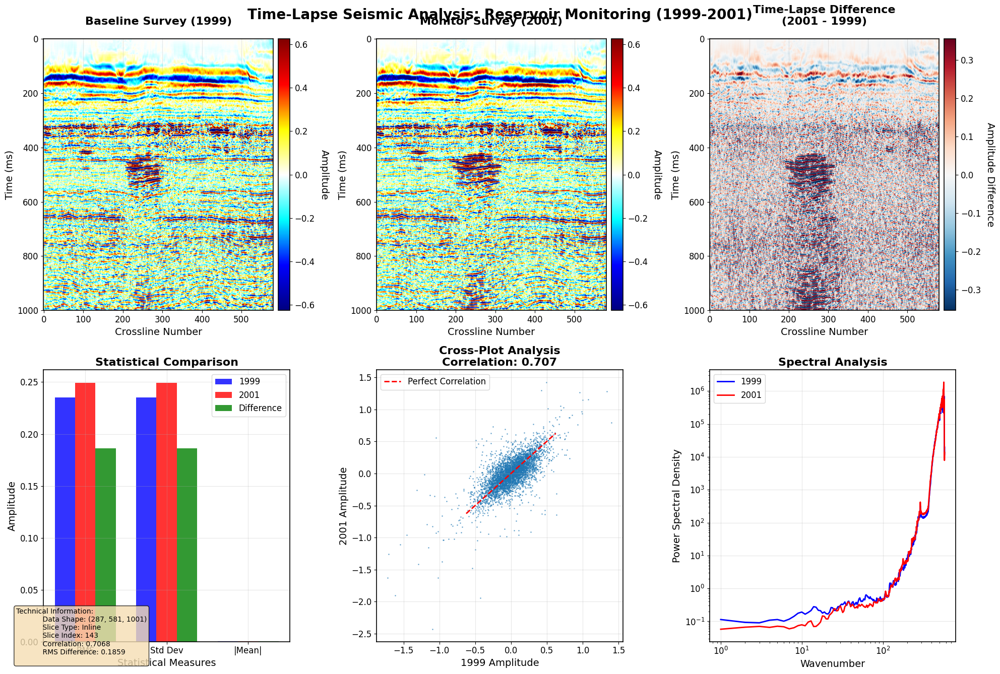


正在分析 crossline_center...
图像已保存至: /content/drive/MyDrive/DiTing2.0/time_lapse_analysis/crossline_center_analysis.pdf


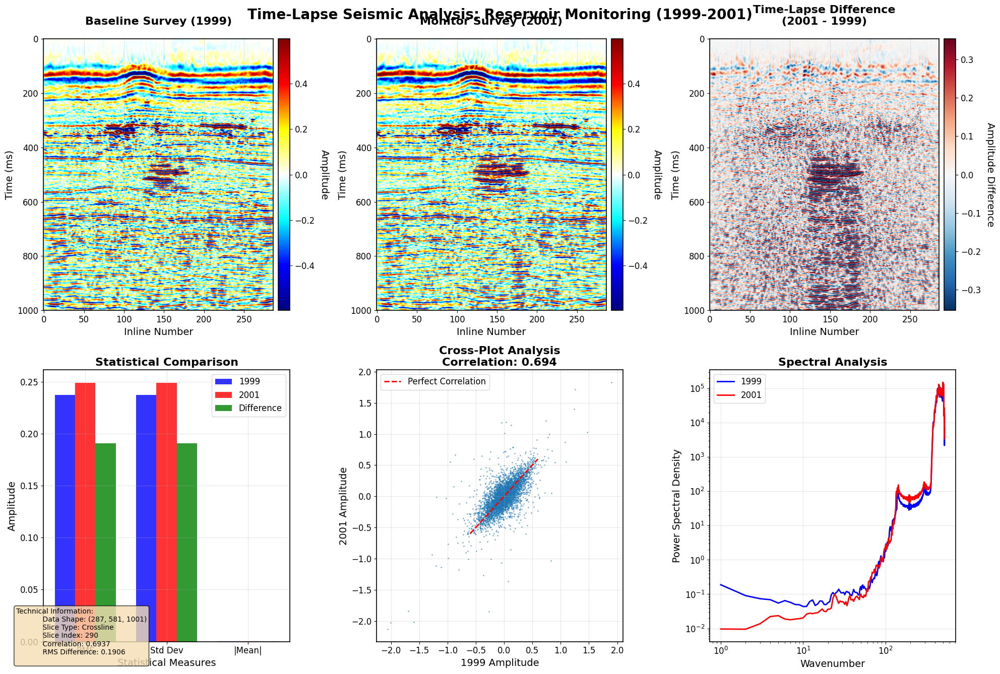


正在分析 timeslice_500ms...
图像已保存至: /content/drive/MyDrive/DiTing2.0/time_lapse_analysis/timeslice_500ms_analysis.pdf


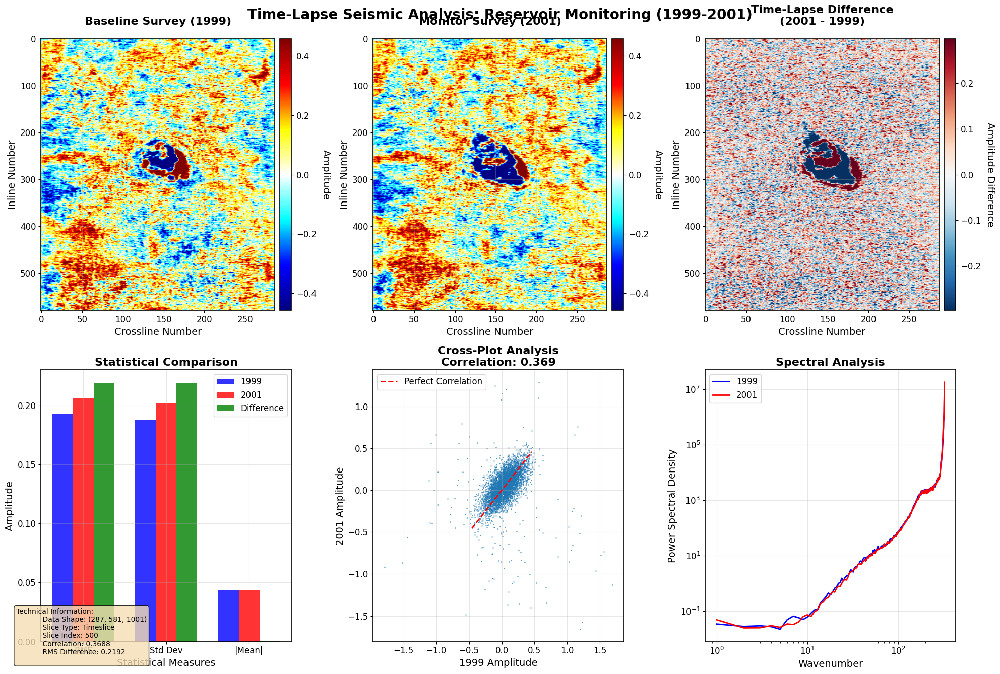


=== 时移地震分析综合报告 ===

INLINE_CENTER:
  相关系数: 0.7068
  RMS差值: 0.1859
  平均差值: 0.0001

CROSSLINE_CENTER:
  相关系数: 0.6937
  RMS差值: 0.1906
  平均差值: -0.0001

TIMESLICE_500MS:
  相关系数: 0.3688
  RMS差值: 0.2192
  平均差值: 0.0001


In [ ]:
#@title 画二维切片图，反映1999,2001时移地震的变化

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns

# 设置科研级别的绘图参数
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'DejaVu Sans',
    'axes.linewidth': 1.2,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.titlesize': 18,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

def create_seismic_colormap():
    """创建专业的地震数据colormap"""
    colors = ['#000080', '#0000FF', '#00FFFF', '#FFFFFF', '#FFFF00', '#FF0000', '#800000']
    return LinearSegmentedColormap.from_list('seismic_custom', colors, N=256)

def plot_time_lapse_comparison(seismic_data, slice_type='inline', slice_index=None,
                              time_range=None, save_path=None):
    """
    绘制时移地震对比分析图

    Parameters:
    -----------
    seismic_data : dict
        包含1999和2001年地震数据的字典
    slice_type : str
        切片类型 ('inline', 'crossline', 'timeslice')
    slice_index : int
        切片索引，如果为None则自动选择中间切片
    time_range : tuple
        时间窗口范围 (start_time, end_time)，单位ms
    save_path : str
        保存路径
    """

    # 获取数据
    data_1999 = seismic_data['1999-2001']['data']
    data_2001 = seismic_data['2001-2001']['data']

    # 数据形状信息
    n_inlines, n_xlines, n_samples = data_1999.shape

    # 自动选择切片索引
    if slice_index is None:
        if slice_type == 'inline':
            slice_index = n_inlines // 2
        elif slice_type == 'crossline':
            slice_index = n_xlines // 2
        else:  # timeslice
            slice_index = n_samples // 2

    # 提取切片数据
    if slice_type == 'inline':
        slice_1999 = data_1999[slice_index, :, :]
        slice_2001 = data_2001[slice_index, :, :]
        xlabel, ylabel = 'Crossline Number', 'Time (ms)'
        title_suffix = f'Inline {slice_index}'
    elif slice_type == 'crossline':
        slice_1999 = data_1999[:, slice_index, :]
        slice_2001 = data_2001[:, slice_index, :]
        xlabel, ylabel = 'Inline Number', 'Time (ms)'
        title_suffix = f'Crossline {slice_index}'
    else:  # timeslice
        slice_1999 = data_1999[:, :, slice_index]
        slice_2001 = data_2001[:, :, slice_index]
        xlabel, ylabel = 'Crossline Number', 'Inline Number'
        title_suffix = f'Time Sample {slice_index}'

    # 计算差值
    difference = slice_2001 - slice_1999

    # 设置颜色范围
    vmax = np.percentile(np.abs(np.concatenate([slice_1999.flatten(), slice_2001.flatten()])), 98)
    vmin = -vmax

    # 差值的颜色范围
    diff_max = np.percentile(np.abs(difference.flatten()), 95)

    # 创建自定义colormap
    seismic_cmap = create_seismic_colormap()

    # 创建图形
    fig = plt.figure(figsize=(20, 14))

    # 主标题
    fig.suptitle('Time-Lapse Seismic Analysis: Reservoir Monitoring (1999-2001)',
                 fontsize=20, fontweight='bold', y=0.95)

    # 子图1: 1999年数据
    ax1 = plt.subplot(2, 3, 1)
    im1 = ax1.imshow(slice_1999.T, aspect='auto', cmap=seismic_cmap,
                     vmin=vmin, vmax=vmax, interpolation='bilinear')
    ax1.set_title('Baseline Survey (1999)', fontweight='bold', pad=20)
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel(ylabel)
    ax1.grid(True, alpha=0.3)

    # 添加colorbar
    divider1 = make_axes_locatable(ax1)
    cax1 = divider1.append_axes("right", size="5%", pad=0.1)
    cbar1 = plt.colorbar(im1, cax=cax1)
    cbar1.set_label('Amplitude', rotation=270, labelpad=20)

    # 子图2: 2001年数据
    ax2 = plt.subplot(2, 3, 2)
    im2 = ax2.imshow(slice_2001.T, aspect='auto', cmap=seismic_cmap,
                     vmin=vmin, vmax=vmax, interpolation='bilinear')
    ax2.set_title('Monitor Survey (2001)', fontweight='bold', pad=20)
    ax2.set_xlabel(xlabel)
    ax2.set_ylabel(ylabel)
    ax2.grid(True, alpha=0.3)

    # 添加colorbar
    divider2 = make_axes_locatable(ax2)
    cax2 = divider2.append_axes("right", size="5%", pad=0.1)
    cbar2 = plt.colorbar(im2, cax=cax2)
    cbar2.set_label('Amplitude', rotation=270, labelpad=20)

    # 子图3: 差值图
    ax3 = plt.subplot(2, 3, 3)
    im3 = ax3.imshow(difference.T, aspect='auto', cmap='RdBu_r',
                     vmin=-diff_max, vmax=diff_max, interpolation='bilinear')
    ax3.set_title('Time-Lapse Difference\n(2001 - 1999)', fontweight='bold', pad=20)
    ax3.set_xlabel(xlabel)
    ax3.set_ylabel(ylabel)
    ax3.grid(True, alpha=0.3)

    # 添加colorbar
    divider3 = make_axes_locatable(ax3)
    cax3 = divider3.append_axes("right", size="5%", pad=0.1)
    cbar3 = plt.colorbar(im3, cax=cax3)
    cbar3.set_label('Amplitude Difference', rotation=270, labelpad=20)

    # 子图4: 统计分析
    ax4 = plt.subplot(2, 3, 4)

    # 计算统计量
    stats_1999 = {
        'mean': np.mean(slice_1999),
        'std': np.std(slice_1999),
        'rms': np.sqrt(np.mean(slice_1999**2))
    }

    stats_2001 = {
        'mean': np.mean(slice_2001),
        'std': np.std(slice_2001),
        'rms': np.sqrt(np.mean(slice_2001**2))
    }

    stats_diff = {
        'mean': np.mean(difference),
        'std': np.std(difference),
        'rms': np.sqrt(np.mean(difference**2))
    }

    # 绘制统计柱状图
    x_pos = np.arange(3)
    width = 0.25

    ax4.bar(x_pos - width, [stats_1999['rms'], stats_1999['std'], abs(stats_1999['mean'])],
            width, label='1999', alpha=0.8, color='blue')
    ax4.bar(x_pos, [stats_2001['rms'], stats_2001['std'], abs(stats_2001['mean'])],
            width, label='2001', alpha=0.8, color='red')
    ax4.bar(x_pos + width, [stats_diff['rms'], stats_diff['std'], abs(stats_diff['mean'])],
            width, label='Difference', alpha=0.8, color='green')

    ax4.set_xlabel('Statistical Measures')
    ax4.set_ylabel('Amplitude')
    ax4.set_title('Statistical Comparison', fontweight='bold')
    ax4.set_xticks(x_pos)
    ax4.set_xticklabels(['RMS', 'Std Dev', '|Mean|'])
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    # 子图5: 相关性分析
    ax5 = plt.subplot(2, 3, 5)

    # 计算相关系数
    correlation = np.corrcoef(slice_1999.flatten(), slice_2001.flatten())[0, 1]

    # 散点图
    sample_indices = np.random.choice(slice_1999.size, size=min(5000, slice_1999.size), replace=False)
    x_sample = slice_1999.flatten()[sample_indices]
    y_sample = slice_2001.flatten()[sample_indices]

    ax5.scatter(x_sample, y_sample, alpha=0.5, s=1)
    ax5.plot([vmin, vmax], [vmin, vmax], 'r--', linewidth=2, label='Perfect Correlation')
    ax5.set_xlabel('1999 Amplitude')
    ax5.set_ylabel('2001 Amplitude')
    ax5.set_title(f'Cross-Plot Analysis\nCorrelation: {correlation:.3f}', fontweight='bold')
    ax5.grid(True, alpha=0.3)
    ax5.legend()

    # 子图6: 频谱分析
    ax6 = plt.subplot(2, 3, 6)

    # 计算功率谱
    freq_1999 = np.abs(np.fft.fft2(slice_1999))**2
    freq_2001 = np.abs(np.fft.fft2(slice_2001))**2

    # 径向平均功率谱
    def radial_profile(data):
        y, x = np.indices(data.shape)
        center = np.array([(y.max()-y.min())/2.0, (x.max()-x.min())/2.0])
        r = np.sqrt((x - center[1])**2 + (y - center[0])**2)
        r = r.astype(int)

        tbin = np.bincount(r.ravel(), data.ravel())
        nr = np.bincount(r.ravel())
        radialprofile = tbin / nr
        return radialprofile

    prof_1999 = radial_profile(freq_1999)
    prof_2001 = radial_profile(freq_2001)

    k = np.arange(len(prof_1999))
    ax6.loglog(k[1:], prof_1999[1:], 'b-', label='1999', linewidth=2)
    ax6.loglog(k[1:], prof_2001[1:], 'r-', label='2001', linewidth=2)
    ax6.set_xlabel('Wavenumber')
    ax6.set_ylabel('Power Spectral Density')
    ax6.set_title('Spectral Analysis', fontweight='bold')
    ax6.grid(True, alpha=0.3)
    ax6.legend()

    # 调整布局
    plt.tight_layout()

    # 添加技术信息文本框
    textstr = f'''Technical Information:
            Data Shape: {data_1999.shape}
            Slice Type: {slice_type.capitalize()}
            Slice Index: {slice_index}
            Correlation: {correlation:.4f}
            RMS Difference: {stats_diff['rms']:.4f}
          '''

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
    fig.text(0.02, 0.02, textstr, fontsize=10, verticalalignment='bottom', bbox=props)

    # 保存图像
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
        print(f"图像已保存至: {save_path}")

    plt.show()

    # 返回统计信息
    return {
        'correlation': correlation,
        'stats_1999': stats_1999,
        'stats_2001': stats_2001,
        'stats_difference': stats_diff
    }

# 使用示例
def analyze_multiple_slices(seismic_data, save_dir=f_path+'/time_lapse_analysis/'):
    """分析多个切片"""
    import os
    os.makedirs(save_dir, exist_ok=True)

    # 分析不同类型的切片
    slice_configs = [
        {'slice_type': 'inline', 'slice_index': None, 'name': 'inline_center'},
        {'slice_type': 'crossline', 'slice_index': None, 'name': 'crossline_center'},
        {'slice_type': 'timeslice', 'slice_index': 500, 'name': 'timeslice_500ms'}
    ]

    results = {}

    for config in slice_configs:
        print(f"\n正在分析 {config['name']}...")
        # 保存
        save_path = os.path.join(save_dir, f"{config['name']}_analysis.pdf")
        # 不保存
        save_path = None

        result = plot_time_lapse_comparison(
            seismic_data,
            slice_type=config['slice_type'],
            slice_index=config['slice_index'],
            save_path=save_path
        )

        results[config['name']] = result

    return results

# 执行分析
print("开始时移地震分析...")
analysis_results = analyze_multiple_slices(seismic_data)

# 打印综合分析结果
print("\n=== 时移地震分析综合报告 ===")
for name, result in analysis_results.items():
    print(f"\n{name.upper()}:")
    print(f"  相关系数: {result['correlation']:.4f}")
    print(f"  RMS差值: {result['stats_difference']['rms']:.4f}")
    print(f"  平均差值: {result['stats_difference']['mean']:.4f}")


In [ ]:
#@title 图形学扰动
import numpy as np
from numba import jit, prange
import scipy.ndimage as ndi
from scipy.interpolate import RegularGridInterpolator
import warnings
warnings.filterwarnings('ignore')

@jit(nopython=True, parallel=True, fastmath=True, cache=True)
def apply_rotation_field_numba(data, rotation_angles, center_i, center_j):
    """
    使用Numba加速的旋转场应用函数
    """
    ni, nj, nt = data.shape
    result = np.zeros_like(data)

    for i in prange(ni):
        for j in prange(nj):
            # 计算相对于中心的坐标
            di = i - center_i
            dj = j - center_j

            # 获取旋转角度
            angle = rotation_angles[i, j]
            cos_a = np.cos(angle)
            sin_a = np.sin(angle)

            # 旋转坐标
            new_di = cos_a * di - sin_a * dj
            new_dj = sin_a * di + cos_a * dj

            # 转换回绝对坐标
            new_i = new_di + center_i
            new_j = new_dj + center_j

            # 双线性插值
            i0 = int(np.floor(new_i))
            i1 = i0 + 1
            j0 = int(np.floor(new_j))
            j1 = j0 + 1

            if 0 <= i0 < ni-1 and 0 <= j0 < nj-1:
                # 插值权重
                wi = new_i - i0
                wj = new_j - j0

                for t in range(nt):
                    # 双线性插值
                    v00 = data[i0, j0, t]
                    v01 = data[i0, j1, t]
                    v10 = data[i1, j0, t]
                    v11 = data[i1, j1, t]

                    v0 = v00 * (1 - wj) + v01 * wj
                    v1 = v10 * (1 - wj) + v11 * wj

                    result[i, j, t] = v0 * (1 - wi) + v1 * wi
            else:
                # 边界外设为0或保持原值
                for t in range(nt):
                    result[i, j, t] = data[i, j, t]

    return result

@jit(nopython=True, parallel=True, fastmath=True, cache=True)
def apply_shear_field_numba(data, shear_x, shear_y):
    """
    使用Numba加速的剪切变换
    """
    ni, nj, nt = data.shape
    result = np.zeros_like(data)

    for i in prange(ni):
        for j in prange(nj):
            # 应用剪切变换
            new_i = i + shear_x[i, j] * j
            new_j = j + shear_y[i, j] * i

            # 双线性插值
            i0 = int(np.floor(new_i))
            i1 = i0 + 1
            j0 = int(np.floor(new_j))
            j1 = j0 + 1

            if 0 <= i0 < ni-1 and 0 <= j0 < nj-1:
                wi = new_i - i0
                wj = new_j - j0

                for t in range(nt):
                    v00 = data[i0, j0, t]
                    v01 = data[i0, j1, t]
                    v10 = data[i1, j0, t]
                    v11 = data[i1, j1, t]

                    v0 = v00 * (1 - wj) + v01 * wj
                    v1 = v10 * (1 - wj) + v11 * wj

                    result[i, j, t] = v0 * (1 - wi) + v1 * wi
            else:
                for t in range(nt):
                    result[i, j, t] = data[i, j, t]

    return result

@jit(nopython=True, parallel=True, fastmath=True, cache=True)
def apply_scaling_field_numba(data, scale_factors):
    """
    使用Numba加速的局部缩放变换
    """
    ni, nj, nt = data.shape
    result = np.zeros_like(data)
    center_i, center_j = ni // 2, nj // 2

    for i in prange(ni):
        for j in prange(nj):
            scale = scale_factors[i, j]

            # 相对于中心的坐标
            di = (i - center_i) * scale
            dj = (j - center_j) * scale

            # 新坐标
            new_i = di + center_i
            new_j = dj + center_j

            # 双线性插值
            i0 = int(np.floor(new_i))
            i1 = i0 + 1
            j0 = int(np.floor(new_j))
            j1 = j0 + 1

            if 0 <= i0 < ni-1 and 0 <= j0 < nj-1:
                wi = new_i - i0
                wj = new_j - j0

                for t in range(nt):
                    v00 = data[i0, j0, t]
                    v01 = data[i0, j1, t]
                    v10 = data[i1, j0, t]
                    v11 = data[i1, j1, t]

                    v0 = v00 * (1 - wj) + v01 * wj
                    v1 = v10 * (1 - wj) + v11 * wj

                    result[i, j, t] = v0 * (1 - wi) + v1 * wi
            else:
                for t in range(nt):
                    result[i, j, t] = data[i, j, t]

    return result

class SeismicDataAugmentor:
    """
    地震数据图形学增强器
    专门用于时移地震数据的一致性变换
    """

    def __init__(self, random_seed=42):
        np.random.seed(random_seed)

    def generate_smooth_field(self, shape, scale=1.0, smoothness=5.0):
        """
        生成平滑的随机场
        """
        # 生成低频随机场
        low_res_shape = (shape[0]//4, shape[1]//4)
        low_res_field = np.random.randn(*low_res_shape) * scale

        # 上采样并平滑
        field = ndi.zoom(low_res_field, 4, order=3)
        field = ndi.gaussian_filter(field, sigma=smoothness)

        # 确保尺寸匹配
        if field.shape != shape:
            field = ndi.zoom(field,
                           (shape[0]/field.shape[0], shape[1]/field.shape[1]),
                           order=3)

        return field

    def create_rotation_field(self, shape, max_angle=0.05):
        """
        创建旋转角度场（弧度）
        max_angle: 最大旋转角度（弧度），约3度
        """
        return self.generate_smooth_field(shape, scale=max_angle, smoothness=8.0)

    def create_shear_field(self, shape, max_shear=0.02):
        """
        创建剪切场
        """
        shear_x = self.generate_smooth_field(shape, scale=max_shear, smoothness=10.0)
        shear_y = self.generate_smooth_field(shape, scale=max_shear, smoothness=10.0)
        return shear_x, shear_y

    def create_scaling_field(self, shape, scale_range=(0.95, 1.05)):
        """
        创建缩放场
        """
        scale_field = self.generate_smooth_field(shape, scale=0.02, smoothness=12.0)
        # 将范围映射到[scale_range[0], scale_range[1]]
        scale_field = (scale_field - scale_field.min()) / (scale_field.max() - scale_field.min())
        scale_field = scale_field * (scale_range[1] - scale_range[0]) + scale_range[0]
        return scale_field

    def apply_consistent_transform(self, data1999, data2001, transform_type='rotation', **kwargs):
        """
        对两个时移数据应用一致的变换

        Parameters:
        -----------
        data1999, data2001: np.ndarray
            形状为 (ni, nj, nt) 的地震数据
        transform_type: str
            变换类型: 'rotation', 'shear', 'scaling', 'combined'
        """
        shape = data1999.shape[:2]  # (ni, nj)

        if transform_type == 'rotation':
            max_angle = kwargs.get('max_angle', 0.05)  # 约3度
            rotation_field = self.create_rotation_field(shape, max_angle)
            center_i, center_j = shape[0]//2, shape[1]//2

            print(f"应用旋转变换，最大角度: {max_angle:.3f} 弧度 ({np.degrees(max_angle):.1f}度)")

            transformed_1999 = apply_rotation_field_numba(data1999, rotation_field, center_i, center_j)
            transformed_2001 = apply_rotation_field_numba(data2001, rotation_field, center_i, center_j)

        elif transform_type == 'shear':
            max_shear = kwargs.get('max_shear', 0.02)
            shear_x, shear_y = self.create_shear_field(shape, max_shear)

            print(f"应用剪切变换，最大剪切: {max_shear:.3f}")

            transformed_1999 = apply_shear_field_numba(data1999, shear_x, shear_y)
            transformed_2001 = apply_shear_field_numba(data2001, shear_x, shear_y)

        elif transform_type == 'scaling':
            scale_range = kwargs.get('scale_range', (0.98, 1.02))
            scaling_field = self.create_scaling_field(shape, scale_range)

            print(f"应用缩放变换，缩放范围: {scale_range}")

            transformed_1999 = apply_scaling_field_numba(data1999, scaling_field)
            transformed_2001 = apply_scaling_field_numba(data2001, scaling_field)

        elif transform_type == 'combined':
            # 组合变换
            print("应用组合变换...")

            # 1. 旋转
            max_angle = kwargs.get('max_angle', 0.03)
            rotation_field = self.create_rotation_field(shape, max_angle)
            center_i, center_j = shape[0]//2, shape[1]//2

            temp_1999 = apply_rotation_field_numba(data1999, rotation_field, center_i, center_j)
            temp_2001 = apply_rotation_field_numba(data2001, rotation_field, center_i, center_j)

            # 2. 剪切
            max_shear = kwargs.get('max_shear', 0.015)
            shear_x, shear_y = self.create_shear_field(shape, max_shear)

            temp_1999 = apply_shear_field_numba(temp_1999, shear_x, shear_y)
            temp_2001 = apply_shear_field_numba(temp_2001, shear_x, shear_y)

            # 3. 缩放
            scale_range = kwargs.get('scale_range', (0.99, 1.01))
            scaling_field = self.create_scaling_field(shape, scale_range)

            transformed_1999 = apply_scaling_field_numba(temp_1999, scaling_field)
            transformed_2001 = apply_scaling_field_numba(temp_2001, scaling_field)

        else:
            raise ValueError(f"未知的变换类型: {transform_type}")

        return transformed_1999, transformed_2001

    def generate_augmented_dataset(self, data1999, data2001, n_augmentations=10):
        """
        生成增强数据集

        Returns:
        --------
        augmented_data: list of dict
            每个元素包含 {'1999': array, '2001': array, 'transform_info': dict}
        """
        augmented_data = []

        # 原始数据
        augmented_data.append({
            '1999': data1999.copy(),
            '2001': data2001.copy(),
            'transform_info': {'type': 'original'}
        })

        transform_types = ['rotation', 'shear', 'scaling', 'combined']

        for i in range(n_augmentations):
            # 随机选择变换类型
            transform_type = np.random.choice(transform_types)

            # 随机参数
            if transform_type == 'rotation':
                params = {'max_angle': np.random.uniform(0.02, 0.08)}
            elif transform_type == 'shear':
                params = {'max_shear': np.random.uniform(0.01, 0.03)}
            elif transform_type == 'scaling':
                scale_range = np.random.uniform(0.02, 0.05)
                params = {'scale_range': (1-scale_range, 1+scale_range)}
            else:  # combined
                params = {
                    'max_angle': np.random.uniform(0.01, 0.04),
                    'max_shear': np.random.uniform(0.005, 0.02),
                    'scale_range': (0.98, 1.02)
                }

            print(f"\n生成增强数据 {i+1}/{n_augmentations}:")
            print(f"变换类型: {transform_type}")
            print(f"参数: {params}")

            # 应用变换
            aug_1999, aug_2001 = self.apply_consistent_transform(
                data1999, data2001, transform_type, **params
            )

            augmented_data.append({
                '1999': aug_1999,
                '2001': aug_2001,
                'transform_info': {
                    'type': transform_type,
                    'params': params
                }
            })

            print(f"✅ 完成")

        return augmented_data

# 使用示例
def main():
    """
    主函数 - 演示如何使用增强器
    """
    # 假设您已经加载了数据
    data_1999 = seismic_data['1999-2001']['data']  # shape: (287, 581, 1001)
    data_2001 = seismic_data['2001-2001']['data']  # shape: (287, 581, 1001)

    print("原始数据形状:")
    print(f"1999数据: {data_1999.shape}")
    print(f"2001数据: {data_2001.shape}")

    # 创建增强器
    augmentor = SeismicDataAugmentor(random_seed=42)

    # 生成增强数据集
    print("\n开始生成增强数据集...")
    augmented_dataset = augmentor.generate_augmented_dataset(
        data_1999, data_2001, n_augmentations=5
    )

    print(f"\n✅ 数据增强完成!")
    print(f"总共生成了 {len(augmented_dataset)} 个数据样本")

    # 验证时移特征保持不变
    print("\n验证时移特征保持性:")
    for i, sample in enumerate(augmented_dataset[:3]):  # 检查前3个样本
        diff_original = data_2001 - data_1999
        diff_augmented = sample['2001'] - sample['1999']

        # 计算差异的相关系数
        correlation = np.corrcoef(diff_original.flatten(), diff_augmented.flatten())[0, 1]
        print(f"样本 {i}: 时移特征相关系数 = {correlation:.4f}")

    return augmented_dataset

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as patches
from scipy import stats

class SeismicVisualization:
    """
    地震数据可视化类
    专门用于时移地震数据的对比分析
    """

    def __init__(self):
        # 定义地震数据专用colormap
        self.seismic_cmap = self._create_seismic_colormap()
        self.difference_cmap = 'RdBu_r'

    def _create_seismic_colormap(self):
        """创建地震数据专用colormap"""
        colors = ['#000080', '#0000FF', '#00FFFF', '#FFFFFF', '#FFFF00', '#FF0000', '#800000']
        return LinearSegmentedColormap.from_list('seismic_custom', colors, N=256)

    def plot_time_slice_comparison(self, original_1999, original_2001,
                                 augmented_1999, augmented_2001,
                                 time_slice=500, transform_info=None,
                                 save_path=None):
        """
        绘制时间切片对比图

        Parameters:
        -----------
        time_slice: int
            时间切片索引
        """
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))

        # 数据切片
        orig_1999_slice = original_1999[:, :, time_slice]
        orig_2001_slice = original_2001[:, :, time_slice]
        aug_1999_slice = augmented_1999[:, :, time_slice]
        aug_2001_slice = augmented_2001[:, :, time_slice]

        # 计算全局振幅范围
        all_data = [orig_1999_slice, orig_2001_slice, aug_1999_slice, aug_2001_slice]
        vmin = min([d.min() for d in all_data])
        vmax = max([d.max() for d in all_data])

        # 第一行：原始数据
        im1 = axes[0, 0].imshow(orig_1999_slice, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto')
        axes[0, 0].set_title('原始数据 1999年', fontsize=14, fontweight='bold')
        axes[0, 0].set_ylabel('Inline', fontsize=12)

        im2 = axes[0, 1].imshow(orig_2001_slice, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto')
        axes[0, 1].set_title('原始数据 2001年', fontsize=14, fontweight='bold')

        # 原始时移差异
        orig_diff = orig_2001_slice - orig_1999_slice
        diff_range = max(abs(orig_diff.min()), abs(orig_diff.max()))
        im3 = axes[0, 2].imshow(orig_diff, cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto')
        axes[0, 2].set_title('原始时移差异\n(2001-1999)', fontsize=14, fontweight='bold')

        # 原始数据统计
        axes[0, 3].hist(orig_1999_slice.flatten(), bins=50, alpha=0.7,
                       label='1999', density=True, color='blue')
        axes[0, 3].hist(orig_2001_slice.flatten(), bins=50, alpha=0.7,
                       label='2001', density=True, color='red')
        axes[0, 3].set_title('原始数据振幅分布', fontsize=14, fontweight='bold')
        axes[0, 3].legend()
        axes[0, 3].set_xlabel('振幅')
        axes[0, 3].set_ylabel('密度')

        # 第二行：合成数据
        im4 = axes[1, 0].imshow(aug_1999_slice, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto')
        axes[1, 0].set_title('合成数据 1999年', fontsize=14, fontweight='bold')
        axes[1, 0].set_ylabel('Inline', fontsize=12)
        axes[1, 0].set_xlabel('Crossline', fontsize=12)

        im5 = axes[1, 1].imshow(aug_2001_slice, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto')
        axes[1, 1].set_title('合成数据 2001年', fontsize=14, fontweight='bold')
        axes[1, 1].set_xlabel('Crossline', fontsize=12)

        # 合成时移差异
        aug_diff = aug_2001_slice - aug_1999_slice
        im6 = axes[1, 2].imshow(aug_diff, cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto')
        axes[1, 2].set_title('合成时移差异\n(2001-1999)', fontsize=14, fontweight='bold')
        axes[1, 2].set_xlabel('Crossline', fontsize=12)

        # 合成数据统计
        axes[1, 3].hist(aug_1999_slice.flatten(), bins=50, alpha=0.7,
                       label='1999', density=True, color='blue')
        axes[1, 3].hist(aug_2001_slice.flatten(), bins=50, alpha=0.7,
                       label='2001', density=True, color='red')
        axes[1, 3].set_title('合成数据振幅分布', fontsize=14, fontweight='bold')
        axes[1, 3].legend()
        axes[1, 3].set_xlabel('振幅')
        axes[1, 3].set_ylabel('密度')

        # 添加colorbar
        for i, im in enumerate([im1, im2, im4, im5]):
            divider = make_axes_locatable(axes[i//2, i%2])
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)

        for i, im in enumerate([im3, im6]):
            divider = make_axes_locatable(axes[i, 2])
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)

        # 添加变换信息
        if transform_info:
            fig.suptitle(f'时间切片对比 (t={time_slice}) - 变换类型: {transform_info.get("type", "unknown")}',
                        fontsize=16, fontweight='bold', y=0.95)
        else:
            fig.suptitle(f'时间切片对比 (t={time_slice})', fontsize=16, fontweight='bold', y=0.95)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"时间切片对比图已保存至: {save_path}")

        plt.show()

    def plot_inline_comparison(self, original_1999, original_2001,
                              augmented_1999, augmented_2001,
                              inline_idx=143, transform_info=None,
                              save_path=None):
        """
        绘制inline切片对比图
        """
        fig, axes = plt.subplots(2, 4, figsize=(20, 10))

        # 数据切片
        orig_1999_slice = original_1999[inline_idx, :, :]
        orig_2001_slice = original_2001[inline_idx, :, :]
        aug_1999_slice = augmented_1999[inline_idx, :, :]
        aug_2001_slice = augmented_2001[inline_idx, :, :]

        # 计算全局振幅范围
        all_data = [orig_1999_slice, orig_2001_slice, aug_1999_slice, aug_2001_slice]
        vmin = min([d.min() for d in all_data])
        vmax = max([d.max() for d in all_data])

        # 第一行：原始数据
        im1 = axes[0, 0].imshow(orig_1999_slice.T, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto', origin='upper')
        axes[0, 0].set_title('原始数据 1999年', fontsize=14, fontweight='bold')
        axes[0, 0].set_ylabel('时间 (样点)', fontsize=12)

        im2 = axes[0, 1].imshow(orig_2001_slice.T, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto', origin='upper')
        axes[0, 1].set_title('原始数据 2001年', fontsize=14, fontweight='bold')

        # 原始时移差异
        orig_diff = orig_2001_slice - orig_1999_slice
        diff_range = max(abs(orig_diff.min()), abs(orig_diff.max()))
        im3 = axes[0, 2].imshow(orig_diff.T, cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto', origin='upper')
        axes[0, 2].set_title('原始时移差异\n(2001-1999)', fontsize=14, fontweight='bold')

        # 波形对比 - 选择中间的crossline
        mid_xline = orig_1999_slice.shape[0] // 2
        axes[0, 3].plot(orig_1999_slice[mid_xline, :], label='1999', color='blue', linewidth=1.5)
        axes[0, 3].plot(orig_2001_slice[mid_xline, :], label='2001', color='red', linewidth=1.5)
        axes[0, 3].set_title(f'原始波形对比\n(Crossline {mid_xline})', fontsize=14, fontweight='bold')
        axes[0, 3].legend()
        axes[0, 3].set_xlabel('时间 (样点)')
        axes[0, 3].set_ylabel('振幅')
        axes[0, 3].grid(True, alpha=0.3)

        # 第二行：合成数据
        im4 = axes[1, 0].imshow(aug_1999_slice.T, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto', origin='upper')
        axes[1, 0].set_title('合成数据 1999年', fontsize=14, fontweight='bold')
        axes[1, 0].set_ylabel('时间 (样点)', fontsize=12)
        axes[1, 0].set_xlabel('Crossline', fontsize=12)

        im5 = axes[1, 1].imshow(aug_2001_slice.T, cmap=self.seismic_cmap,
                               vmin=vmin, vmax=vmax, aspect='auto', origin='upper')
        axes[1, 1].set_title('合成数据 2001年', fontsize=14, fontweight='bold')
        axes[1, 1].set_xlabel('Crossline', fontsize=12)

        # 合成时移差异
        aug_diff = aug_2001_slice - aug_1999_slice
        im6 = axes[1, 2].imshow(aug_diff.T, cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto', origin='upper')
        axes[1, 2].set_title('合成时移差异\n(2001-1999)', fontsize=14, fontweight='bold')
        axes[1, 2].set_xlabel('Crossline', fontsize=12)

        # 合成波形对比
        axes[1, 3].plot(aug_1999_slice[mid_xline, :], label='1999', color='blue', linewidth=1.5)
        axes[1, 3].plot(aug_2001_slice[mid_xline, :], label='2001', color='red', linewidth=1.5)
        axes[1, 3].set_title(f'合成波形对比\n(Crossline {mid_xline})', fontsize=14, fontweight='bold')
        axes[1, 3].legend()
        axes[1, 3].set_xlabel('时间 (样点)')
        axes[1, 3].set_ylabel('振幅')
        axes[1, 3].grid(True, alpha=0.3)

        # 添加colorbar
        for i, im in enumerate([im1, im2, im4, im5]):
            divider = make_axes_locatable(axes[i//2, i%2])
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)

        for i, im in enumerate([im3, im6]):
            divider = make_axes_locatable(axes[i, 2])
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)

        # 添加变换信息
        if transform_info:
            fig.suptitle(f'Inline切片对比 (inline={inline_idx}) - 变换类型: {transform_info.get("type", "unknown")}',
                        fontsize=16, fontweight='bold', y=0.95)
        else:
            fig.suptitle(f'Inline切片对比 (inline={inline_idx})', fontsize=16, fontweight='bold', y=0.95)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Inline切片对比图已保存至: {save_path}")

        plt.show()

    def plot_difference_preservation_analysis(self, original_1999, original_2001,
                                            augmented_1999, augmented_2001,
                                            transform_info=None, save_path=None):
        """
        绘制时移差异保持性分析图
        """
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))

        # 计算时移差异
        orig_diff = original_2001 - original_1999
        aug_diff = augmented_2001 - augmented_1999

        # 1. 时移差异的时间切片对比
        time_slice = orig_diff.shape[2] // 2

        # 原始时移差异
        diff_range = max(abs(orig_diff.min()), abs(orig_diff.max()))
        im1 = axes[0, 0].imshow(orig_diff[:, :, time_slice], cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto')
        axes[0, 0].set_title('原始时移差异\n(时间切片)', fontsize=14, fontweight='bold')
        axes[0, 0].set_ylabel('Inline', fontsize=12)

        # 合成时移差异
        im2 = axes[0, 1].imshow(aug_diff[:, :, time_slice], cmap=self.difference_cmap,
                               vmin=-diff_range, vmax=diff_range, aspect='auto')
        axes[0, 1].set_title('合成时移差异\n(时间切片)', fontsize=14, fontweight='bold')

        # 差异的差异（应该很小）
        diff_of_diff = aug_diff - orig_diff
        diff_diff_range = max(abs(diff_of_diff.min()), abs(diff_of_diff.max()))
        im3 = axes[0, 2].imshow(diff_of_diff[:, :, time_slice], cmap='seismic',
                               vmin=-diff_diff_range, vmax=diff_diff_range, aspect='auto')
        axes[0, 2].set_title('时移差异的变化\n(合成-原始)', fontsize=14, fontweight='bold')

        # 2. 相关性分析
        # 展平数据进行相关性分析
        orig_diff_flat = orig_diff.flatten()
        aug_diff_flat = aug_diff.flatten()

        # 散点图
        # 为了可视化，随机采样部分点
        n_samples = min(10000, len(orig_diff_flat))
        indices = np.random.choice(len(orig_diff_flat), n_samples, replace=False)

        axes[1, 0].scatter(orig_diff_flat[indices], aug_diff_flat[indices],
                          alpha=0.5, s=1, color='blue')

        # 计算相关系数
        correlation = np.corrcoef(orig_diff_flat, aug_diff_flat)[0, 1]

        # 添加拟合线
        z = np.polyfit(orig_diff_flat[indices], aug_diff_flat[indices], 1)
        p = np.poly1d(z)
        x_range = np.linspace(orig_diff_flat.min(), orig_diff_flat.max(), 100)
        axes[1, 0].plot(x_range, p(x_range), "r--", alpha=0.8, linewidth=2)

        axes[1, 0].set_xlabel('原始时移差异', fontsize=12)
        axes[1, 0].set_ylabel('合成时移差异', fontsize=12)
        axes[1, 0].set_title(f'时移差异相关性分析\n相关系数: {correlation:.4f}',
                            fontsize=14, fontweight='bold')
        axes[1, 0].grid(True, alpha=0.3)

        # 3. 统计分布对比
        axes[1, 1].hist(orig_diff_flat, bins=100, alpha=0.7, density=True,
                       label='原始', color='blue')
        axes[1, 1].hist(aug_diff_flat, bins=100, alpha=0.7, density=True,
                       label='合成', color='red')
        axes[1, 1].set_xlabel('时移差异振幅', fontsize=12)
        axes[1, 1].set_ylabel('密度', fontsize=12)
        axes[1, 1].set_title('时移差异分布对比', fontsize=14, fontweight='bold')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)

        # 4. 误差分析
        error = diff_of_diff.flatten()
        axes[1, 2].hist(error, bins=100, alpha=0.7, color='green', density=True)
        axes[1, 2].axvline(0, color='red', linestyle='--', linewidth=2)
        axes[1, 2].set_xlabel('时移差异误差', fontsize=12)
        axes[1, 2].set_ylabel('密度', fontsize=12)
        axes[1, 2].set_title(f'时移保持误差分布\nRMS误差: {np.sqrt(np.mean(error**2)):.6f}',
                            fontsize=14, fontweight='bold')
        axes[1, 2].grid(True, alpha=0.3)

        # 添加colorbar
        for i, im in enumerate([im1, im2, im3]):
            divider = make_axes_locatable(axes[0, i])
            cax = divider.append_axes("right", size="5%", pad=0.05)
            plt.colorbar(im, cax=cax)

        # 添加变换信息
        if transform_info:
            fig.suptitle(f'时移差异保持性分析 - 变换类型: {transform_info.get("type", "unknown")}',
                        fontsize=16, fontweight='bold', y=0.95)
        else:
            fig.suptitle('时移差异保持性分析', fontsize=16, fontweight='bold', y=0.95)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"时移差异保持性分析图已保存至: {save_path}")

        plt.show()

        return correlation, np.sqrt(np.mean(error**2))

    def plot_statistical_comparison(self, original_1999, original_2001,
                                  augmented_1999, augmented_2001,
                                  transform_info=None, save_path=None):
        """
        绘制统计特征对比图
        """
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))

        # 计算统计特征
        def compute_stats(data):
            return {
                'mean': np.mean(data),
                'std': np.std(data),
                'skewness': stats.skew(data.flatten()),
                'kurtosis': stats.kurtosis(data.flatten()),
                'min': np.min(data),
                'max': np.max(data)
            }

        orig_1999_stats = compute_stats(original_1999)
        orig_2001_stats = compute_stats(original_2001)
        aug_1999_stats = compute_stats(augmented_1999)
        aug_2001_stats = compute_stats(augmented_2001)

        # 1. 振幅分布对比
        axes[0, 0].hist(original_1999.flatten(), bins=100, alpha=0.7,
                       density=True, label='原始1999', color='blue')
        axes[0, 0].hist(augmented_1999.flatten(), bins=100, alpha=0.7,
                       density=True, label='合成1999', color='lightblue')
        axes[0, 0].set_title('1999年数据振幅分布', fontsize=14, fontweight='bold')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)

        axes[0, 1].hist(original_2001.flatten(), bins=100, alpha=0.7,
                       density=True, label='原始2001', color='red')
        axes[0, 1].hist(augmented_2001.flatten(), bins=100, alpha=0.7,
                       density=True, label='合成2001', color='lightcoral')
        axes[0, 1].set_title('2001年数据振幅分布', fontsize=14, fontweight='bold')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)

        # 2. Q-Q图
        from scipy import stats as scipy_stats

        # 1999年数据Q-Q图
        orig_1999_sample = np.random.choice(original_1999.flatten(), 5000)
        aug_1999_sample = np.random.choice(augmented_1999.flatten(), 5000)
        scipy_stats.probplot(orig_1999_sample, plot=axes[0, 2], rvalue=True)
        axes[0, 2].get_lines()[0].set_markerfacecolor('blue')
        axes[0, 2].get_lines()[0].set_label('原始1999')
        axes[0, 2].set_title('1999年数据Q-Q图', fontsize=14, fontweight='bold')

        # 3. 统计指标对比
        stats_names = ['均值', '标准差', '偏度', '峰度']
        stats_keys = ['mean', 'std', 'skewness', 'kurtosis']

        x = np.arange(len(stats_names))
        width = 0.2

        orig_1999_values = [orig_1999_stats[key] for key in stats_keys]
        orig_2001_values = [orig_2001_stats[key] for key in stats_keys]
        aug_1999_values = [aug_1999_stats[key] for key in stats_keys]
        aug_2001_values = [aug_2001_stats[key] for key in stats_keys]

        axes[1, 0].bar(x - 1.5*width, orig_1999_values, width, label='原始1999', color='blue', alpha=0.7)
        axes[1, 0].bar(x - 0.5*width, aug_1999_values, width, label='合成1999', color='lightblue', alpha=0.7)
        axes[1, 0].bar(x + 0.5*width, orig_2001_values, width, label='原始2001', color='red', alpha=0.7)
        axes[1, 0].bar(x + 1.5*width, aug_2001_values, width, label='合成2001', color='lightcoral', alpha=0.7)

        axes[1, 0].set_xlabel('统计指标')
        axes[1, 0].set_ylabel('数值')
        axes[1, 0].set_title('统计指标对比', fontsize=14, fontweight='bold')
        axes[1, 0].set_xticks(x)
        axes[1, 0].set_xticklabels(stats_names)
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)

        # 4. 功率谱对比
        from scipy.fft import fft, fftfreq

        # 选择一个代表性的trace进行频谱分析
        mid_i, mid_j = original_1999.shape[0]//2, original_1999.shape[1]//2

        orig_trace = original_1999[mid_i, mid_j, :]
        aug_trace = augmented_1999[mid_i, mid_j, :]

        # 计算功率谱
        orig_fft = np.abs(fft(orig_trace))
        aug_fft = np.abs(fft(aug_trace))
        freqs = fftfreq(len(orig_trace))

        # 只显示正频率部分
        pos_freqs = freqs[:len(freqs)//2]

        axes[1, 1].plot(pos_freqs, orig_fft[:len(freqs)//2], label='原始', color='blue', linewidth=2)
        axes[1, 1].plot(pos_freqs, aug_fft[:len(freqs)//2], label='合成', color='red', linewidth=2, alpha=0.7)
        axes[1, 1].set_xlabel('归一化频率')
        axes[1, 1].set_ylabel('振幅')
        axes[1, 1].set_title('功率谱对比', fontsize=14, fontweight='bold')
        axes[1, 1].legend()
        axes[1, 1].grid(True, alpha=0.3)
        axes[1, 1].set_yscale('log')

        # 5. 相关性矩阵
        # 计算不同数据间的相关性
        data_dict = {
            '原始1999': original_1999.flatten(),
            '原始2001': original_2001.flatten(),
            '合成1999': augmented_1999.flatten(),
            '合成2001': augmented_2001.flatten()
        }

        # 为了计算效率，随机采样
        n_samples = 10000
        sampled_data = {}
        for key, data in data_dict.items():
            indices = np.random.choice(len(data), n_samples, replace=False)
            sampled_data[key] = data[indices]

        # 计算相关性矩阵
        corr_matrix = np.corrcoef([sampled_data[key] for key in sampled_data.keys()])

        im = axes[1, 2].imshow(corr_matrix, cmap='coolwarm', vmin=-1, vmax=1)
        axes[1, 2].set_title('数据相关性矩阵', fontsize=14, fontweight='bold')
        axes[1, 2].set_xticks(range(len(sampled_data.keys())))
        axes[1, 2].set_yticks(range(len(sampled_data.keys())))
        axes[1, 2].set_xticklabels(list(sampled_data.keys()), rotation=45)
        axes[1, 2].set_yticklabels(list(sampled_data.keys()))

        # 在矩阵上添加数值
        for i in range(len(corr_matrix)):
            for j in range(len(corr_matrix)):
                axes[1, 2].text(j, i, f'{corr_matrix[i, j]:.3f}',
                               ha='center', va='center', fontweight='bold')

        # 添加colorbar
        divider = make_axes_locatable(axes[1, 2])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        # 添加变换信息
        if transform_info:
            fig.suptitle(f'统计特征对比分析 - 变换类型: {transform_info.get("type", "unknown")}',
                        fontsize=16, fontweight='bold', y=0.95)
        else:
            fig.suptitle('统计特征对比分析', fontsize=16, fontweight='bold', y=0.95)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"统计特征对比图已保存至: {save_path}")

        plt.show()

        return {
            'original_1999_stats': orig_1999_stats,
            'original_2001_stats': orig_2001_stats,
            'augmented_1999_stats': aug_1999_stats,
            'augmented_2001_stats': aug_2001_stats,
            'correlation_matrix': corr_matrix
        }

    def plot_comprehensive_comparison(self, augmented_dataset, n_samples=3, save_dir=None):
        """
        绘制多个增强样本的综合对比图

        Parameters:
        -----------
        augmented_dataset: list
            增强数据集
        n_samples: int
            显示的样本数量
        """
        n_samples = min(n_samples, len(augmented_dataset))

        fig, axes = plt.subplots(n_samples, 4, figsize=(20, 5*n_samples))
        if n_samples == 1:
            axes = axes.reshape(1, -1)

        # 原始数据（第一个样本）
        original = augmented_dataset[0]
        orig_1999 = original['1999']
        orig_2001 = original['2001']
        orig_diff = orig_2001 - orig_1999

        # 选择中间时间切片
        time_slice = orig_1999.shape[2] // 2

        # 计算全局振幅范围
        all_data = []
        all_diffs = []
        for sample in augmented_dataset[:n_samples]:
            all_data.extend([sample['1999'][:, :, time_slice], sample['2001'][:, :, time_slice]])
            diff = sample['2001'] - sample['1999']
            all_diffs.append(diff[:, :, time_slice])

        vmin = min([d.min() for d in all_data])
        vmax = max([d.max() for d in all_data])
        diff_range = max([abs(d.min()) for d in all_diffs] + [abs(d.max()) for d in all_diffs])

        for i in range(n_samples):
            sample = augmented_dataset[i]
            data_1999 = sample['1999']
            data_2001 = sample['2001']
            diff = data_2001 - data_1999
            transform_info = sample['transform_info']

            # 1999年数据
            im1 = axes[i, 0].imshow(data_1999[:, :, time_slice], cmap=self.seismic_cmap,
                                   vmin=vmin, vmax=vmax, aspect='auto')
            if i == 0:
                axes[i, 0].set_title('原始数据 1999年', fontsize=12, fontweight='bold')
            else:
                title = f"合成数据 1999年\n({transform_info['type']})"
                axes[i, 0].set_title(title, fontsize=12, fontweight='bold')
            axes[i, 0].set_ylabel(f'样本 {i+1}', fontsize=12)

            # 2001年数据
            im2 = axes[i, 1].imshow(data_2001[:, :, time_slice], cmap=self.seismic_cmap,
                                   vmin=vmin, vmax=vmax, aspect='auto')
            if i == 0:
                axes[i, 1].set_title('原始数据 2001年', fontsize=12, fontweight='bold')
            else:
                title = f"合成数据 2001年\n({transform_info['type']})"
                axes[i, 1].set_title(title, fontsize=12, fontweight='bold')

            # 时移差异
            im3 = axes[i, 2].imshow(diff[:, :, time_slice], cmap=self.difference_cmap,
                                   vmin=-diff_range, vmax=diff_range, aspect='auto')
            axes[i, 2].set_title('时移差异\n(2001-1999)', fontsize=12, fontweight='bold')

            # 与原始差异的对比
            if i == 0:
                # 原始数据显示统计信息
                axes[i, 3].text(0.1, 0.8, '原始数据统计:', fontsize=12, fontweight='bold',
                               transform=axes[i, 3].transAxes)
                axes[i, 3].text(0.1, 0.7, f'均值: {np.mean(orig_diff):.4f}', fontsize=10,
                               transform=axes[i, 3].transAxes)
                axes[i, 3].text(0.1, 0.6, f'标准差: {np.std(orig_diff):.4f}', fontsize=10,
                               transform=axes[i, 3].transAxes)
                axes[i, 3].text(0.1, 0.5, f'最小值: {np.min(orig_diff):.4f}', fontsize=10,
                               transform=axes[i, 3].transAxes)
                axes[i, 3].text(0.1, 0.4, f'最大值: {np.max(orig_diff):.4f}', fontsize=10,
                               transform=axes[i, 3].transAxes)
                axes[i, 3].set_title('数据统计', fontsize=12, fontweight='bold')
                axes[i, 3].axis('off')
            else:
                # 计算与原始差异的相关性
                correlation = np.corrcoef(orig_diff.flatten(), diff.flatten())[0, 1]
                rmse = np.sqrt(np.mean((orig_diff - diff)**2))

                axes[i, 3].scatter(orig_diff.flatten()[::1000], diff.flatten()[::1000],
                                 alpha=0.5, s=1, color='blue')
                axes[i, 3].plot([orig_diff.min(), orig_diff.max()],
                               [orig_diff.min(), orig_diff.max()], 'r--', linewidth=2)
                axes[i, 3].set_xlabel('原始时移差异')
                axes[i, 3].set_ylabel('合成时移差异')
                axes[i, 3].set_title(f'相关性: {correlation:.4f}\nRMSE: {rmse:.6f}',
                                    fontsize=12, fontweight='bold')
                axes[i, 3].grid(True, alpha=0.3)

        # 添加colorbar（只在最后一行添加）
        for j in range(3):
            if j < 2:
                im = axes[-1, j].images[0] if hasattr(axes[-1, j], 'images') else None
            else:
                im = axes[-1, j].images[0] if hasattr(axes[-1, j], 'images') else None

            if im is not None:
                divider = make_axes_locatable(axes[-1, j])
                cax = divider.append_axes("bottom", size="5%", pad=0.1)
                plt.colorbar(im, cax=cax, orientation='horizontal')

        plt.tight_layout()

        if save_dir:
            save_path = f"{save_dir}/comprehensive_comparison.png"
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"综合对比图已保存至: {save_path}")

        plt.show()

    def create_summary_report(self, augmented_dataset, save_path=None):
        """
        创建数据增强总结报告
        """
        print("=" * 80)
        print("地震数据增强总结报告")
        print("=" * 80)

        original = augmented_dataset[0]
        orig_1999 = original['1999']
        orig_2001 = original['2001']
        orig_diff = orig_2001 - orig_1999

        print(f"\n📊 数据基本信息:")
        print(f"   数据形状: {orig_1999.shape}")
        print(f"   数据类型: {orig_1999.dtype}")
        print(f"   增强样本数量: {len(augmented_dataset)} (包含原始数据)")

        print(f"\n📈 原始数据统计:")
        print(f"   1999年数据 - 均值: {np.mean(orig_1999):.4f}, 标准差: {np.std(orig_1999):.4f}")
        print(f"   2001年数据 - 均值: {np.mean(orig_2001):.4f}, 标准差: {np.std(orig_2001):.4f}")
        print(f"   时移差异   - 均值: {np.mean(orig_diff):.4f}, 标准差: {np.std(orig_diff):.4f}")

        print(f"\n🔄 变换类型统计:")
        transform_counts = {}
        correlations = []
        rmse_values = []

        for i, sample in enumerate(augmented_dataset[1:], 1):  # 跳过原始数据
            transform_type = sample['transform_info']['type']
            transform_counts[transform_type] = transform_counts.get(transform_type, 0) + 1

            # 计算时移差异保持性
            aug_diff = sample['2001'] - sample['1999']
            correlation = np.corrcoef(orig_diff.flatten(), aug_diff.flatten())[0, 1]
            rmse = np.sqrt(np.mean((orig_diff - aug_diff)**2))

            correlations.append(correlation)
            rmse_values.append(rmse)

            print(f"   样本 {i:2d}: {transform_type:10s} - 相关性: {correlation:.4f}, RMSE: {rmse:.6f}")

        for transform_type, count in transform_counts.items():
            print(f"   {transform_type}: {count} 个样本")

        print(f"\n📊 时移差异保持性统计:")
        print(f"   平均相关系数: {np.mean(correlations):.4f} ± {np.std(correlations):.4f}")
        print(f"   平均RMSE:     {np.mean(rmse_values):.6f} ± {np.std(rmse_values):.6f}")
        print(f"   最高相关系数: {np.max(correlations):.4f}")
        print(f"   最低RMSE:     {np.min(rmse_values):.6f}")

        print(f"\n✅ 数据质量评估:")
        avg_corr = np.mean(correlations)
        avg_rmse = np.mean(rmse_values)

        if avg_corr > 0.99:
            quality = "优秀"
        elif avg_corr > 0.95:
            quality = "良好"
        elif avg_corr > 0.90:
            quality = "一般"
        else:
            quality = "需要改进"

        print(f"   时移特征保持质量: {quality}")
        print(f"   推荐用于深度学习训练: {'是' if avg_corr > 0.95 else '否'}")

        if save_path:
            with open(save_path, 'w', encoding='utf-8') as f:
                f.write("地震数据增强总结报告\n")
                f.write("=" * 50 + "\n\n")
                f.write(f"数据形状: {orig_1999.shape}\n")
                f.write(f"增强样本数量: {len(augmented_dataset)}\n")
                f.write(f"平均相关系数: {np.mean(correlations):.4f}\n")
                f.write(f"平均RMSE: {np.mean(rmse_values):.6f}\n")
                f.write(f"数据质量: {quality}\n")
            print(f"\n📄 报告已保存至: {save_path}")

        print("=" * 80)

        return {
            'correlations': correlations,
            'rmse_values': rmse_values,
            'transform_counts': transform_counts,
            'quality_assessment': quality
        }

# 使用示例和完整的可视化流程
def comprehensive_visualization_demo():
    """
    完整的可视化演示流程
    """
    # 假设您已经生成了增强数据集
    print("🚀 开始综合可视化演示...")

    # 创建可视化器
    visualizer = SeismicVisualization()

    # 假设augmented_dataset已经生成
    # augmented_dataset = augmentor.generate_augmented_dataset(data_1999, data_2001, n_augmentations=5)

    # 1. 时间切片对比
    print("\n📊 1. 生成时间切片对比图...")
    for i in [0, 1, 2]:  # 原始数据和前两个增强样本
        sample = augmented_dataset[i]
        visualizer.plot_time_slice_comparison(
            augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
            sample['1999'], sample['2001'],
            time_slice=500,
            transform_info=sample['transform_info'],
            save_path=f"time_slice_comparison_sample_{i}.png"
        )

    # 2. Inline切片对比
    print("\n📊 2. 生成Inline切片对比图...")
    sample = augmented_dataset[1]  # 选择一个增强样本
    visualizer.plot_inline_comparison(
        augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
        sample['1999'], sample['2001'],
        inline_idx=143,
        transform_info=sample['transform_info'],
        save_path="inline_comparison.png"
    )

    # 3. 时移差异保持性分析
    print("\n📊 3. 生成时移差异保持性分析图...")
    for i in [1, 2]:  # 分析前两个增强样本
        sample = augmented_dataset[i]
        correlation, rmse = visualizer.plot_difference_preservation_analysis(
            augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
            sample['1999'], sample['2001'],
            transform_info=sample['transform_info'],
            save_path=f"difference_preservation_sample_{i}.png"
        )
        print(f"   样本 {i}: 相关系数 = {correlation:.4f}, RMSE = {rmse:.6f}")

    # 4. 统计特征对比
    print("\n📊 4. 生成统计特征对比图...")
    sample = augmented_dataset[1]
    stats_results = visualizer.plot_statistical_comparison(
        augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
        sample['1999'], sample['2001'],
        transform_info=sample['transform_info'],
        save_path="statistical_comparison.png"
    )

    # 5. 综合对比
    print("\n📊 5. 生成综合对比图...")
    visualizer.plot_comprehensive_comparison(
        augmented_dataset, n_samples=3,
        save_dir="./visualization_results"
    )

    # 6. 生成总结报告
    print("\n📊 6. 生成总结报告...")
    report = visualizer.create_summary_report(
        augmented_dataset,
        save_path="augmentation_report.txt"
    )

    print("\n✅ 所有可视化完成!")
    return visualizer, report

# 集成到主流程中的完整示例
def main_with_visualization():
    """
    包含可视化的完整主流程
    """
    # 1. 数据加载（假设已完成）
    data_1999 = seismic_data['1999-2001']['data']
    data_2001 = seismic_data['2001-2001']['data']

    # 2. 创建增强器和可视化器
    augmentor = SeismicDataAugmentor(random_seed=42)
    visualizer = SeismicVisualization()

    # 3. 生成增强数据
    print("🔄 生成增强数据集...")
    augmented_dataset = augmentor.generate_augmented_dataset(
        data_1999, data_2001, n_augmentations=5
    )

    # 4. 可视化分析
    print("\n🎨 开始可视化分析...")

    # 选择一个代表性的增强样本进行详细分析
    sample_idx = 2  # 选择第3个样本（索引为2）
    sample = augmented_dataset[sample_idx]

    # 时间切片对比
    visualizer.plot_time_slice_comparison(
        augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
        sample['1999'], sample['2001'],
        time_slice=500,
        transform_info=sample['transform_info']
    )

    # 时移差异保持性分析
    correlation, rmse = visualizer.plot_difference_preservation_analysis(
        augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
        sample['1999'], sample['2001'],
        transform_info=sample['transform_info']
    )

    # 统计特征对比
    stats_results = visualizer.plot_statistical_comparison(
        augmented_dataset[0]['1999'], augmented_dataset[0]['2001'],
        sample['1999'], sample['2001'],
        transform_info=sample['transform_info']
    )

    # 综合对比
    visualizer.plot_comprehensive_comparison(augmented_dataset, n_samples=4)

    # 生成报告
    report = visualizer.create_summary_report(augmented_dataset)

    print(f"\n🎯 数据增强完成!")
    print(f"   - 生成了 {len(augmented_dataset)} 个样本")
    print(f"   - 平均时移相关性: {np.mean(report['correlations']):.4f}")
    print(f"   - 数据质量评估: {report['quality_assessment']}")

    return augmented_dataset, visualizer, report


augmented_dataset, visualizer, report = main_with_visualization()



Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#@title pre_ae & Physics dataset

import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

from functools import reduce
import operator
def count_params(model):
    c = 0
    for p in list(model.parameters()):
        c += reduce(operator.mul,
                    list(p.size()+(2,) if p.is_complex() else p.size()))
    return print(c)

class PhysicsDataset(Dataset):
    def __init__(self, seismic_data, channel_data, patch_size=None, transform=None):
        """
        初始化物理数据集

        参数:
            seismic_data: 形状为 (model_num, nt+1, 256, 256, 256) 的地震数据
            channel_data: 形状为 (model_num, nt+1, 256, 256, 256) 的河道标签数据
            patch_size: 可选，如果需要对数据进行分块，指定块大小 (px, py, pz)
            transform: 可选，数据增强转换
        """
        self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        self.channel_data = torch.tensor(channel_data, dtype=torch.float32)
        self.patch_size = patch_size
        self.transform = transform

        # 检查数据形状是否匹配
        assert seismic_data.shape == channel_data.shape, "地震数据和河道标签数据形状必须相同"

        self.model_num = seismic_data.shape[0]  # 模型数量
        self.nt = seismic_data.shape[1] - 1  # 每个模型的总时间步数减1

    def __len__(self):
        # 返回模型的数量
        return self.model_num

    def __getitem__(self, idx):
        """
        返回:
            inputs: 包含指定模型idx的前nt个时刻的地震数据和河道标签
            targets: 包含指定模型idx的第nt+1时刻的地震数据和河道标签
        """
        # 获取特定模型的数据
        model_seismic = self.seismic_data[idx]  # (nt+1, 256, 256, 256)
        model_channel = self.channel_data[idx]  # (nt+1, 256, 256, 256)

        # 输入: 前nt个时刻的地震数据和河道标签
        seismic_input = model_seismic[:self.nt]  # (nt, 256, 256, 256)
        channel_input = model_channel[:self.nt]  # (nt, 256, 256, 256)

        # 目标: 第nt+1时刻的地震数据和河道标签
        seismic_target = model_seismic[self.nt]  # (256, 256, 256)
        channel_target = model_channel[self.nt]  # (256, 256, 256)

        # 如果需要分块处理
        if self.patch_size is not None:
            seismic_input, channel_input, seismic_target, channel_target = self._create_patches(
                seismic_input, channel_input, seismic_target, channel_target
            )

        # 数据增强
        if self.transform:
            seismic_input, channel_input, seismic_target, channel_target = self.transform(
                seismic_input, channel_input, seismic_target, channel_target
            )

        inputs = {
            'seismic': seismic_input,
            'channel': channel_input
        }

        targets = {
            'seismic': seismic_target,
            'channel': channel_target
        }

        return inputs, targets

    def _create_patches(self, seismic_input, channel_input, seismic_target, channel_target):
        """
        将数据分割成小块以提高计算效率

        注意: 这个函数需要根据你的具体需求进行实现
        这里只是一个简单的示例，展示如何将3D数据分成不重叠的块
        """
        if self.patch_size is None:
            return seismic_input, channel_input, seismic_target, channel_target

        px, py, pz = self.patch_size

        # 这里简化处理，假设数据尺寸能被块大小整除
        # 实际应用中可能需要更复杂的处理（如填充）

        # 处理输入数据
        nt, nx, ny, nz = seismic_input.shape

        # 计算每个维度上的块数
        n_patches_x = nx // px
        n_patches_y = ny // py
        n_patches_z = nz // pz

        # 初始化存储块的列表
        seismic_input_patches = []
        channel_input_patches = []
        seismic_target_patches = []
        channel_target_patches = []

        # 分块处理
        for i in range(n_patches_x):
            for j in range(n_patches_y):
                for k in range(n_patches_z):
                    # 输入数据块
                    si_patch = seismic_input[:, i*px:(i+1)*px, j*py:(j+1)*py, k*pz:(k+1)*pz]
                    ci_patch = channel_input[:, i*px:(i+1)*px, j*py:(j+1)*py, k*pz:(k+1)*pz]

                    # 目标数据块
                    st_patch = seismic_target[i*px:(i+1)*px, j*py:(j+1)*py, k*pz:(k+1)*pz]
                    ct_patch = channel_target[i*px:(i+1)*px, j*py:(j+1)*py, k*pz:(k+1)*pz]

                    seismic_input_patches.append(si_patch)
                    channel_input_patches.append(ci_patch)
                    seismic_target_patches.append(st_patch)
                    channel_target_patches.append(ct_patch)

        # 将列表转换为张量
        seismic_input_patches = torch.stack(seismic_input_patches)
        channel_input_patches = torch.stack(channel_input_patches)
        seismic_target_patches = torch.stack(seismic_target_patches)
        channel_target_patches = torch.stack(channel_target_patches)

        return seismic_input_patches, channel_input_patches, seismic_target_patches, channel_target_patches

class ResidualBlock3D(nn.Module):
    """3D残差块，用于特征提取和信息流保持"""

    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv3d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm3d(channels)
        self.relu = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv3d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm3d(channels)

    def forward(self, x):
        residual = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += residual  # 添加残差连接
        out = self.relu(out)
        return out

class ResidualBlock2D(nn.Module):
    """2D残差块，用于处理2D特征图"""

    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(channels)
        self.relu = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(channels)

    def forward(self, x):
        residual = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += residual  # 添加残差连接
        out = self.relu(out)
        return out

class SeismicVolumeEncoder_256(nn.Module):
    """Encodes 3D seismic volumes (X,Y,Z) into 2D latent representations (H,W)"""

    def __init__(self, input_channels=1, z_dim=256, latent_dim=512):
        super().__init__()

        # Calculate the final Z dimension after 3 downsampling steps (each dividing by 2)
        # z_dim -> z_dim/2 -> z_dim/4 -> z_dim/8
        final_z_dim = z_dim // 8

        # 初始卷积层
        self.initial_conv = nn.Sequential(
            nn.Conv3d(input_channels, 32, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(32)
        )

        # 第一个下采样块
        self.down1 = nn.Sequential(
            nn.Conv3d(32, 64, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(64)
        )
        self.res1 = ResidualBlock3D(64)

        # 第二个下采样块
        self.down2 = nn.Sequential(
            nn.Conv3d(64, 128, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(128)
        )
        self.res2 = ResidualBlock3D(128)

        # 第三个下采样块
        self.down3 = nn.Sequential(
            nn.Conv3d(128, 256, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(256)
        )
        self.res3 = ResidualBlock3D(256)

        # 最终Z维度减少
        self.final_conv = nn.Sequential(
            nn.Conv3d(256, 512, kernel_size=(final_z_dim, 3, 3), stride=1, padding=(0, 1, 1)),
            nn.LeakyReLU(0.2)
        )

        # 最终投影到潜在维度
        self.to_latent = nn.Conv2d(512, latent_dim, kernel_size=1)

    def forward(self, x):
        # Input shape: (B, X, Y, Z)
        batch_size = x.shape[0]

        # Add channel dimension if not present
        if len(x.shape) == 4:
            x = x.unsqueeze(1)  # Now (B, 1, X, Y, Z)

        # 通过初始卷积层
        x0 = self.initial_conv(x)  # 保存初始特征

        # 第一个下采样块和残差块
        x1 = self.down1(x0)
        x1 = self.res1(x1)  # 保存第一层特征

        # 第二个下采样块和残差块
        x2 = self.down2(x1)
        x2 = self.res2(x2)  # 保存第二层特征

        # 第三个下采样块和残差块
        x3 = self.down3(x2)
        x3 = self.res3(x3)  # 保存第三层特征

        # 最终Z维度减少
        x4 = self.final_conv(x3)

        # At this point x4 should have shape (B, 512, 1, X, Y)
        x4_2d = x4.squeeze(2)  # Remove Z dimension, now (B, 512, X, Y)

        if torch.isnan(x4_2d).any():
            print("NaN detected in encoder output")

        # Project to latent dimension
        latent = self.to_latent(x4_2d)  # (B, latent_dim, X, Y)
        # 返回潜在表示和中间特征，用于跳跃连接
        return latent, (x0, x1, x2, x3, x4)

# decoder
class SeismicVolumeDecoder_256(nn.Module):
    def __init__(self, output_channels=1, z_dim=256, latent_dim=512):
        super().__init__()

        # 从潜在维度的初始投影
        self.from_latent = nn.Conv2d(latent_dim, 512, kernel_size=1)

        # 2D处理阶段
        self.to_3d_conv = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.to_3d_bn = nn.BatchNorm2d(512)
        self.to_3d_relu = nn.LeakyReLU(0.2)
        self.res_2d = ResidualBlock2D(512)

        # 上采样块1: Z=1 -> Z=32，与x3连接
        self.up1 = nn.ConvTranspose3d(512, 256, kernel_size=(32,3,3), stride=(32,1,1), padding=(0,1,1))
        self.bn1 = nn.BatchNorm3d(256)
        self.relu1 = nn.LeakyReLU(0.2)
        self.conv1 = nn.Conv3d(512, 256, kernel_size=3, padding=1)
        self.res1 = ResidualBlock3D(256)

        # 上采样块2: Z=32 -> Z=64，与x2连接
        self.up2 = nn.ConvTranspose3d(256, 128, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn2 = nn.BatchNorm3d(128)
        self.relu2 = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv3d(256, 128, kernel_size=3, padding=1)
        self.res2 = ResidualBlock3D(128)

        # 上采样块3: Z=64 -> Z=128，与x1连接
        self.up3 = nn.ConvTranspose3d(128, 64, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn3 = nn.BatchNorm3d(64)
        self.relu3 = nn.LeakyReLU(0.2)
        self.conv3 = nn.Conv3d(128, 64, kernel_size=3, padding=1)
        self.res3 = ResidualBlock3D(64)

        # 上采样块4: Z=128 -> Z=256，与x0连接
        self.up4 = nn.ConvTranspose3d(64, 32, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn4 = nn.BatchNorm3d(32)
        self.relu4 = nn.LeakyReLU(0.2)
        self.conv4 = nn.Conv3d(64, 32, kernel_size=3, padding=1)
        self.res4 = ResidualBlock3D(32)

        # 最终输出层
        self.final_conv = nn.Conv3d(32, output_channels, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, x, skip_features):
        '''
        x: [B,C,H,W] or [B,C,T,H,W]
        '''
        frame_num = x.shape[2] if x.ndim == 5 else 1

        volumes = []  # 用于收集每个时间步的volume
        if x.ndim==5:
          for frame in range(frame_num):
              # 获取当前帧的特征
              x_frame = x[:, :, frame, :, :] if x.ndim==5 else x  # [B,C,H,W]
              x0, x1, x2, x3, x4 = skip_features[frame] if x.ndim==5 else skip_features #([1, 32, 256, 256, 256])([1, 64, 128, 256, 256])([1, 128, 64, 256, 256])([1, 256, 32, 256, 256])

              x0 = x0.squeeze(1).to(x.device)  # 从6维变为5维
              x1 = x1.squeeze(1).to(x.device)
              x2 = x2.squeeze(1).to(x.device)
              x3 = x3.squeeze(1).to(x.device)
              x4 = x4.squeeze(1).to(x.device)
              # x0, x1, x2, x3, x4 = x0.to(x.device), x1.to(x.device), x2.to(x.device), x3.to(x.device), x4.to(x.device)

              # 从潜在维度投影
              curr_x = self.from_latent(x_frame) # [B,512,H,W]

              # 2D处理
              curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
              curr_x = self.res_2d(curr_x)

              # 添加Z维度
              curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

              # 上采样块1 - 直接上采样到Z=32
              curr_x = self.relu1(self.bn1(self.up1(curr_x)))
              curr_x = torch.cat([curr_x, x3], dim=1) #curr_x是5dim,x3是6dim.
              curr_x = self.conv1(curr_x)
              curr_x = self.res1(curr_x)

              # 上采样块2 - Z=32到Z=64
              curr_x = self.relu2(self.bn2(self.up2(curr_x)))
              curr_x = torch.cat([curr_x, x2], dim=1)
              curr_x = self.conv2(curr_x)
              curr_x = self.res2(curr_x)

              # 上采样块3 - Z=64到Z=128
              curr_x = self.relu3(self.bn3(self.up3(curr_x)))
              curr_x = torch.cat([curr_x, x1], dim=1)
              curr_x = self.conv3(curr_x)
              curr_x = self.res3(curr_x)

              # 上采样块4 - Z=128到Z=256
              curr_x = self.relu4(self.bn4(self.up4(curr_x)))
              curr_x = torch.cat([curr_x, x0], dim=1)
              curr_x = self.conv4(curr_x)
              curr_x = self.res4(curr_x)

              # 最终输出
              volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

              if volume.shape[1] == 1:
                  volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

              volumes.append(volume)
        elif x.ndim==4:
          for frame in range(frame_num):
            # 获取当前帧的特征
            x_frame = x  # [B,C,H,W]
            x0, x1, x2, x3, x4 = skip_features #([1, 32, 256, 256, 256])([1, 64, 128, 256, 256])([1, 128, 64, 256, 256])([1, 256, 32, 256, 256])

            x0 = x0.to(x.device)
            x1 = x1.to(x.device)
            x2 = x2.to(x.device)
            x3 = x3.to(x.device)
            x4 = x4.to(x.device)
            # x0, x1, x2, x3, x4 = x0.to(x.device), x1.to(x.device), x2.to(x.device), x3.to(x.device), x4.to(x.device)

            # 从潜在维度投影
            curr_x = self.from_latent(x_frame) # [B,512,H,W]

            # 2D处理
            curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
            curr_x = self.res_2d(curr_x)

            # 添加Z维度
            curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

            # 上采样块1 - 直接上采样到Z=32
            curr_x = self.relu1(self.bn1(self.up1(curr_x)))
            curr_x = torch.cat([curr_x, x3], dim=1) #curr_x是5dim,x3是6dim.
            curr_x = self.conv1(curr_x)
            curr_x = self.res1(curr_x)

            # 上采样块2 - Z=32到Z=64
            curr_x = self.relu2(self.bn2(self.up2(curr_x)))
            curr_x = torch.cat([curr_x, x2], dim=1)
            curr_x = self.conv2(curr_x)
            curr_x = self.res2(curr_x)

            # 上采样块3 - Z=64到Z=128
            curr_x = self.relu3(self.bn3(self.up3(curr_x)))
            curr_x = torch.cat([curr_x, x1], dim=1)
            curr_x = self.conv3(curr_x)
            curr_x = self.res3(curr_x)

            # 上采样块4 - Z=128到Z=256
            curr_x = self.relu4(self.bn4(self.up4(curr_x)))
            curr_x = torch.cat([curr_x, x0], dim=1)
            curr_x = self.conv4(curr_x)
            curr_x = self.res4(curr_x)

            # 最终输出
            volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

            if volume.shape[1] == 1:
                volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

            volumes.append(volume)

        # 将所有时间步的volume拼接起来
        output = torch.stack(volumes, dim=1)  # [B,T,X,Y,Z]
        return output


class SeismicVolumeEncoder_128(nn.Module):
    """Encodes 3D seismic volumes (X,Y,Z) into 2D latent representations (H,W)"""

    def __init__(self, input_channels=1, z_dim=128, latent_dim=512):
        super().__init__()

        # Calculate the final Z dimension after 3 downsampling steps (each dividing by 2)
        # z_dim -> z_dim/2 -> z_dim/4 -> z_dim/8
        final_z_dim = z_dim // 8  # 128 // 8 = 16

        # 初始卷积层
        self.initial_conv = nn.Sequential(
            nn.Conv3d(input_channels, 32, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(32)
        )

        # 第一个下采样块
        self.down1 = nn.Sequential(
            nn.Conv3d(32, 64, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(64)
        )
        self.res1 = ResidualBlock3D(64)

        # 第二个下采样块
        self.down2 = nn.Sequential(
            nn.Conv3d(64, 128, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(128)
        )
        self.res2 = ResidualBlock3D(128)

        # 第三个下采样块
        self.down3 = nn.Sequential(
            nn.Conv3d(128, 256, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(256)
        )
        self.res3 = ResidualBlock3D(256)

        # 最终Z维度减少 - 注意这里final_z_dim变为16
        self.final_conv = nn.Sequential(
            nn.Conv3d(256, 512, kernel_size=(final_z_dim, 3, 3), stride=1, padding=(0, 1, 1)),
            nn.LeakyReLU(0.2)
        )

        # 最终投影到潜在维度
        self.to_latent = nn.Conv2d(512, latent_dim, kernel_size=1)

    def forward(self, x):
        # Input shape: (B, X, Y, Z)
        batch_size = x.shape[0]

        # Add channel dimension if not present
        if len(x.shape) == 4:
            x = x.unsqueeze(1)  # Now (B, 1, X, Y, Z)

        # 通过初始卷积层
        x0 = self.initial_conv(x)  # 保存初始特征

        # 第一个下采样块和残差块
        x1 = self.down1(x0)
        x1 = self.res1(x1)  # 保存第一层特征

        # 第二个下采样块和残差块
        x2 = self.down2(x1)
        x2 = self.res2(x2)  # 保存第二层特征

        # 第三个下采样块和残差块
        x3 = self.down3(x2)
        x3 = self.res3(x3)  # 保存第三层特征

        # 最终Z维度减少
        x4 = self.final_conv(x3)

        # At this point x4 should have shape (B, 512, 1, X, Y)
        x4_2d = x4.squeeze(2)  # Remove Z dimension, now (B, 512, X, Y)

        if torch.isnan(x4_2d).any():
            print("NaN detected in encoder output")

        # Project to latent dimension
        latent = self.to_latent(x4_2d)  # (B, latent_dim, X, Y)
        # 返回潜在表示和中间特征，用于跳跃连接
        return latent, (x0, x1, x2, x3, x4)

# decoder
class SeismicVolumeDecoder_128(nn.Module):
    def __init__(self, output_channels=1, z_dim=128, latent_dim=512):
        super().__init__()

        # 从潜在维度的初始投影
        self.from_latent = nn.Conv2d(latent_dim, 512, kernel_size=1)

        # 2D处理阶段
        self.to_3d_conv = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.to_3d_bn = nn.BatchNorm2d(512)
        self.to_3d_relu = nn.LeakyReLU(0.2)
        self.res_2d = ResidualBlock2D(512)

        # 上采样块1: Z=1 -> Z=16，与x3连接
        # 修改为z_dim=128时的第一次上采样，从1到16
        self.up1 = nn.ConvTranspose3d(512, 256, kernel_size=(16,3,3), stride=(16,1,1), padding=(0,1,1))
        self.bn1 = nn.BatchNorm3d(256)
        self.relu1 = nn.LeakyReLU(0.2)
        self.conv1 = nn.Conv3d(512, 256, kernel_size=3, padding=1)
        self.res1 = ResidualBlock3D(256)

        # 上采样块2: Z=16 -> Z=32，与x2连接
        self.up2 = nn.ConvTranspose3d(256, 128, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn2 = nn.BatchNorm3d(128)
        self.relu2 = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv3d(256, 128, kernel_size=3, padding=1)
        self.res2 = ResidualBlock3D(128)

        # 上采样块3: Z=32 -> Z=64，与x1连接
        self.up3 = nn.ConvTranspose3d(128, 64, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn3 = nn.BatchNorm3d(64)
        self.relu3 = nn.LeakyReLU(0.2)
        self.conv3 = nn.Conv3d(128, 64, kernel_size=3, padding=1)
        self.res3 = ResidualBlock3D(64)

        # 上采样块4: Z=64 -> Z=128，与x0连接
        self.up4 = nn.ConvTranspose3d(64, 32, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn4 = nn.BatchNorm3d(32)
        self.relu4 = nn.LeakyReLU(0.2)
        self.conv4 = nn.Conv3d(64, 32, kernel_size=3, padding=1)
        self.res4 = ResidualBlock3D(32)

        # 最终输出层
        self.final_conv = nn.Conv3d(32, output_channels, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()


    def forward(self, x, skip_features):
        '''
        x: [B,C,H,W] or [B,C,T,H,W]
        '''
        frame_num = x.shape[2] if x.ndim == 5 else 1

        volumes = []  # 用于收集每个时间步的volume
        if x.ndim==5:
          for frame in range(frame_num):
              # 获取当前帧的特征
              x_frame = x[:, :, frame, :, :] if x.ndim==5 else x  # [B,C,H,W]
              x0, x1, x2, x3, x4 = skip_features[frame] if x.ndim==5 else skip_features #([1, 32, 256, 256, 256])([1, 64, 128, 256, 256])([1, 128, 64, 256, 256])([1, 256, 32, 256, 256])

              x0 = x0.squeeze(1).to(x.device)  # 从6维变为5维
              x1 = x1.squeeze(1).to(x.device)
              x2 = x2.squeeze(1).to(x.device)
              x3 = x3.squeeze(1).to(x.device)
              x4 = x4.squeeze(1).to(x.device)
              # x0, x1, x2, x3, x4 = x0.to(x.device), x1.to(x.device), x2.to(x.device), x3.to(x.device), x4.to(x.device)

              # 从潜在维度投影
              curr_x = self.from_latent(x_frame) # [B,512,H,W]

              # 2D处理
              curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
              curr_x = self.res_2d(curr_x)

              # 添加Z维度
              curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

              # 上采样块1 - 直接上采样到Z=32
              curr_x = self.relu1(self.bn1(self.up1(curr_x)))
              curr_x = torch.cat([curr_x, x3], dim=1) #curr_x是5dim,x3是6dim.
              curr_x = self.conv1(curr_x)
              curr_x = self.res1(curr_x)

              # 上采样块2 - Z=32到Z=64
              curr_x = self.relu2(self.bn2(self.up2(curr_x)))
              curr_x = torch.cat([curr_x, x2], dim=1)
              curr_x = self.conv2(curr_x)
              curr_x = self.res2(curr_x)

              # 上采样块3 - Z=64到Z=128
              curr_x = self.relu3(self.bn3(self.up3(curr_x)))
              curr_x = torch.cat([curr_x, x1], dim=1)
              curr_x = self.conv3(curr_x)
              curr_x = self.res3(curr_x)

              # 上采样块4 - Z=128到Z=256
              curr_x = self.relu4(self.bn4(self.up4(curr_x)))
              curr_x = torch.cat([curr_x, x0], dim=1)
              curr_x = self.conv4(curr_x)
              curr_x = self.res4(curr_x)

              # 最终输出
              volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

              if volume.shape[1] == 1:
                  volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

              volumes.append(volume)
        elif x.ndim==4:
          for frame in range(frame_num):
            # 获取当前帧的特征
            x_frame = x  # [B,C,H,W]
            x0, x1, x2, x3, x4 = skip_features #([1, 32, 256, 256, 256])([1, 64, 128, 256, 256])([1, 128, 64, 256, 256])([1, 256, 32, 256, 256])

            x0 = x0.to(x.device)
            x1 = x1.to(x.device)
            x2 = x2.to(x.device)
            x3 = x3.to(x.device)
            x4 = x4.to(x.device)
            # x0, x1, x2, x3, x4 = x0.to(x.device), x1.to(x.device), x2.to(x.device), x3.to(x.device), x4.to(x.device)

            # 从潜在维度投影
            curr_x = self.from_latent(x_frame) # [B,512,H,W]

            # 2D处理
            curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
            curr_x = self.res_2d(curr_x)

            # 添加Z维度
            curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

            # 上采样块1 - 直接上采样到Z=32
            curr_x = self.relu1(self.bn1(self.up1(curr_x)))
            curr_x = torch.cat([curr_x, x3], dim=1) #curr_x是5dim,x3是6dim.
            curr_x = self.conv1(curr_x)
            curr_x = self.res1(curr_x)

            # 上采样块2 - Z=32到Z=64
            curr_x = self.relu2(self.bn2(self.up2(curr_x)))
            curr_x = torch.cat([curr_x, x2], dim=1)
            curr_x = self.conv2(curr_x)
            curr_x = self.res2(curr_x)

            # 上采样块3 - Z=64到Z=128
            curr_x = self.relu3(self.bn3(self.up3(curr_x)))
            curr_x = torch.cat([curr_x, x1], dim=1)
            curr_x = self.conv3(curr_x)
            curr_x = self.res3(curr_x)

            # 上采样块4 - Z=128到Z=256
            curr_x = self.relu4(self.bn4(self.up4(curr_x)))
            curr_x = torch.cat([curr_x, x0], dim=1)
            curr_x = self.conv4(curr_x)
            curr_x = self.res4(curr_x)

            # 最终输出
            volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

            if volume.shape[1] == 1:
                volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

            volumes.append(volume)

        # 将所有时间步的volume拼接起来
        output = torch.stack(volumes, dim=1)  # [B,T,X,Y,Z]
        return output

class SeismicVolumeEncoder(nn.Module):
    """Encodes 3D seismic volumes (X,Y,Z=64) into 2D latent representations (H,W)"""

    def __init__(self, input_channels=1, z_dim=64, latent_dim=512):
        super().__init__()

        # Calculate the final Z dimension after 3 downsampling steps (each dividing by 2)
        # z_dim(64) -> z_dim/2(32) -> z_dim/4(16) -> z_dim/8(8)
        final_z_dim = z_dim // 8  # 64 // 8 = 8

        # 初始卷积层
        self.initial_conv = nn.Sequential(
            nn.Conv3d(input_channels, 32, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(32)
        )

        # 第一个下采样块
        self.down1 = nn.Sequential(
            nn.Conv3d(32, 64, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(64)
        )
        self.res1 = ResidualBlock3D(64)

        # 第二个下采样块
        self.down2 = nn.Sequential(
            nn.Conv3d(64, 128, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(128)
        )
        self.res2 = ResidualBlock3D(128)

        # 第三个下采样块
        self.down3 = nn.Sequential(
            nn.Conv3d(128, 256, kernel_size=3, stride=(2, 1, 1), padding=1),
            nn.LeakyReLU(0.2),
            nn.BatchNorm3d(256)
        )
        self.res3 = ResidualBlock3D(256)

        # 最终Z维度减少
        self.final_conv = nn.Sequential(
            nn.Conv3d(256, 512, kernel_size=(final_z_dim, 3, 3), stride=1, padding=(0, 1, 1)),
            nn.LeakyReLU(0.2)
        )

        # 最终投影到潜在维度
        self.to_latent = nn.Conv2d(512, latent_dim, kernel_size=1)

    def forward(self, x):
        # Input shape: (B, X, Y, Z)
        batch_size = x.shape[0]

        # Add channel dimension if not present
        if len(x.shape) == 4:
            x = x.unsqueeze(1)  # Now (B, 1, X, Y, Z)

        # 通过初始卷积层
        x0 = self.initial_conv(x)  # 保存初始特征

        # 第一个下采样块和残差块
        x1 = self.down1(x0)
        x1 = self.res1(x1)  # 保存第一层特征

        # 第二个下采样块和残差块
        x2 = self.down2(x1)
        x2 = self.res2(x2)  # 保存第二层特征

        # 第三个下采样块和残差块
        x3 = self.down3(x2)
        x3 = self.res3(x3)  # 保存第三层特征

        # 最终Z维度减少
        x4 = self.final_conv(x3)

        # At this point x4 should have shape (B, 512, 1, X, Y)
        x4_2d = x4.squeeze(2)  # Remove Z dimension, now (B, 512, X, Y)

        if torch.isnan(x4_2d).any():
            print("NaN detected in encoder output")

        # Project to latent dimension
        latent = self.to_latent(x4_2d)  # (B, latent_dim, X, Y)
        # 返回潜在表示和中间特征，用于跳跃连接
        return latent, (x0, x1, x2, x3, x4)

class SeismicVolumeDecoder(nn.Module):
    def __init__(self, output_channels=1, z_dim=64, latent_dim=512):
        super().__init__()

        # 从潜在维度的初始投影
        self.from_latent = nn.Conv2d(latent_dim, 512, kernel_size=1)

        # 2D处理阶段
        self.to_3d_conv = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.to_3d_bn = nn.BatchNorm2d(512)
        self.to_3d_relu = nn.LeakyReLU(0.2)
        self.res_2d = ResidualBlock2D(512)

        # 上采样块1: Z=1 -> Z=8
        self.up1 = nn.ConvTranspose3d(512, 256, kernel_size=(8,3,3), stride=(8,1,1), padding=(0,1,1))
        self.bn1 = nn.BatchNorm3d(256)
        self.relu1 = nn.LeakyReLU(0.2)
        self.conv1 = nn.Conv3d(512, 256, kernel_size=3, padding=1)
        self.res1 = ResidualBlock3D(256)

        # 上采样块2: Z=8 -> Z=16
        self.up2 = nn.ConvTranspose3d(256, 128, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn2 = nn.BatchNorm3d(128)
        self.relu2 = nn.LeakyReLU(0.2)
        self.conv2 = nn.Conv3d(256, 128, kernel_size=3, padding=1)
        self.res2 = ResidualBlock3D(128)

        # 上采样块3: Z=16 -> Z=32
        self.up3 = nn.ConvTranspose3d(128, 64, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn3 = nn.BatchNorm3d(64)
        self.relu3 = nn.LeakyReLU(0.2)
        self.conv3 = nn.Conv3d(128, 64, kernel_size=3, padding=1)
        self.res3 = ResidualBlock3D(64)

        # 上采样块4: Z=32 -> Z=64
        self.up4 = nn.ConvTranspose3d(64, 32, kernel_size=(4,3,3), stride=(2,1,1), padding=(1,1,1))
        self.bn4 = nn.BatchNorm3d(32)
        self.relu4 = nn.LeakyReLU(0.2)
        self.conv4 = nn.Conv3d(64, 32, kernel_size=3, padding=1)
        self.res4 = ResidualBlock3D(32)

        # 最终输出层
        self.final_conv = nn.Conv3d(32, output_channels, kernel_size=3, padding=1)
        self.tanh = nn.Tanh()

    def forward(self, x, skip_features):
        '''
        x: [B,C,H,W] or [B,C,T,H,W]
        '''
        frame_num = x.shape[2] if x.ndim == 5 else 1

        volumes = []  # 用于收集每个时间步的volume
        if x.ndim==5:
            for frame in range(frame_num):
                # 获取当前帧的特征
                x_frame = x[:, :, frame, :, :]  # [B,C,H,W]
                x0, x1, x2, x3, x4 = skip_features[frame]

                x0 = x0.squeeze(1).to(x.device)
                x1 = x1.squeeze(1).to(x.device)
                x2 = x2.squeeze(1).to(x.device)
                x3 = x3.squeeze(1).to(x.device)
                x4 = x4.squeeze(1).to(x.device)

                # 从潜在维度投影
                curr_x = self.from_latent(x_frame)  # [B,512,H,W]

                # 2D处理
                curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
                curr_x = self.res_2d(curr_x)

                # 添加Z维度
                curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

                # 上采样块1 - Z=1到Z=8
                curr_x = self.relu1(self.bn1(self.up1(curr_x)))
                curr_x = torch.cat([curr_x, x3], dim=1)
                curr_x = self.conv1(curr_x)
                curr_x = self.res1(curr_x)

                # 上采样块2 - Z=8到Z=16
                curr_x = self.relu2(self.bn2(self.up2(curr_x)))
                curr_x = torch.cat([curr_x, x2], dim=1)
                curr_x = self.conv2(curr_x)
                curr_x = self.res2(curr_x)

                # 上采样块3 - Z=16到Z=32
                curr_x = self.relu3(self.bn3(self.up3(curr_x)))
                curr_x = torch.cat([curr_x, x1], dim=1)
                curr_x = self.conv3(curr_x)
                curr_x = self.res3(curr_x)

                # 上采样块4 - Z=32到Z=64
                curr_x = self.relu4(self.bn4(self.up4(curr_x)))
                curr_x = torch.cat([curr_x, x0], dim=1)
                curr_x = self.conv4(curr_x)
                curr_x = self.res4(curr_x)

                # 最终输出
                volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

                if volume.shape[1] == 1:
                    volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

                volumes.append(volume)
        elif x.ndim==4:
            # 获取当前帧的特征
            x_frame = x  # [B,C,H,W]
            x0, x1, x2, x3, x4 = skip_features

            x0 = x0.to(x.device)
            x1 = x1.to(x.device)
            x2 = x2.to(x.device)
            x3 = x3.to(x.device)
            x4 = x4.to(x.device)

            # 从潜在维度投影
            curr_x = self.from_latent(x_frame)  # [B,512,H,W]

            # 2D处理
            curr_x = self.to_3d_relu(self.to_3d_bn(self.to_3d_conv(curr_x)))
            curr_x = self.res_2d(curr_x)

            # 添加Z维度
            curr_x = curr_x.unsqueeze(2)  # (B, 512, 1, X, Y)

            # 上采样块1 - Z=1到Z=8
            curr_x = self.relu1(self.bn1(self.up1(curr_x)))
            curr_x = torch.cat([curr_x, x3], dim=1)
            curr_x = self.conv1(curr_x)
            curr_x = self.res1(curr_x)

            # 上采样块2 - Z=8到Z=16
            curr_x = self.relu2(self.bn2(self.up2(curr_x)))
            curr_x = torch.cat([curr_x, x2], dim=1)
            curr_x = self.conv2(curr_x)
            curr_x = self.res2(curr_x)

            # 上采样块3 - Z=16到Z=32
            curr_x = self.relu3(self.bn3(self.up3(curr_x)))
            curr_x = torch.cat([curr_x, x1], dim=1)
            curr_x = self.conv3(curr_x)
            curr_x = self.res3(curr_x)

            # 上采样块4 - Z=32到Z=64
            curr_x = self.relu4(self.bn4(self.up4(curr_x)))
            curr_x = torch.cat([curr_x, x0], dim=1)
            curr_x = self.conv4(curr_x)
            curr_x = self.res4(curr_x)

            # 最终输出
            volume = self.tanh(self.final_conv(curr_x))  # (B, output_channels, X, Y, Z)

            if volume.shape[1] == 1:
                volume = volume.squeeze(1)  # 如果只有一个channel，压缩掉

            volumes.append(volume)

        # 将所有时间步的volume拼接起来
        output = torch.stack(volumes, dim=1)  # [B,T,X,Y,Z]
        return output

# model
class SeismicDimensionAutoencoder(nn.Module):
    """Complete U-Net style autoencoder for 3D seismic volumes with skip connections"""

    def __init__(self, input_channels=1, z_dim=64, latent_dim=512):
        super().__init__()

        self.encoder = SeismicVolumeEncoder(input_channels, z_dim, latent_dim)
        self.decoder = SeismicVolumeDecoder(input_channels, z_dim, latent_dim)

    def forward(self, x):
        # Process a batch of 3D volumes
        # Input shape: (B, X, Y, Z) or (B, C, X, Y, Z)
        original_shape = x.shape

        # 编码器返回潜在表示和中间特征
        latent, skip_features = self.encoder(x)
        # print(f'latent.shape:{latent.shape}')

        # 解码器使用潜在表示和跳跃连接
        reconstructed = self.decoder(latent, skip_features)
        # Ensure output matches input shape
        if len(original_shape) == 4 and len(reconstructed.shape) == 5:
            reconstructed = reconstructed.squeeze(1)  # Remove channel dimension
        elif len(original_shape) == 5 and len(reconstructed.shape) == 4:
            reconstructed = reconstructed.unsqueeze(1)  # Add channel dimension

        return reconstructed, latent

class SeismicDataProcessor:
    """Processes 3D seismic data for use with VideoWorld"""

    def __init__(self, autoencoder_path=None):
        self.autoencoder = SeismicDimensionAutoencoder()

        # Load pretrained weights if provided
        if autoencoder_path:
            self.autoencoder.load_state_dict(torch.load(autoencoder_path))

        # Set to evaluation mode
        self.autoencoder.eval()

    def encode_batch_for_videoworld(self, seismic_data):
        """
        Convert 3D seismic data to 2D representation for VideoWorld

        Args:
            seismic_data: Tensor of shape (B, nt, X, Y, Z)

        Returns:
            encoded_data: Tensor of shape (B, C, nt, H, W)
        """
        B, nt, X, Y, Z = seismic_data.shape

        # Process each time frame separately
        encoded_frames = []

        for t in range(nt):
            # Get current time frame for all batches
            frame_t = seismic_data[:, t]  # (B, X, Y, Z)

            # Encode to 2D latent space
            with torch.no_grad():
                _, latent = self.autoencoder(frame_t)  # (B, latent_dim, X, Y)

            encoded_frames.append(latent)

        # Stack along time dimension
        encoded_data = torch.stack(encoded_frames, dim=2)  # (B, latent_dim, nt, X, Y)

        return encoded_data

    def decode_from_videoworld(self, encoded_data):
        """
        Convert 2D representation back to 3D seismic data

        Args:
            encoded_data: Tensor of shape (B, C, nt, H, W)

        Returns:
            decoded_data: Tensor of shape (B, nt, X, Y, Z)
        """
        B, C, nt, H, W = encoded_data.shape

        # Process each time frame separately
        decoded_frames = []

        for t in range(nt):
            # Get current time frame for all batches
            frame_t = encoded_data[:, :, t]  # (B, C, H, W)

            # Decode back to 3D volume
            with torch.no_grad():
                volume = self.autoencoder.decoder(frame_t)  # (B, 1, X, Y, Z)

            # Remove channel dimension
            volume = volume.squeeze(1)  # (B, X, Y, Z)

            decoded_frames.append(volume)

        # Stack along time dimension
        decoded_data = torch.stack(decoded_frames, dim=1)  # (B, nt, X, Y, Z)

        return decoded_data

# Modified Dataset class to work with the processor
class ProcessedPhysicsDataset(Dataset):
    def __init__(self, seismic_data, channel_data, processor, transform=None):
        """
        Args:
            seismic_data: Time-lapsed seismic data with shape (B, nt+1, nx, ny, nz)
            channel_data: Time-lapsed channel data with shape (B, nt+1, nx, ny, nz)
            processor: SeismicDataProcessor instance
            transform: Optional transform to be applied on samples
        """
        self.seismic_data = seismic_data
        self.channel_data = channel_data
        self.processor = processor
        self.transform = transform
        self.num_samples = seismic_data.shape[0]
        self.nt = seismic_data.shape[1] - 1  # Last frame is target

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        # Input: first nt frames, Target: last frame
        seismic_input = torch.from_numpy(self.seismic_data[idx, :self.nt]).float()
        seismic_target = torch.from_numpy(self.seismic_data[idx, self.nt]).float()

        channel_input = torch.from_numpy(self.channel_data[idx, :self.nt]).float()
        channel_target = torch.from_numpy(self.channel_data[idx, self.nt]).float()

        # Encode 3D volumes to 2D representations
        seismic_input_encoded = self.processor.encode_batch_for_videoworld(seismic_input.unsqueeze(0)).squeeze(0)
        channel_input_encoded = self.processor.encode_batch_for_videoworld(channel_input.unsqueeze(0)).squeeze(0)

        sample = {
            'inputs': {
                'seismic': seismic_input_encoded,  # Now in (C, nt, H, W) format
                'channel': channel_input_encoded,  # Now in (C, nt, H, W) format
            },
            'targets': {
                'seismic': seismic_target,  # Original 3D format
                'channel': channel_target,  # Original 3D format
            },
            'original_inputs': {
                'seismic': seismic_input,  # Original 3D format
                'channel': channel_input,  # Original 3D format
            }
        }

        if self.transform:
            sample = self.transform(sample)

        return sample

def train_dimension_autoencoder(seismic_data, epochs=50, batch_size=1, load_ckp=False):
    """Train the autoencoder to convert between 3D and 2D representations"""

    # Create simple dataset for autoencoder training
    class SimpleSeismicDataset(Dataset):
        def __init__(self, data):
            self.data = data #(B,T,X,Y,Z)

        def __len__(self):
            return self.data.shape[0] * self.data.shape[1]

        def __getitem__(self, idx):
            # Convert idx to (batch_idx, time_idx)
            batch_idx = idx // self.data.shape[1]
            time_idx = idx % self.data.shape[1]

            # Get the volume
            volume = self.data[batch_idx, time_idx]
            return torch.from_numpy(volume).float()

    # Create dataset and dataloader
    dataset = SimpleSeismicDataset(seismic_data)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    # Create model
    model = SeismicDimensionAutoencoder(latent_dim=3)
    # Load the saved state dictionary
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    if load_ckp:
      model.load_state_dict(torch.load(f_path+"/ckp/seismic_pre_autoencoder.pt", map_location=device))

    # Move to GPU if available
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)

    # Loss and optimizer
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

    # Training loop
    for epoch in range(epochs):
        model.train()
        total_loss = 0

        for batch in tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}"):
            # Move to device
            batch = batch.to(device) # torch.Size([1, 256, 256, 256])
            # print(f'batch.shape={batch.shape}')

            # Forward pass
            optimizer.zero_grad()
            reconstructed, _ = model(batch) # torch.Size([1, 4096, 256, 256])
            # print(f'reconstructed.shape={reconstructed.shape}')

            # Calculate loss
            loss = criterion(reconstructed, batch) #

            # Backward pass
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        avg_loss = total_loss / len(dataloader)
        print(f"Epoch {epoch+1}/{epochs}, Average Loss: {avg_loss:.6f}")

        # # Save checkpoint
        # if (epoch + 1) % 10 == 0:
        #     torch.save(model.state_dict(), f"seismic_autoencoder_epoch_{epoch+1}.pt")

    # Save final model
    torch.save(model.state_dict(), f_path+"/ckp_u_pre_ae/seismic_pre_autoencoder.pt")

    return model


In [ ]:
!pip install rotary-embedding-torch
!pip install kornia
!pip install gateloop_transformer
!pip install webdataset

In [ ]:
#@title Latent Dynamics Model
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
from tqdm import tqdm
from torch import nn, einsum, Tensor
from torch.nn import Module, ModuleList
from typing import  Union, Tuple, Optional, List
from kornia.filters import filter3d
import math
from einops import rearrange, repeat, reduce, pack, unpack
from einops.layers.torch import Rearrange
from functools import wraps, partial
from torch import Tensor, int32,int64
from torch.cuda.amp import autocast
import sys
# 添加父目录路径
sys.path.append('/content/drive/MyDrive/DiTing2.0')
from MoE.qformer import QFormer, QFormerMF, PositionEmbeddingRandom, QFormerMFSep
from MoE.ldm_utilities import MagvitV2LAencoder, MagvitV2LAAdadecoder


def exists(v):
    return v is not None

def default(*args):
    for arg in args:
        if exists(arg):
            return arg
    return None

def pack_one(t, pattern):
    return pack([t], pattern)

def unpack_one(t, ps, pattern):
    return unpack(t, ps, pattern)[0]

# tensor helpers

def round_ste(z: Tensor) -> Tensor:
    """
    Round with straight through gradients.
    for f(z) = z + (round(z) - z).detach():
      df/dz = d/dz[z] + d/dz[(round(z) - z).detach()]
        = 1 + 0
        = 1
    """
    zhat = z.round()
    return z + (zhat - z).detach() # 切断梯度流，使得被 detach 的部分在反向传播时不计算梯度。

# FSQ是一种标量量化方法，将连续值离散化为有限的级别
class FSQ(Module):
    def __init__(
        self,
        levels: List[int], # 每个维度的量化级别列表，决定了每个维度可以取多少个离散值
        dim: Optional[int] = None, # 输入特征的维度，默认为levels的长度乘以codebooks数量
        num_codebooks = 1, # 码本数量
        keep_num_codebooks_dim: Optional[bool] = None, # 是否保留码本维度，当num_codebooks>1时默认为True
        scale: Optional[float] = None
    ):
        super().__init__()
        # 存储每个维度的量化级别
        _levels = torch.tensor(levels, dtype=int32)
        self.register_buffer("_levels", _levels, persistent = False)

        # 计算累乘基数，用于将多维索引转换为一维索引
        _basis = torch.cumprod(torch.tensor([1] + levels[:-1]), dim=0, dtype=int64)
        self.register_buffer("_basis", _basis, persistent = False)

        self.scale = scale

        codebook_dim = len(levels)
        self.codebook_dim = codebook_dim

        effective_codebook_dim = codebook_dim * num_codebooks
        self.num_codebooks = num_codebooks
        self.effective_codebook_dim = effective_codebook_dim

        keep_num_codebooks_dim = default(keep_num_codebooks_dim, num_codebooks > 1)
        assert not (num_codebooks > 1 and not keep_num_codebooks_dim)
        self.keep_num_codebooks_dim = keep_num_codebooks_dim

        self.dim = default(dim, len(_levels) * num_codebooks)

        has_projections = self.dim != effective_codebook_dim
        self.project_in = nn.Linear(self.dim, effective_codebook_dim) if has_projections else nn.Identity()
        self.project_out = nn.Linear(effective_codebook_dim, self.dim) if has_projections else nn.Identity()
        self.has_projections = has_projections

        self.codebook_size = self._levels.prod().item() # 码本的大小

        # implicit_codebook = self.indices_to_codes(torch.arange(self.codebook_size), project_out=False)
        # self.register_buffer("implicit_codebook", implicit_codebook, persistent=False)

    # 将输入张量z约束到有限范围
    def bound(self, z: Tensor, eps: float = 1e-3) -> Tensor:
        """Bound `z`, an array of shape (..., d)."""
        half_l = (self._levels - 1) * (1 + eps) / 2
        offset = torch.where(self._levels % 2 == 0, 0.5, 0.0) # 对于偶数级别，偏移量为 0；对于奇数级别，偏移量为 0.5
        shift = (offset / half_l).atanh()
        return (z + shift).tanh() * half_l - offset


    def quantize(self, z: Tensor) -> Tensor:
        """Quantizes z, returns quantized zhat, same shape as z."""
        quantized = round_ste(self.bound(z)) # 将值四舍五入到最近的整数（STE 表示 Straight-Through Estimator，允许在反向传播时梯度流过量化操作）
        half_width = self._levels // 2  # Renormalize to [-1, 1].
        return quantized / half_width

    # 将 [-1, 1] 范围内的归一化值转换为 [0, levels-1] 范围内的整数
    def _scale_and_shift(self, zhat_normalized: Tensor) -> Tensor:
        half_width = self._levels // 2
        return (zhat_normalized * half_width) + half_width

    # [0, levels-1] 范围内的整数转换回 [-1, 1] 范围内的归一化值
    def _scale_and_shift_inverse(self, zhat: Tensor) -> Tensor:
        half_width = self._levels // 2
        return (zhat - half_width) / half_width

    def codes_to_indices(self, zhat: Tensor) -> Tensor:
        """
        Converts a `code` to an index in the codebook.
        例如，如果 levels=[8, 8, 8, 5, 5, 5]，_basis=[1, 8, 64, 512, 2560, 12800]，那么编码 [3, 2, 4, 1, 0, 2] 的索引为：
              3×1 + 2×8 + 4×64 + 1×512 + 0×2560 + 2×12800 = 26291
        """
        assert zhat.shape[-1] == self.codebook_dim
        zhat = self._scale_and_shift(zhat)
        return (zhat * self._basis).sum(dim=-1).to(int64) # 多维编码转换为一维索引

    # 量化后的编码转换为码本中的索引
    def indices_to_codes(
            self,
            indices: Tensor,
            project_out=True
    ) -> Tensor:
        """Inverse of `codes_to_indices`."""

        is_img_or_video = indices.ndim >= (3 + int(self.keep_num_codebooks_dim))

        indices = rearrange(indices, '... -> ... 1')
        codes_non_centered = (indices // self._basis) % self._levels
        codes = self._scale_and_shift_inverse(codes_non_centered)

        if self.keep_num_codebooks_dim:
            codes = rearrange(codes, '... c d -> ... (c d)')

        if project_out:
            codes = self.project_out(codes)

        if is_img_or_video:
            codes = rearrange(codes, 'b ... d -> b d ...')

        return codes

    def forward(self, z: Tensor) -> Tensor:
        """
        einstein notation
        b - batch
        n - sequence (or flattened spatial dimensions)
        d - feature dimension
        c - number of codebook dim
        """
        # 打印量化前的特征统计信息
        print(f"Input feature mean: {z.mean().item()}, std: {z.std().item()}")
        print(f"Input feature min: {z.min().item()}, max: {z.max().item()}")

        is_img_or_video = z.ndim >= 4

        # standardize image or video into (batch, seq, dimension)

        if is_img_or_video:
            z = rearrange(z, 'b d ... -> b ... d')
            z, ps = pack_one(z, 'b * d')

        assert z.shape[-1] == self.dim, f'expected dimension of {self.dim} but found dimension of {z.shape[-1]}'

        z = self.project_in(z)

        z = rearrange(z, 'b n (c d) -> b n c d', c=self.num_codebooks)

        codes = self.quantize(z)
        indices = self.codes_to_indices(codes)

        codes = rearrange(codes, 'b n c d -> b n (c d)')

        out = self.project_out(codes)

        # reconstitute image or video dimensions

        if is_img_or_video:
            out = unpack_one(out, ps, 'b * d')
            out = rearrange(out, 'b ... d -> b d ...')

            indices = unpack_one(indices, ps, 'b * c')

        if not self.keep_num_codebooks_dim:
            indices = rearrange(indices, '... 1 -> ...')

        return out, indices

# 数据预处理器
class SeismicDataProcessor:
    def __init__(self, autoencoder_model, device=None):
        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.autoencoder = autoencoder_model.to(self.device)
        # 在训练模式下不要设置为eval模式
        # self.autoencoder.eval()  # 移除这一行

    def to(self, device):
        """Moves the internal autoencoder model to the specified device."""
        self.device = device # Update the processor's device attribute
        self.autoencoder = self.autoencoder.to(self.device)
        return self # Return self to allow chaining like nn.Module.to

    def encode_to_2d(self, volume_3d):
        """将3D体转换为2D latent表示，同时保存skip features"""
        # 在训练时需要梯度，移除no_grad上下文
        if not isinstance(volume_3d, torch.Tensor):
            volume_3d = torch.tensor(volume_3d, dtype=torch.float32)
        volume_3d = volume_3d.to(self.device)
        latent, skip_features = self.autoencoder.encoder(volume_3d)
        return latent, skip_features

    def decode_to_3d(self, latent_2d, skip_features):
        """使用保存的skip features将2D latent表示转换回3D体"""
        # 移除no_grad上下文，允许梯度传播
        latent_2d = latent_2d.to(self.device)
        volume_3d = self.autoencoder.decoder(latent_2d, skip_features)
        return volume_3d

# 重建数据集
class ProcessedPhysicsDataset_recon(Dataset):
    def __init__(self, seismic_data, processor, nt=2, stride=1):
        """
        Args:
            seismic_data: (model_num, t_total+1, 256, 256, 256)
            processor: SeismicDataProcessor实例
            nt: 每个样本包含的连续时间步数
            stride: 滑动窗口的步长
        """
        self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        self.processor = processor
        self.model_num = seismic_data.shape[0]
        self.t_total = seismic_data.shape[1]  # 总时间步数
        self.nt = nt  # 每个样本的时间步数
        self.stride = stride  # 滑动窗口步长

        # 计算可能的时间窗口数量
        self.num_windows = max(0, (self.t_total - self.nt + 1) // self.stride)

        if self.num_windows == 0:
            raise ValueError(f"无法创建窗口：总时间步数{self.t_total}小于所需时间步数{self.nt}")

        print(f"创建数据集：{self.model_num}个模型，每个有{self.num_windows}个时间窗口")

        # 预处理所有数据
        print("预处理数据...")
        self.processed_data = []

        for model_idx in tqdm(range(self.model_num)):
            model_windows = []

            # 对每个可能的时间窗口进行处理
            for window_idx in range(self.num_windows):
                start_t = window_idx * self.stride
                end_t = start_t + self.nt

                # 处理输入序列
                seismic_seq = self.seismic_data[model_idx, start_t:end_t]  # (nt, 256, 256, 256)

                # 目标是输入序列本身（用于重构任务）
                seismic_target = seismic_seq.clone()  # (nt, 256, 256, 256)

                # 存储每个时间步的latent和skip features
                seismic_seq_latents = []
                seismic_seq_skips = []

                # 对每个时间步进行编码
                for t in range(self.nt):
                    # 编码为2D
                    seismic_latent, seismic_skip = self.processor.encode_to_2d(seismic_seq[t].unsqueeze(0))

                    seismic_seq_latents.append(seismic_latent)
                    seismic_seq_skips.append(seismic_skip)

                # 将时间序列stack在一起
                seismic_seq_latents = torch.stack(seismic_seq_latents)  # (nt, latent_dim, H, W)

                window_data = {
                    'inputs': {
                        'seismic': {
                            'latent': seismic_seq_latents,
                            'skip_features': seismic_seq_skips
                        }
                    },
                    'targets': {
                        'seismic': seismic_target
                    },
                    'metadata': {
                        'model_idx': model_idx,
                        'window_idx': window_idx,
                        'start_t': start_t,
                        'end_t': end_t
                    }
                }

                model_windows.append(window_data)

            self.processed_data.extend(model_windows)

    def __len__(self):
        return len(self.processed_data)

    def __getitem__(self, idx):
        return self.processed_data[idx]

# next-predict数据集
class ProcessedPhysicsDataset_next(Dataset):
    def __init__(self, seismic_data, processor, nt=4, stride=1):
        """
        Args:
            seismic_data: (model_num, t_total+1, 256, 256, 256)
            processor: SeismicDataProcessor实例
            nt: 每个样本包含的连续时间步数
            stride: 滑动窗口的步长
        """
        self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        self.processor = processor
        self.model_num = seismic_data.shape[0]
        self.t_total = seismic_data.shape[1]  # 总时间步数
        self.nt = nt  # 每个样本的时间步数
        self.stride = stride  # 滑动窗口步长

        # 计算可能的时间窗口数量
        self.num_windows = max(0, (self.t_total - self.nt) // self.stride) if not self.stride == 0 else 1

        if self.num_windows == 0:
            raise ValueError(f"无法创建窗口：总时间步数{self.t_total}小于所需时间步数{self.nt}")

        print(f"创建数据集：{self.model_num}个模型，每个有{self.num_windows}个时间窗口")

        # 预处理所有数据
        print("预处理数据...")
        self.processed_data = []

        for model_idx in tqdm(range(self.model_num)):
            model_windows = []

            # 对每个可能的时间窗口进行处理
            for window_idx in range(self.num_windows):
                start_t = window_idx * self.stride
                end_t = start_t + self.nt

                # 处理输入序列
                seismic_seq = self.seismic_data[model_idx, start_t:end_t]  # (nt, 256, 256, 256)

                # 修改后的目标序列逻辑 - 目标是下一个时间步序列
                target_start_t = start_t + self.nt
                target_end_t = end_t + + self.nt

                # 处理目标序列
                if target_end_t <= self.t_total:
                    # 如果目标序列完全在可用范围内
                    seismic_target = self.seismic_data[model_idx, target_start_t:target_end_t]  # (nt, 256, 256, 256)
                else:
                    # 如果目标序列部分超出可用范围，需要填充
                    # 先获取可用部分
                    available_steps = self.t_total - target_start_t
                    if available_steps > 0:
                        seismic_target = self.seismic_data[model_idx, target_start_t:self.t_total]  # (available_steps, 256, 256, 256)

                        # 计算需要填充的步数
                        padding_steps = self.nt - available_steps

                        # 使用最后一个可用时间步进行填充
                        last_step = self.seismic_data[model_idx, -1].unsqueeze(0)  # (1, 256, 256, 256)
                        padding = last_step.repeat(padding_steps, 1, 1, 1)  # (padding_steps, 256, 256, 256)

                        # 拼接可用部分和填充部分
                        seismic_target = torch.cat([seismic_target, padding], dim=0)  # (nt, 256, 256, 256)
                    else:
                        # 如果完全超出范围，全部使用最后一个时间步填充
                        last_step = self.seismic_data[model_idx, -1].unsqueeze(0)  # (1, 256, 256, 256)
                        seismic_target = last_step.repeat(self.nt, 1, 1, 1)  # (nt, 256, 256, 256)

                # 存储每个时间步的latent和skip features
                seismic_seq_latents = []
                seismic_seq_skips = []

                # 对每个时间步进行编码
                for t in range(self.nt):
                    # 编码为2D
                    seismic_latent, seismic_skip = self.processor.encode_to_2d(seismic_seq[t].unsqueeze(0))

                    seismic_seq_latents.append(seismic_latent)
                    seismic_seq_skips.append(seismic_skip)

                # 将时间序列stack在一起
                seismic_seq_latents = torch.stack(seismic_seq_latents)  # (nt, latent_dim, H, W)

                window_data = {
                    'inputs': {
                        'seismic': {
                            'latent': seismic_seq_latents,
                            'skip_features': seismic_seq_skips
                        }
                    },
                    'targets': {
                        'seismic': seismic_target
                    },
                    'metadata': {
                        'model_idx': model_idx,
                        'window_idx': window_idx,
                        'start_t': start_t,
                        'end_t': end_t,
                        'target_start_t': target_start_t,
                        'target_end_t': target_end_t
                    }
                }

                model_windows.append(window_data)

            self.processed_data.extend(model_windows)

    def __len__(self):
        return len(self.processed_data)

    def __getitem__(self, idx):
        return self.processed_data[idx]

class ProcessedPhysicsDataset_next_Optimized(Dataset):
    def __init__(self, seismic_data, processor, nt=4, stride=1, device='cpu'):
        """
        Optimized Dataset for next sequence prediction. Processes data on-the-fly.

        Args:
            seismic_data (np.ndarray or torch.Tensor): Seismic data array of shape
                                                       (model_num, t_total, D, H, W)
                                                       or (model_num, t_total, H, W, C) etc.
                                                       Assumes time is the second dimension.
            processor: SeismicDataProcessor instance with an `encode_to_2d` method
                       and a `device` attribute.
            nt (int): Number of consecutive time steps in each input sample.
            stride (int): Step size for the sliding window.
            device (str or torch.device): Device to perform encoding on.
                                          Should match the processor's device.
        """
        # Ensure seismic_data is a tensor. Convert only once.
        if not isinstance(seismic_data, torch.Tensor):
            self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        else:
            # Ensure correct dtype if already a tensor
            self.seismic_data = seismic_data.float()

        self.processor = processor
        # Ensure processor's device is consistent or use the provided one
        self.device = device # Store device for potential tensor moves
        if hasattr(processor, 'device') and processor.device != torch.device(device):
             print(f"Warning: Provided device '{device}' differs from processor's device '{processor.device}'. Using processor's device.")
             self.device = processor.device

        self.model_num = self.seismic_data.shape[0]
        self.t_total = self.seismic_data.shape[1] # Total time steps available
        self.nt = nt
        self.stride = stride

        # --- Index Pre-computation ---
        # Calculate valid start times for each sample across all models
        self.sample_indices = []
        print("Pre-computing sample indices...")
        for model_idx in tqdm(range(self.model_num)):
            # The last possible start_t allows the input sequence [start_t, ..., start_t + nt - 1]
            # and the target sequence [start_t + nt, ..., start_t + 2*nt - 1] to be defined.
            # However, the target handling allows partial sequences, so the input sequence is the main constraint.
            last_possible_start_t = self.t_total - self.nt
            if last_possible_start_t < 0:
                 print(f"Warning: Model {model_idx} has t_total={self.t_total} < nt={self.nt}. Skipping this model.")
                 continue # Skip models that are too short

            # Iterate through possible start times for this model
            for start_t in range(0, last_possible_start_t + 1, self.stride):
                self.sample_indices.append({'model_idx': model_idx, 'start_t': start_t})

        if not self.sample_indices:
            raise ValueError(f"Could not create any valid windows. Check t_total ({self.t_total}), nt ({self.nt}), and stride ({self.stride}).")

        print(f"Dataset created with {len(self.sample_indices)} total samples.")
        # No data processing happens here anymore!

    def __len__(self):
        """Returns the total number of samples across all models."""
        return len(self.sample_indices)

    def __getitem__(self, idx):
        """
        Retrieves, processes (encodes), and returns a single sample.
        This is where the main computation happens per batch request.
        """
        sample_info = self.sample_indices[idx]
        model_idx = sample_info['model_idx']
        start_t = sample_info['start_t']
        end_t = start_t + self.nt # End index for input slice (exclusive)

        # --- 1. Get Input Sequence ---
        # Slice the raw input data sequence
        seismic_seq_raw = self.seismic_data[model_idx, start_t:end_t] # Shape: (nt, D, H, W) or similar

        # --- 2. Encode Input Sequence (Time step by time step) ---
        seismic_seq_latents = []
        seismic_seq_skips = []
        # Ensure processor runs on the correct device
        self.processor.to(self.device) # Make sure the processor's model is on the device
        for t in range(self.nt):
            # Unsqueeze to add batch dim (B=1) and move to the correct device for the processor
            input_step = seismic_seq_raw[t].unsqueeze(0).to(self.device)
            # Perform encoding
            with torch.no_grad(): # Important if processor includes model layers not needing grads here
                 seismic_latent, seismic_skip = self.processor.encode_to_2d(input_step)
            # Detach from graph and move to CPU if needed later, or keep on device
            seismic_seq_latents.append(seismic_latent.detach()) # Shape: (1, latent_dim, H', W')
            # Skips might be a list/tuple of tensors, handle accordingly
            # Assuming seismic_skip is a tensor or list/tuple of tensors
            if isinstance(seismic_skip, torch.Tensor):
                 seismic_seq_skips.append(seismic_skip.detach())
            elif isinstance(seismic_skip, (list, tuple)):
                 seismic_seq_skips.append([s.detach() for s in seismic_skip])
            else:
                 # Handle other potential types for skip connections if necessary
                 seismic_seq_skips.append(seismic_skip) # Or raise error

        # Stack latents along the time dimension (become the first dimension)
        # Result shape: (nt, latent_dim, H', W')
        seismic_seq_latents = torch.cat(seismic_seq_latents, dim=0)

        # Handle skips: If skips are lists of tensors per time step, structure them appropriately.
        # Example: If each skip is a list [skip1, skip2], make it a list of stacked tensors:
        # [torch.cat([skips_t[0] for skips_t in seismic_seq_skips], dim=0),
        #  torch.cat([skips_t[1] for skips_t in seismic_seq_skips], dim=0)]
        # If skip is just one tensor per step, cat them like latents:
        if all(isinstance(s, torch.Tensor) for s in seismic_seq_skips):
             final_skips = torch.cat(seismic_seq_skips, dim=0) # Shape: (nt, skip_channels, H_skip, W_skip)
        else:
             # Add logic here if skips have a more complex structure (e.g., list of tensors per step)
             # This example assumes a simple tensor case or leaves it as a list of lists/tuples
             final_skips = seismic_seq_skips # Or implement specific stacking logic


        # --- 3. Get Target Sequence ---
        target_start_t = start_t + self.nt
        target_end_t = target_start_t + self.nt

        # Check bounds for the target sequence
        if target_start_t >= self.t_total:
            # If the entire target sequence is beyond the data, pad entirely
            last_step = self.seismic_data[model_idx, -1].unsqueeze(0) # Shape: (1, D, H, W)
            seismic_target = last_step.repeat(self.nt, 1, 1, 1) # Shape: (nt, D, H, W)
        else:
            # Get the available part of the target sequence
            actual_target_end_t = min(target_end_t, self.t_total)
            seismic_target_available = self.seismic_data[model_idx, target_start_t:actual_target_end_t]

            # Calculate padding if needed
            available_steps = seismic_target_available.shape[0]
            padding_steps = self.nt - available_steps

            if padding_steps > 0:
                # Use the very last available step of the *entire* data for padding
                last_step = self.seismic_data[model_idx, -1].unsqueeze(0) # Shape: (1, D, H, W)
                padding = last_step.repeat(padding_steps, 1, 1, 1) # Shape: (padding_steps, D, H, W)
                # Concatenate available data and padding
                seismic_target = torch.cat([seismic_target_available, padding], dim=0) # Shape: (nt, D, H, W)
            else:
                # No padding needed
                seismic_target = seismic_target_available # Shape: (nt, D, H, W)


        # --- 4. Construct Output Dictionary ---
        # Note: Targets are the raw seismic data for the next nt steps
        # Inputs contain the processed (encoded) data for the current nt steps
        sample = {
            'inputs': {
                'seismic': {
                    'latent': seismic_seq_latents, # Processed input latents
                    'skip_features': final_skips  # Processed input skips
                }
            },
            'targets': {
                'seismic': seismic_target # Raw target sequence
            },
            'metadata': { # Keep metadata if needed downstream
                'model_idx': model_idx,
                'start_t': start_t,
                'end_t': end_t,
                'target_start_t': target_start_t,
                'target_end_t': target_end_t # Theoretical end, actual might be padded
            }
        }

        return sample

class ProcessedPhysicsDataset_next_Optimized_NoPad_NoGM(Dataset):
    def __init__(self, seismic_data, processor, nt=4, stride=1, device='cpu'):
        """
        Optimized Dataset for next sequence prediction. Processes data on-the-fly.

        Args:
            seismic_data (np.ndarray or torch.Tensor): Seismic data array of shape
                                                       (model_num, t_total, D, H, W)
                                                       or (model_num, t_total, H, W, C) etc.
                                                       Assumes time is the second dimension.
            processor: SeismicDataProcessor instance with an `encode_to_2d` method
                       and a `device` attribute.
            nt (int): Number of consecutive time steps in each input sample.
            stride (int): Step size for the sliding window.
            device (str or torch.device): Device to perform encoding on.
                                          Should match the processor's device.
        """
        # Ensure seismic_data is a tensor. Convert only once.
        if not isinstance(seismic_data, torch.Tensor):
            self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        else:
            # Ensure correct dtype if already a tensor
            self.seismic_data = seismic_data.float()

        self.processor = processor
        # Ensure processor's device is consistent or use the provided one
        self.device = device # Store device for potential tensor moves
        if hasattr(processor, 'device') and processor.device != torch.device(device):
             print(f"Warning: Provided device '{device}' differs from processor's device '{processor.device}'. Using processor's device.")
             self.device = processor.device

        self.model_num = self.seismic_data.shape[0]
        self.t_total = self.seismic_data.shape[1] # Total time steps available
        self.nt = nt
        self.stride = stride

        # --- Index Pre-computation ---
        # Calculate valid start times for each sample across all models
        self.sample_indices = []
        print("Pre-computing sample indices...")
        for model_idx in tqdm(range(self.model_num)):
            # The last possible start_t allows the input sequence [start_t, ..., start_t + nt - 1]
            # and the target sequence [start_t + nt, ..., start_t + 2*nt - 1] to be defined.
            # However, the target handling allows partial sequences, so the input sequence is the main constraint.
            last_possible_start_t = self.t_total - (2 * self.nt)
            if last_possible_start_t < 0:
                 print(f"Warning: Model {model_idx} has t_total={self.t_total} < nt={self.nt}. Skipping this model.")
                 continue # Skip models that are too short

            # Iterate through possible start times for this model
            for start_t in range(0, last_possible_start_t + 1, self.stride):
                self.sample_indices.append({'model_idx': model_idx, 'start_t': start_t})

        if not self.sample_indices:
            raise ValueError(f"Could not create any valid windows. Check t_total ({self.t_total}), nt ({self.nt}), and stride ({self.stride}).")

        print(f"Dataset created with {len(self.sample_indices)} total samples.")
        # No data processing happens here anymore!

    def __len__(self):
        """Returns the total number of samples across all models."""
        return len(self.sample_indices)

    def __getitem__(self, idx):
        """
        Retrieves, processes (encodes), and returns a single sample.
        This is where the main computation happens per batch request.
        """
        sample_info = self.sample_indices[idx]
        model_idx = sample_info['model_idx']
        start_t = sample_info['start_t']
        end_t = start_t + self.nt # End index for input slice (exclusive)

        # --- 1. Get Input Sequence ---
        # Slice the raw input data sequence
        seismic_seq_raw = self.seismic_data[model_idx, start_t:end_t] # Shape: (nt, D, H, W) or similar

        # --- 2. Encode Input Sequence (Time step by time step) ---
        seismic_seq_latents = []
        seismic_seq_skips = []
        # Ensure processor runs on the correct device
        self.processor.to(self.device) # Make sure the processor's model is on the device
        for t in range(self.nt):
            # Unsqueeze to add batch dim (B=1) and move to the correct device for the processor
            input_step = seismic_seq_raw[t].unsqueeze(0).to(self.device)
            # Perform encoding
            with torch.no_grad(): # Important if processor includes model layers not needing grads here
                 seismic_latent, seismic_skip = self.processor.encode_to_2d(input_step)
            # Detach from graph and move to CPU if needed later, or keep on device
            seismic_seq_latents.append(seismic_latent.detach()) # Shape: (1, latent_dim, H', W')
            # Skips might be a list/tuple of tensors, handle accordingly
            # Assuming seismic_skip is a tensor or list/tuple of tensors
            if isinstance(seismic_skip, torch.Tensor):
                 seismic_seq_skips.append(seismic_skip.detach())
            elif isinstance(seismic_skip, (list, tuple)):
                 seismic_seq_skips.append([s.detach() for s in seismic_skip])
            else:
                 # Handle other potential types for skip connections if necessary
                 seismic_seq_skips.append(seismic_skip) # Or raise error

        # Stack latents along the time dimension (become the first dimension)
        # Result shape: (nt, latent_dim, H', W')
        seismic_seq_latents = torch.cat(seismic_seq_latents, dim=0)

        # Handle skips: If skips are lists of tensors per time step, structure them appropriately.
        # Example: If each skip is a list [skip1, skip2], make it a list of stacked tensors:
        # [torch.cat([skips_t[0] for skips_t in seismic_seq_skips], dim=0),
        #  torch.cat([skips_t[1] for skips_t in seismic_seq_skips], dim=0)]
        # If skip is just one tensor per step, cat them like latents:
        if all(isinstance(s, torch.Tensor) for s in seismic_seq_skips):
             final_skips = torch.cat(seismic_seq_skips, dim=0) # Shape: (nt, skip_channels, H_skip, W_skip)
        else:
             # Add logic here if skips have a more complex structure (e.g., list of tensors per step)
             # This example assumes a simple tensor case or leaves it as a list of lists/tuples
             final_skips = seismic_seq_skips # Or implement specific stacking logic


        # --- 3. Get Target Sequence ---
        target_start_t = start_t + self.nt
        target_end_t = target_start_t + self.nt

        # Check bounds for the target sequence
        if target_start_t >= self.t_total:
            # If the entire target sequence is beyond the data, pad entirely
            last_step = self.seismic_data[model_idx, -1].unsqueeze(0) # Shape: (1, D, H, W)
            seismic_target = last_step.repeat(self.nt, 1, 1, 1) # Shape: (nt, D, H, W)
        else:
            # Get the available part of the target sequence
            actual_target_end_t = min(target_end_t, self.t_total)
            seismic_target_available = self.seismic_data[model_idx, target_start_t:actual_target_end_t]

            # Calculate padding if needed
            available_steps = seismic_target_available.shape[0]
            padding_steps = self.nt - available_steps

            if padding_steps > 0:
                # Use the very last available step of the *entire* data for padding
                last_step = self.seismic_data[model_idx, -1].unsqueeze(0) # Shape: (1, D, H, W)
                padding = last_step.repeat(padding_steps, 1, 1, 1) # Shape: (padding_steps, D, H, W)
                # Concatenate available data and padding
                seismic_target = torch.cat([seismic_target_available, padding], dim=0) # Shape: (nt, D, H, W)
            else:
                # No padding needed
                seismic_target = seismic_target_available # Shape: (nt, D, H, W)


        # --- 4. Construct Output Dictionary ---
        # Note: Targets are the raw seismic data for the next nt steps
        # Inputs contain the processed (encoded) data for the current nt steps
        sample = {
            'inputs': {
                'seismic': {
                    'latent': seismic_seq_latents, # Processed input latents
                    'skip_features': final_skips  # Processed input skips
                }
            },
            'targets': {
                'seismic': seismic_target # Raw target sequence
            },
            'metadata': { # Keep metadata if needed downstream
                'model_idx': model_idx,
                'start_t': start_t,
                'end_t': end_t,
                'target_start_t': target_start_t,
                'target_end_t': target_end_t # Theoretical end, actual might be padded
            }
        }

        return sample

class ProcessedPhysicsDataset_next_Optimized_NoPad(Dataset):
    def __init__(self, seismic_data, gravity_data, magnetic_data, vp_data, processor, nt=4, stride=1, device='cpu'):
        """
        Optimized Dataset for next sequence prediction. Processes data on-the-fly.

        Args:
            seismic_data (np.ndarray or torch.Tensor): Seismic data array of shape
                                                       (model_num, t_total, D, H, W)
                                                       or (model_num, t_total, H, W, C) etc.
                                                       Assumes time is the second dimension.
            gravity_data (np.ndarray or torch.Tensor): Gravity anomaly data of shape
                                                       (model_num, t_total, H, W)
            magnetic_data (np.ndarray or torch.Tensor): Magnetic anomaly data of shape
                                                       (model_num, t_total, H, W)
            processor: SeismicDataProcessor instance with an `encode_to_2d` method
                       and a `device` attribute.
            nt (int): Number of consecutive time steps in each input sample.
            stride (int): Step size for the sliding window.
            device (str or torch.device): Device to perform encoding on.
                                          Should match the processor's device.
        """
        # Ensure seismic_data is a tensor. Convert only once.
        if not isinstance(seismic_data, torch.Tensor):
            self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        else:
            self.seismic_data = seismic_data.float()

        # Gravity anomaly
        if not isinstance(gravity_data, torch.Tensor):
            self.gravity_data = torch.tensor(gravity_data, dtype=torch.float32)
        else:
            self.gravity_data = gravity_data.float()

        # Magnetic anomaly
        if not isinstance(magnetic_data, torch.Tensor):
            self.magnetic_data = torch.tensor(magnetic_data, dtype=torch.float32)
        else:
            self.magnetic_data = magnetic_data.float()

        # vp
        if not isinstance(vp_data, torch.Tensor):
            self.vp_data = torch.tensor(vp_data, dtype=torch.float32)
        else:
            self.vp_data = vp_data.float()

        self.processor = processor
        self.device = device
        if hasattr(processor, 'device') and processor.device != torch.device(device):
            print(f"Warning: Provided device '{device}' differs from processor's device '{processor.device}'. Using processor's device.")
            self.device = processor.device

        self.model_num = self.seismic_data.shape[0]
        self.t_total = self.seismic_data.shape[1] # Total time steps available
        self.nt = nt
        self.stride = stride

        # --- Index Pre-computation ---
        self.sample_indices = []
        print("Pre-computing sample indices...")
        for model_idx in tqdm(range(self.model_num)):
            last_possible_start_t = self.t_total - (2 * self.nt)
            if last_possible_start_t < 0:
                print(f"Warning: Model {model_idx} has t_total={self.t_total} < nt={self.nt}. Skipping this model.")
                continue

            for start_t in range(0, last_possible_start_t + 1, self.stride):
                self.sample_indices.append({'model_idx': model_idx, 'start_t': start_t})

        if not self.sample_indices:
            raise ValueError(f"Could not create any valid windows. Check t_total ({self.t_total}), nt ({self.nt}), and stride ({self.stride}).")

        print(f"Dataset created with {len(self.sample_indices)} total samples.")

    def __len__(self):
        """Returns the total number of samples across all models."""
        return len(self.sample_indices)

    def __getitem__(self, idx):
        """
        Retrieves, processes (encodes), and returns a single sample.
        This is where the main computation happens per batch request.
        """
        sample_info = self.sample_indices[idx]
        model_idx = sample_info['model_idx']
        start_t = sample_info['start_t']
        end_t = start_t + self.nt # End index for input slice (exclusive)

        # --- 1. Get Input Sequence: Seismic, Gravity, Magnetic, Vp ---
        seismic_seq_raw = self.seismic_data[model_idx, start_t:end_t] # (nt, D, H, W)
        gravity_seq_raw = self.gravity_data[model_idx, start_t:end_t] # (nt, H, W)
        magnetic_seq_raw = self.magnetic_data[model_idx, start_t:end_t] # (nt, H, W)
        vp_seq_raw = self.vp_data[model_idx, start_t:end_t]  # (nt, D, H, W)

        # --- 2. Encode Input Sequence (Time step by time step) ---
        seismic_seq_latents = []
        seismic_seq_skips = []
        self.processor.to(self.device)
        for t in range(self.nt):
            input_step = seismic_seq_raw[t].unsqueeze(0).to(self.device)
            with torch.no_grad():
                seismic_latent, seismic_skip = self.processor.encode_to_2d(input_step)
            seismic_seq_latents.append(seismic_latent.detach())
            if isinstance(seismic_skip, torch.Tensor):
                seismic_seq_skips.append(seismic_skip.detach())
            elif isinstance(seismic_skip, (list, tuple)):
                seismic_seq_skips.append([s.detach() for s in seismic_skip])
            else:
                seismic_seq_skips.append(seismic_skip)

        seismic_seq_latents = torch.cat(seismic_seq_latents, dim=0)
        if all(isinstance(s, torch.Tensor) for s in seismic_seq_skips):
            final_skips = torch.cat(seismic_seq_skips, dim=0)
        else:
            final_skips = seismic_seq_skips

        # --- 3. Get Target Sequence: Seismic, Gravity, Magnetic ---
        target_start_t = start_t + self.nt
        target_end_t = target_start_t + self.nt

        # Seismic target (3D)
        if target_start_t >= self.t_total:
            last_step = self.seismic_data[model_idx, -1].unsqueeze(0)
            seismic_target = last_step.repeat(self.nt, 1, 1, 1)
        else:
            actual_target_end_t = min(target_end_t, self.t_total)
            seismic_target_available = self.seismic_data[model_idx, target_start_t:actual_target_end_t]
            available_steps = seismic_target_available.shape[0]
            padding_steps = self.nt - available_steps
            if padding_steps > 0:
                last_step = self.seismic_data[model_idx, -1].unsqueeze(0)
                padding = last_step.repeat(padding_steps, 1, 1, 1)
                seismic_target = torch.cat([seismic_target_available, padding], dim=0)
            else:
                seismic_target = seismic_target_available

        # Gravity anomaly target (2D)
        if target_start_t >= self.t_total:
            last_grav = self.gravity_data[model_idx, -1].unsqueeze(0)
            gravity_target = last_grav.repeat(self.nt, 1, 1)
        else:
            actual_target_end_t = min(target_end_t, self.t_total)
            gravity_target_available = self.gravity_data[model_idx, target_start_t:actual_target_end_t]
            available_steps = gravity_target_available.shape[0]
            padding_steps = self.nt - available_steps
            if padding_steps > 0:
                last_grav = self.gravity_data[model_idx, -1].unsqueeze(0)
                padding = last_grav.repeat(padding_steps, 1, 1)
                gravity_target = torch.cat([gravity_target_available, padding], dim=0)
            else:
                gravity_target = gravity_target_available

        # Magnetic anomaly target (2D)
        if target_start_t >= self.t_total:
            last_mag = self.magnetic_data[model_idx, -1].unsqueeze(0)
            magnetic_target = last_mag.repeat(self.nt, 1, 1)
        else:
            actual_target_end_t = min(target_end_t, self.t_total)
            magnetic_target_available = self.magnetic_data[model_idx, target_start_t:actual_target_end_t]
            available_steps = magnetic_target_available.shape[0]
            padding_steps = self.nt - available_steps
            if padding_steps > 0:
                last_mag = self.magnetic_data[model_idx, -1].unsqueeze(0)
                padding = last_mag.repeat(padding_steps, 1, 1)
                magnetic_target = torch.cat([magnetic_target_available, padding], dim=0)
            else:
                magnetic_target = magnetic_target_available
        # VP (3D)
        if target_start_t >= self.t_total:
            last_vp = self.vp_data[model_idx, -1].unsqueeze(0)
            vp_target = last_vp.repeat(self.nt, 1, 1, 1)
        else:
            actual_target_end_t = min(target_end_t, self.t_total)
            vp_target_available = self.vp_data[model_idx, target_start_t:actual_target_end_t]
            available_steps = vp_target_available.shape[0]
            padding_steps = self.nt - available_steps
            if padding_steps > 0:
                last_vp = self.vp_data[model_idx, -1].unsqueeze(0)
                padding = last_vp.repeat(padding_steps, 1, 1, 1)
                vp_target = torch.cat([vp_target_available, padding], dim=0)
            else:
                vp_target = vp_target_available

        # --- 4. Construct Output Dictionary ---
        sample = {
            'inputs': {
                'seismic': {
                    'latent': seismic_seq_latents,
                    'skip_features': final_skips
                },
                'gravity_anomoly': gravity_seq_raw,   # (nt, H, W)
                'magnetic_anomoly': magnetic_seq_raw,  # (nt, H, W)
                'vp': vp_seq_raw # (nt, D, H, W)
            },
            'targets': {
                'seismic': seismic_target,                # (nt, D, H, W)
                'gravity_anomoly': gravity_target,        # (nt, H, W)
                'magnetic_anomoly': magnetic_target,       # (nt, H, W)
                'vp': vp_target # (nt, D, H, W)
            },
            'metadata': {
                'model_idx': model_idx,
                'start_t': start_t,
                'end_t': end_t,
                'target_start_t': target_start_t,
                'target_end_t': target_end_t
            }
        }

        return sample


# 改进的VideoWorld模型
class VideoWorldPhysicsModel(nn.Module):
    '''
    ldm
    '''
    def __init__(self, image_size=128, latent_channels=512, frame_num=4,act_embedding_num=2):
        super().__init__()

        self.encoder = MagvitV2LAencoder(
            image_size=image_size, #
            channels=latent_channels,
            frame_num=frame_num,
            init_dim=128,
            pre_out_layer=9,
            act_embedding_num=act_embedding_num, # num_q_former
        layers=(
            ('consecutive_residual', 4),
            ('spatial_down', 1),        # 256 -> 128
            ('channel_residual', 1),
            ('consecutive_residual', 3),
            ('spatial_down', 1),        # 128 -> 64
            ('consecutive_residual', 4),
            ('spatial_down', 1),        # 64 -> 32
            ('channel_residual', 1),
            ('consecutive_residual', 3),
            # ('spatial_down', 1),        # 32 -> 16 (新增)
            ('consecutive_residual', 4),
        )
        )

        self.quantizer = FSQ(
            dim=512,
            levels=[5024] * 6,#[8, 8, 8, 5, 5, 5],
            num_codebooks=1
        )
        self.decoder = MagvitV2LAAdadecoder(
            image_size=image_size,
            channels=latent_channels,
            init_dim=128,
            use_pre_video=False,
            use_pre_encode=True,
        layers=(
            ('consecutive_residual', 3),
            ('channel_residual', 1),
            ('condation', 1),
            ('spatial_up', 1),         # 16 -> 32
            ('consecutive_residual', 4),
            ('condation', 1),
            ('spatial_up', 1),         # 32 -> 64
            ('consecutive_residual', 3),
            ('channel_residual', 1),
            ('condation', 1),
            ('spatial_up', 1),         # 64 -> 128
            ('consecutive_residual', 4),
            ('condation', 1),
            # ('spatial_up', 1),         # 128 -> 256 (新增)
            # ('condation', 1),          # 可能需要添加对应的条件层
            ('consecutive_residual', 4)
        )
        )

    def forward(self, x):
        # 确保输入形状正确 (B, C, T, H, W)
        if x.dim() == 4:
            x = x.unsqueeze(0)
        elif x.dim() == 5 and x.shape[1] != self.encoder.channels:
            x = x.permute(0, 2, 1, 3, 4)
        # print(f'VWencode前的形状:{x.shape}') # [1, 3, 2, 128, 128]

        encoded, cond, video_contains_first_frame, pre_encode_out = self.encoder(x)
        # print(f'VWencode后的形状:{encoded.shape}') # [1, 512, 1, 1, 1]
        # print(f'pre_encode_out的形状:{pre_encode_out.shape}')

        quantized, indices = self.quantizer(encoded) # 不改变维度
        # print('编码与量化结果是否相同：',torch.allclose(encoded,quantized))

        # pre_encode_out = pre_encode_out[:,:,-1:,...] # remove padding dimension and keep first frame
        decoded = self.decoder(quantized, cond=cond,
                             video_contains_first_frame=video_contains_first_frame,
                             pre_encode_out=pre_encode_out)
        # print(f'VWdecode后的形状:{decoded.shape}')

        return decoded, quantized, indices, video_contains_first_frame, pre_encode_out

def main():
    # 设置设备
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # 加载预训练的autoencoder
    autoencoder = SeismicDimensionAutoencoder(latent_dim=3)
    autoencoder.load_state_dict(torch.load(f_path+"/ckp_u_pre_ae/pre_ae_3latent_4_128.pt", map_location=device))

    # 创建数据处理器
    processor = SeismicDataProcessor(autoencoder, device)

    # 加载数据
    t_total = 10
    nt = 2  # 每个样本的时间步数
    stride = 3  # 滑动窗口步长
    selected_idx = 1
    data_path = "/content/drive/MyDrive/DiTing2.0/dataset/self_constructed_128/"

    # 加载完整时间序列数据
    # seismic_data = np.fromfile(f"{data_path}tld_seis_meandering_{selected_idx}.bin",
    #                           dtype=np.float32).reshape(1, nt, 256, 256, 256)
    seismic_data = seismic_data_total

    # 创建数据集和加载器
    dataset = ProcessedPhysicsDataset_next(seismic_data, processor, nt=nt, stride=stride)
    dataloader = DataLoader(dataset, batch_size=1, shuffle=True)

    # 查看数据集大小
    print(f"数据集大小: {len(dataset)}")

    # 查看第一个批次
    for batch in dataloader:
        print("输入形状:")
        print(f"地震数据: {batch['inputs']['seismic']['latent'].shape}")
        # print(f"通道数据: {batch['inputs']['channel']['latent'].shape}")
        print("目标形状:")
        print(f"地震目标: {batch['targets']['seismic'].shape}")
        # print(f"通道目标: {batch['targets']['channel'].shape}")
        print("元数据:")
        print(f"模型索引: {batch['metadata']['model_idx']}")
        print(f"窗口索引: {batch['metadata']['window_idx']}")
        print(f"开始时间: {batch['metadata']['start_t']}") # 最后一步时间窗
        print(f"结束时间: {batch['metadata']['end_t']}")
        break
    # 初始化VideoWorld模型
    model = VideoWorldPhysicsModel(
        image_size=128,
        latent_channels=3,
        frame_num=nt
    ).to(device)

    # 设置autoencoder为评估模式并冻结其参数
    autoencoder.eval()
    for param in autoencoder.parameters():
        param.requires_grad = False

    # 训练配置 - 只优化VideoWorld模型的参数
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    num_epochs = 10

    # 训练循环
    for epoch in range(num_epochs):
        model.train()  # 确保model处于训练模式
        total_loss = 0

        for batch in tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            optimizer.zero_grad()
            # print('\n', batch['inputs']['seismic']['latent'].shape)

            # 准备输入数据
            seismic_input = batch['inputs']['seismic']['latent'].squeeze(0).permute(1,2,0,3,4).to(device) # [1,3,T,X,Y]
            seismic_skip_features = batch['inputs']['seismic']['skip_features']

            # 前向传播
            seismic_output = model(seismic_input)  # B, C, T, H, W

            # 使用处于eval模式的autoencoder进行解码
            with torch.no_grad():  # 确保不会计算autoencoder的梯度
                # 如果processor.decode_to_3d内部使用了autoencoder，那么它应该已经处于eval模式
                # 但我们需要确保梯度可以通过seismic_output传播
                seismic_output_detached = seismic_output.detach()  # 暂时分离梯度

            # 重新附加梯度跟踪，这样梯度可以通过seismic_output_3d回传到model
            seismic_output_3d = processor.decode_to_3d(
                seismic_output,  # 使用原始的有梯度的输出
                seismic_skip_features
            )

            # 计算损失
            seismic_target = batch['targets']['seismic'].to(device)
            recon_loss = F.mse_loss(seismic_output_3d, seismic_target)
            loss = recon_loss

            # 反向传播
            loss.backward(retain_graph=True)

            # 验证梯度是否正确流向model参数
            has_grad = any(p.grad is not None and torch.sum(torch.abs(p.grad)) > 0 for p in model.parameters())
            print(f"Model has gradients: {has_grad}")

            optimizer.step()
            total_loss += loss.item()

        # 输出训练信息
        avg_loss = total_loss / len(dataloader)
        print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.6f}")
    # 8m 23s
        # # 保存检查点
        # if (epoch + 1) % 10 == 0:
        #     torch.save({
        #         'epoch': epoch,
        #         'model_state_dict': model.state_dict(),
        #         'optimizer_state_dict': optimizer.state_dict(),
        #         'loss': avg_loss,
        #     }, f"checkpoint_epoch_{epoch+1}.pt")

    # 保存最终模型
    torch.save(model.state_dict(), f_path+"/ckp_u_pre_ae/vw_ldm_4_128.pt")


In [ ]:
#@title 时移数据集
import torch
import numpy as np
import random

# 设置所有随机种子
def set_seed(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # 如果使用多GPU
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# 设置设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 加载预训练的autoencoder
autoencoder = SeismicDimensionAutoencoder(latent_dim=3)
autoencoder.load_state_dict(torch.load(f_path+"/ckp_u_pre_ae/pre_ae_3latent_4_64.pt", map_location=device))

# 创建数据处理器 pre_ae
processor = SeismicDataProcessor(autoencoder, device)

# 加载数据
T = 10
H_plus_1 = 4
stride = 1  #

seismic_data = seismic_data_total

# 创建数据集和加载器
# dataset = ProcessedPhysicsDataset_next_Optimized_NoPad(seismic_data, processor, nt=H_plus_1, stride=stride)
dataset = ProcessedPhysicsDataset_next_Optimized_NoPad(
    seismic_data_total,
    gravity_data_total,
    magnetic_data_total,
    vp_data_total,
    processor,
    nt=H_plus_1,
    stride=stride
)


# --- Start of the filtering logic ---
from torch.utils.data import Subset, Dataset
original_size = len(dataset) # Should be 160
block_size = 8
keep_size = 4
discard_size = block_size - keep_size # = 4

indices_to_keep = []

# Iterate through the dataset in blocks of 16
for i in range(0, original_size, block_size):
    # For each block, take the indices of the first 8 items
    start_index_of_block = i
    end_index_to_keep = start_index_of_block + keep_size

    # Add indices from start_index_of_block up to (but not including) end_index_to_keep
    # Ensure we don't try to access indices beyond the dataset's actual size
    for index in range(start_index_of_block, min(end_index_to_keep, original_size)):
        indices_to_keep.append(index)

# Alternatively, using list comprehension (more concise):
# indices_to_keep = [
#     idx for block_start in range(0, original_size, block_size)
#     for idx in range(block_start, min(block_start + keep_size, original_size))
# ]


# Create the new dataset containing only the selected indices
filtered_dataset = Subset(dataset, indices_to_keep)

# --- End of the filtering logic ---

print(f"Original dataset size: {len(dataset)}")
print(f"Filtered dataset size: {len(filtered_dataset)}") # Should be 160 / 16 * 8 = 80

set_seed(42)
dataloader = DataLoader(filtered_dataset, batch_size=1, shuffle=True)

# 查看数据集大小
print(f"数据集大小: {len(dataset)}")

# 查看第一个批次
for batch in dataloader:
    print("输入形状:")
    print(f"地震数据: {batch['inputs']['seismic']['latent'].shape}")
    # print(f"通道数据: {batch['inputs']['channel']['latent'].shape}")
    print("目标形状:")
    print(f"地震目标: {batch['targets']['seismic'].shape}")
    # print(f"通道目标: {batch['targets']['channel'].shape}")
    print("元数据:")
    # print(f"模型索引: {batch['metadata']['model_idx']}")
    # print(f"开始时间: {batch['metadata']['start_t']}") # 最后一步时间窗
    # print(f"结束时间: {batch['metadata']['end_t']}")
    break

Pre-computing sample indices...


100%|██████████| 20/20 [00:00<00:00, 157680.60it/s]

Dataset created with 80 total samples.
Original dataset size: 80
Filtered dataset size: 40
数据集大小: 80


输入形状:
地震数据: torch.Size([1, 4, 3, 64, 64])
目标形状:
地震目标: torch.Size([1, 4, 64, 64, 64])
元数据:


In [ ]:
#@title frame_ae
from MoE.magvit_v2 import MagvitV2encoder, MagvitV2decoder

class VideoFrameAE_8EncodeLatent(nn.Module):
    def __init__(self, image_size=128, in_channels=3, latent_dim=512):
        super().__init__()

        # 编码器：空间下采样和通道增加
        self.encoder = MagvitV2encoder(
            image_size=image_size,
            channels=in_channels,
            init_dim=128,
            layers=(
                ('consecutive_residual', 4),
                ('spatial_down', 1),        # 128 -> 64
                ('channel_residual', 1),    # channels -> channels*2
                ('consecutive_residual', 3),
                ('spatial_down', 1),        # 64 -> 32
                ('consecutive_residual', 4),
                ('spatial_down', 1),        # 32 -> 16
                ('channel_residual', 1),    # channels*2 -> channels*4
                ('consecutive_residual', 3),
                ('spatial_down', 1),        # 16 -> 8
                ('consecutive_residual', 4),
            ),
            input_conv_kernel_size=(1,3,3),  # 移除时间维度的卷积
            output_conv_kernel_size=(1,3,3),
            separate_first_frame_encoding=False  # if true, then padding.
        )

        # 量化器：与LDM保持一致的配置
        self.quantizer = FSQ(
            dim=latent_dim,
            levels=[5024] * 6,  # 与LDM使用相同的量化级别
            num_codebooks=1
        )

        # 解码器：与编码器对称的结构
        self.decoder = MagvitV2decoder(
            image_size=image_size,
            channels=in_channels,
            init_dim=128,
            layers=(
                ('consecutive_residual', 4),
                ('spatial_up', 1),          # 8 -> 16
                ('consecutive_residual', 3),
                ('channel_residual', 1),    # channels*4 -> channels*2
                ('spatial_up', 1),          # 16 -> 32
                ('consecutive_residual', 4),
                ('spatial_up', 1),          # 32 -> 64
                ('consecutive_residual', 3),
                ('channel_residual', 1),    # channels*2 -> channels
                ('spatial_up', 1),          # 64 -> 128
                ('consecutive_residual', 4),
            ),
            output_conv_kernel_size=(1,3,3),
            separate_first_frame_encoding=False
        )

    def forward(self, x):
        '''
        x: [B,C,1,H,W]
        '''
        # 输入形状检查和调整
        if x.dim() == 4:  # [B,C,H,W]
            x = x.unsqueeze(2)  # 添加时间维度 [B,C,1,H,W]

        # 编码
        encoded, _, _ = self.encoder(x)  # [B,latent_dim,1,H/16,W/16]

        # 量化
        quantized, indices = self.quantizer(encoded)

        # 解码
        decoded = self.decoder(quantized, cond=None, video_contains_first_frame=True)

        return {
            'input': x,
            'encoded': encoded,
            'quantized': quantized,
            'indices': indices,
            'decoded': decoded
        }

    def encode(self, x):
        """单独的编码函数，用于生成潜在码"""
        if x.dim() == 4:  # [B,C,H,W]
            x = x.unsqueeze(2)  # 添加时间维度 [B,C,1,H,W]

        # 直接进行编码，不需要判断first_frame
        encoded = self.encoder(x, video_contains_first_frame=False)
        quantized, indices = self.quantizer(encoded)
        return quantized, indices

# FSQ可能需要更高分辨率的encoder
class VideoFrameAE_16EncodeLatent(nn.Module):
    def __init__(self, image_size=64, in_channels=3, latent_dim=512):  # 修改默认image_size为64
        super().__init__()

        # 编码器：减少空间下采样次数，从64×64压缩到16×16
        self.encoder = MagvitV2encoder(
            image_size=image_size,
            channels=in_channels,
            init_dim=128,
            layers=(
                ('consecutive_residual', 4),
                ('spatial_down', 1),        # 64 -> 32
                ('channel_residual', 1),    # channels -> channels*2
                ('consecutive_residual', 3),
                ('spatial_down', 1),        # 32 -> 16
                ('consecutive_residual', 4),
                ('channel_residual', 1),    # channels*2 -> channels*4
                ('consecutive_residual', 3),
            ),
            input_conv_kernel_size=(1,3,3),
            output_conv_kernel_size=(1,3,3),
            separate_first_frame_encoding=False
            # frame_num=1, # 4
            # act_embedding_num=1, # does not work
        )

        # 量化器：保持不变
        self.quantizer = FSQ(
            dim=latent_dim,
            # levels=[5024] * 6,
            levels=[8, 8, 8, 16],  # 8*8*8*16=8192
            num_codebooks=1
        )

        # 解码器：对应编码器的结构
        self.decoder = MagvitV2decoder(
            image_size=image_size,
            channels=in_channels,
            init_dim=128,
            layers=(
                ('consecutive_residual', 3),
                ('channel_residual', 1),    # channels*4 -> channels*2
                ('consecutive_residual', 4),
                ('spatial_up', 1),          # 16 -> 32
                ('consecutive_residual', 3),
                ('channel_residual', 1),    # channels*2 -> channels
                ('spatial_up', 1),          # 32 -> 64
                ('consecutive_residual', 4),
            ),
            output_conv_kernel_size=(1,3,3),
            separate_first_frame_encoding=False
        )

    # forward和encode方法保持不变
    def forward(self, x):
        '''
        x: [B,C,1,H,W]
        '''
        if x.dim() == 4:  # [B,C,H,W]
            x = x.unsqueeze(2)  # 添加时间维度 [B,C,1,H,W]

        # 编码
        encoded, _, _ = self.encoder(x)  # [B,latent_dim,1,H/4,W/4]

        # 量化
        quantized, indices = self.quantizer(encoded)

        # 解码
        decoded = self.decoder(quantized, cond=None, video_contains_first_frame=True)

        return {
            'input': x,
            'encoded': encoded,
            'quantized': quantized,
            'indices': indices,
            'decoded': decoded
        }

    def encode(self, x):
        if x.dim() == 4:  # [B,C,H,W]
            x = x.unsqueeze(2)  # 添加时间维度 [B,C,1,H,W]

        encoded = self.encoder(x, video_contains_first_frame=False)
        quantized, indices = self.quantizer(encoded)
        return quantized, indices


def train(load):
    # 初始化模型
    frame_ae = VideoFrameAE_16EncodeLatent(
        image_size=64,
        in_channels=3,
        latent_dim=512
    )
    # 训练配置
    initial_lr = 1e-6
    optimizer = torch.optim.AdamW(frame_ae.parameters(), lr=initial_lr)

    if load:
        try:
            # 加载保存的模型参数
            model_path = f_path+"/ckp_u_pre_ae/frame_ae_16Latent_8192_best.pt"
            checkpoint = torch.load(model_path, map_location='cpu')
            frame_ae.load_state_dict(checkpoint)
            print(f"Model loaded from {model_path}")
            # 加载优化器状态
            optimizer_path = f"{f_path}/ckp_u_pre_ae/optimizer_16Latent_final.pt"
            if os.path.exists(optimizer_path):
                optimizer_state = torch.load(optimizer_path, map_location='cpu')
                optimizer.load_state_dict(optimizer_state)
                # 加载后重新设置学习率
                for param_group in optimizer.param_groups:
                    param_group['lr'] = initial_lr
                print(f"Optimizer state loaded from {optimizer_path} and learning rate reset to {initial_lr}")
            else:
                print(f"No optimizer state found at {optimizer_path}, using initial optimizer settings")
        except Exception as e:
          print(f"Error during loading: {e}")
          print("Proceeding with initialized model and optimizer")
        frame_ae = frame_ae.to(device)
    else:
        frame_ae = frame_ae.to(device)



    num_epochs = 20

    def check_input_shape(x):
        """检查输入张量的形状"""
        if x.dim() != 5:
            raise ValueError(f"Expected 5D input tensor, got {x.dim()}D")
        b, c, t, h, w = x.shape
        if c != 3:
            raise ValueError(f"Expected 3 channels, got {c}")
        if h != 64 or w != 64:
            raise ValueError(f"Expected 64x64 spatial dimensions, got {h}x{w}")
        return x

    # 用于记录训练历史
    history = {
        'loss': [],
        'lr': []
    }

    # 初始化最佳损失和最佳模型保存路径
    best_loss = float('inf')
    best_model_path = f"{f_path}/ckp_u_pre_ae/frame_ae_16Latent_8192_best.pt"

    # 训练循环
    for epoch in range(num_epochs):
        frame_ae.train()
        epoch_loss = 0.0
        batch_count = 0

        # 使用tqdm创建进度条
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")

        try:
            for batch in progress_bar:
                # 1. 数据预处理
                seismic_input = batch['inputs']['seismic']['latent'].squeeze(0).permute(1,2,0,3,4)
                seismic_input = seismic_input.to(device)

                # 2. 检查输入形状
                try:
                    seismic_input = check_input_shape(seismic_input)
                except ValueError as e:
                    print(f"Input shape error: {e}")
                    continue

                # 3. 清零梯度
                optimizer.zero_grad()

                # 4. 前向传播
                try:
                    outputs = frame_ae(seismic_input)
                    recon_loss = F.mse_loss(outputs['decoded'], outputs['input'])
                except RuntimeError as e:
                    print(f"Forward pass error: {e}")
                    continue

                # 5. 反向传播
                recon_loss.backward(retain_graph=True)
                optimizer.step()

                # 6. 更新统计信息
                current_loss = recon_loss.item()
                epoch_loss += current_loss
                batch_count += 1

                # 7. 更新进度条 - 添加当前学习率显示
                current_lr = optimizer.param_groups[0]['lr']
                progress_bar.set_postfix({
                    'loss': f'{current_loss:.6f}',
                    'avg_loss': f'{epoch_loss/batch_count:.6f}',
                    'lr': f'{current_lr:.2e}'
                })

            # 8. 每个epoch结束后的处理
            avg_epoch_loss = epoch_loss / batch_count
            print(f"\nEpoch {epoch+1}/{num_epochs} completed. Average Loss: {avg_epoch_loss:.6f}, LR: {optimizer.param_groups[0]['lr']:.2e}")

            # 记录历史
            history['loss'].append(avg_epoch_loss)
            history['lr'].append(optimizer.param_groups[0]['lr'])

            # 检查是否是最佳模型
            if avg_epoch_loss < best_loss:
                best_loss = avg_epoch_loss
                # 保存最佳模型
                torch.save(frame_ae.state_dict(), best_model_path)
                print(f"New best model saved with loss: {best_loss:.6f}")

        except KeyboardInterrupt:
            print("\nTraining interrupted by user")
            break
        except Exception as e:
            print(f"\nUnexpected error occurred: {e}")
            break

    print("Training completed or interrupted")

    # 保存最终模型（无论是否是最佳模型）
    torch.save(frame_ae.state_dict(), f"{f_path}/ckp_u_pre_ae/frame_ae_16Latent_8192_final.pt")

    # 如果最终模型不是最佳模型，提示用户
    if os.path.exists(best_model_path):
        print(f"Best model saved at {best_model_path} with loss: {best_loss:.6f}")
        if best_loss < epoch_loss / batch_count:
            print("Note: The best model has better performance than the final model.")

    # 单独保存优化器状态
    optimizer_path = f"{f_path}/ckp_u_pre_ae/optimizer_16Latent_final.pt"
    torch.save(optimizer.state_dict(), optimizer_path)
    print(f"Optimizer state saved at: {optimizer_path}")

    plot = False
    if plot:
      # 可选：绘制学习率和损失曲线
      import matplotlib.pyplot as plt

      plt.figure(figsize=(12, 5))

      plt.subplot(1, 2, 1)
      plt.plot(history['loss'])
      plt.title('Training Loss')
      plt.xlabel('Epoch')
      plt.ylabel('Loss')

      plt.subplot(1, 2, 2)
      plt.plot(history['lr'])
      plt.title('Learning Rate')
      plt.xlabel('Epoch')
      plt.ylabel('Learning Rate')
      plt.yscale('log')

      plt.tight_layout()
      # plt.savefig(f"{f_path}/training_history.png")
      plt.show()



In [ ]:
#@title 用大语言模型（InternLM）作为潜在空间序列建模器，对地震物理模拟任务中的潜在表征（latent codes）进行序列预测
import torch
import torch.nn as nn
import torch.nn.functional as F
from typing import List, Optional, Tuple, Union

from transformers.modeling_outputs import BaseModelOutputWithPast, CausalLMOutputWithPast

from MoE.modeling_internlm import InternLMConfig, InternLMForCausalLM, InternLMModel

class LatentInternLM(nn.Module):
    """
    继承自nn.Module，内部封装了一个（可加载预训练权重的）InternLMForCausalLM。
    """
    def __init__(
        self,
        pretrained_model_path=None,  # 预训练模型路径
        latent_dim=512,              # 潜在空间维度
        codebook_size=8192,          # 码本大小
        max_seq_length=16,           # 最大序列长度
        special_token_count=3,       # 特殊标记数量
        hidden_size=1024,            # 隐藏层大小
        num_hidden_layers=12,        # Transformer层数
        num_attention_heads=16,      # 注意力头数
        intermediate_size=4096,      # 中间层大小
        device=None,                  # 设备
        num_time_steps=3,    # 多步预测
        num_space=16*16         # frame_ae: h*w
    ):
        super().__init__()
        self.latent_dim = latent_dim
        self.codebook_size = codebook_size
        self.max_seq_length = max_seq_length
        self.special_token_count = special_token_count
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.num_time_steps = num_time_steps
        self.num_space = num_space

        # 创建配置
        if pretrained_model_path:
            # 加载预训练模型
            self.model = InternLMForCausalLM.from_pretrained(pretrained_model_path)
            # 调整词汇表大小以适应码本
            self.model.resize_token_embeddings(codebook_size + special_token_count)
        else:
            # 从头创建模型
            config = InternLMConfig(
                vocab_size=codebook_size + special_token_count,
                hidden_size=hidden_size,
                num_hidden_layers=num_hidden_layers,
                num_attention_heads=num_attention_heads,
                intermediate_size=intermediate_size,
                max_position_embeddings=max_seq_length,
                rms_norm_eps=1e-6,
                use_cache=True,
            )
            self.model = InternLMForCausalLM(config)

        # 创建从潜在向量到模型输入的映射层
        self.latent_to_embedding = nn.Linear(latent_dim, hidden_size) #通过latent_to_embedding层将潜在向量z_input映射到模型期望的inputs_embeds
        # 添加从模型输出到潜在向量的映射
        self.output_to_latent = nn.Linear(hidden_size, latent_dim)
        # 特殊标记
        # 为特殊标记创建可学习的潜在向量表示
        self.bos_latent = nn.Parameter(torch.randn(1, 1, latent_dim))
        self.eos_latent = nn.Parameter(torch.randn(1, 1, latent_dim))
        self.pad_latent = nn.Parameter(torch.zeros(1, 1, latent_dim))
        # Learnable position embedding
        self.time_pos_embed = nn.Embedding(self.num_time_steps, latent_dim)
        self.space_pos_embed = nn.Embedding(self.num_space, latent_dim)
        # 将模型移至指定设备
        self.to(self.device)
    # 添加BOS
    def prepare_latent_sequence(self, z_input):
        """添加BOS标记到潜在向量序列开头"""
        batch_size = z_input.shape[0]
        bos = self.bos_latent.expand(batch_size, 1, -1)
        return torch.cat([bos, z_input], dim=1)
    # add learnable position embedding
    def prepare_inputs_from_latent(self, z_input):
        """
        z_input: [batch, seq_len, latent_dim]
        """
        batch_size, seq_len, latent_dim = z_input.shape
        # 计算时间和空间位置索引
        # 先时间后空间
        time_ids = torch.arange(seq_len, device=z_input.device) // self.num_space  # [seq_len]
        space_ids = torch.arange(seq_len, device=z_input.device) % self.num_space  # [seq_len]
        time_pos = self.time_pos_embed(time_ids)      # [seq_len, latent_dim]
        space_pos = self.space_pos_embed(space_ids)   # [seq_len, latent_dim]
        pos_encoding = time_pos + space_pos           # [seq_len, latent_dim]
        pos_encoding = pos_encoding.unsqueeze(0).expand(batch_size, -1, -1)  # [batch, seq_len, latent_dim]
        # 融合位置编码
        z_input_with_pos = z_input + pos_encoding     # [batch, seq_len, latent_dim]
        # 投影到hidden
        return self.latent_to_embedding(z_input_with_pos) # # [batch, seq_len, hidden_size]

    # 处理传统的token ID
    def encode_latent_to_indices(self, z_input):
        """
        encode_latent_to_indices只是占位，实际应用中如果用VQ-VAE等离散化方法，需要实现连续潜在向量到离散码的映射（如最近邻查找）
        将潜在向量转换为离散索引
        注意：这里假设z_input已经是量化后的索引，实际应用中可能需要调整

        Args:
            z_input: 潜在向量 [batch_size, seq_len, latent_dim]

        Returns:
            input_ids: 输入索引 [batch_size, seq_len]
        """
        # 这里简化处理，假设z_input已经是索引形式
        # 在实际应用中，你可能需要实现从连续潜在向量到离散索引的映射
        return z_input


    def forward(
        self,
        z_input=None,           # 潜在向量输入 [batch, seq_len_in, latent_dim]
        input_ids=None,         # 索引输入（可选）
        attention_mask=None,    # 注意力掩码
        labels=None,            # 标签 [batch, seq_len_out, latent_dim]
        use_cache=None,         # 是否使用缓存
        return_dict=None,       # 是否返回字典
    ):
        """
        前向传播，支持latent输入（含时空位置编码）或传统token id输入

        Args:
            z_input: 潜在向量 [batch_size, seq_len, latent_dim]
            input_ids: 输入索引 [batch_size, seq_len]
            attention_mask: 注意力掩码 [batch_size, seq_len]
            labels: 标签索引 [batch_size, seq_len]

        Returns:
            logits: 输出概率 [batch_size, seq_len, vocab_size]
            loss: 损失值
        """
        if z_input is not None:
          # 1. 拼接BOS
          z_with_bos = self.prepare_latent_sequence(z_input)  # [batch, seq_len_in+1, latent_dim]
          # 2. 带位置编码的输入嵌入（推荐）
          inputs_embeds = self.prepare_inputs_from_latent(z_with_bos)  # [batch, seq_len_in+1, hidden_size]
          # 3. attention_mask对齐
          if attention_mask is None:
              attention_mask = torch.ones(
                  (z_with_bos.shape[0], z_with_bos.shape[1]),
                  dtype=torch.long,
                  device=z_with_bos.device
              )
          elif attention_mask.shape[1] != z_with_bos.shape[1]:
              bos_mask = torch.ones(
                  (attention_mask.shape[0], 1),
                  dtype=attention_mask.dtype,
                  device=attention_mask.device
              )
              attention_mask = torch.cat([bos_mask, attention_mask], dim=1)
          # 4. 前向
          outputs = self.model(
              inputs_embeds=inputs_embeds,
              attention_mask=attention_mask,
              use_cache=use_cache,
              return_dict=True,
              output_hidden_states=True
          )
          # 5. 预测latent
          last_hidden_states = outputs.hidden_states[-1] # Shape: [batch, seq_len_in+1, hidden_size]
          predicted_latents = self.output_to_latent(last_hidden_states) # [batch, seq_len_in+1, latent_dim]
          # print(f"z_hat_1,z_hat_2,z_hat_3:{predicted_latents.shape}")
          # print(f"z_1,z_2,z_3:{labels.shape}")

          # 6. 计算MSE损失（如果有标签）
          loss = None
          if labels is not None:
              assert predicted_latents[:, 1:, :].shape[1]*self.num_time_steps == labels.shape[1], "预测输出与标签 shape 不匹配"
              loss = F.mse_loss(predicted_latents[:, 1:, :], labels)  # 去掉BOS位置的预测
          # 7. 返回
          return CausalLMOutputWithPast(
              loss=loss,
              logits=outputs.logits,
              past_key_values=outputs.past_key_values,
              hidden_states=outputs.hidden_states,
              attentions=outputs.attentions,
              latent_vectors=predicted_latents
          )
        else:
            # 支持传统token id输入
            if z_input is not None and input_ids is None:
                # 这里也用prepare_inputs_from_latent，保证一致性
                inputs_embeds = self.prepare_inputs_from_latent(z_input)
                return self.model(
                    inputs_embeds=inputs_embeds,
                    attention_mask=attention_mask,
                    labels=labels,
                    use_cache=use_cache,
                    return_dict=return_dict
                )
            else:
                return self.model(
                    input_ids=input_ids,
                    attention_mask=attention_mask,
                    labels=labels,
                    use_cache=use_cache,
                    return_dict=return_dict
                )

    def generate_from_latent(
        self,
        z_input,
        max_new_tokens=512,
        do_sample=True,
        temperature=0.8,
        top_p=0.9,
        top_k=50,
        repetition_penalty=1.0,
        attention_mask=None
    ):
        """
        从潜在向量生成序列

        Args:
            z_input: 潜在向量 [batch_size, seq_len, latent_dim]

        Returns:
            generated_indices: 生成的索引序列 [batch_size, seq_len]
        """
        # 将潜在向量转换为模型输入
        inputs_embeds = self.prepare_inputs_from_latent(z_input)

        # 生成序列
        outputs = self.model.generate(
            inputs_embeds=inputs_embeds,
            attention_mask=attention_mask,
            max_new_tokens=max_new_tokens,
            do_sample=do_sample,
            temperature=temperature,
            top_p=top_p,
            top_k=top_k,
            repetition_penalty=repetition_penalty,
            eos_token_id=self.eos_token_id,
            pad_token_id=self.pad_token_id,
            bos_token_id=self.bos_token_id,
            return_dict_in_generate=True,
            output_hidden_states=True
        )

        return outputs


class LatentInternLM_TeacherForcing(nn.Module):
    """
    继承自nn.Module，内部封装了一个（可加载预训练权重的）InternLMForCausalLM。
    实现了多步预测的 Teacher Forcing 训练逻辑。
    提供了自回归生成潜在向量序列的功能。
    """
    def __init__(
        self,
        pretrained_model_path=None,  # 预训练模型路径
        latent_dim=512,              # 潜在空间维度
        codebook_size=8192,          # 码本大小 (主要用于词汇表大小，实际不一定使用码本)
        max_seq_length=256,          # << 调整：模型能处理的最大序列长度 (BOS + Z0...Zn-1)
        special_token_count=3,       # 特殊标记数量 (BOS, EOS, PAD) - 确保与词汇表一致
        hidden_size=4096,            # 隐藏层大小
        num_hidden_layers=12,        # Transformer层数
        num_attention_heads=16,      # 注意力头数
        intermediate_size=4096,      # 中间层大小
        device=None,                 # 设备
        num_time_steps=3,            # 多步预测的时间步数 (预测 Z1, Z2, ..., Zn)
        num_space=16*16              # 每个时间步的空间维度 (frame_ae: h*w)
    ):
        super().__init__()
        self.latent_dim = latent_dim
        self.codebook_size = codebook_size # Note: Actual discrete codebook use depends on VQ-VAE etc.
        self.special_token_count = special_token_count
        self.device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.num_time_steps = num_time_steps
        self.num_space = num_space

        # --- Crucial Check/Adjustment for max_seq_length ---
        # Max length needed for teacher forcing input: BOS + Z0 + Z1 + ... + Z(n-1)
        required_max_len = 1 + self.num_time_steps * self.num_space
        if max_seq_length < required_max_len:
            print(f"Warning: Provided max_seq_length ({max_seq_length}) is less than required ({required_max_len}) "
                  f"for teacher forcing loop with num_time_steps={num_time_steps}. Adjusting...")
            self.max_seq_length = required_max_len
        else:
            self.max_seq_length = max_seq_length
        print(f"Using max_seq_length: {self.max_seq_length}")
        # --- End Check ---

        # Model Config/Loading (using self.max_seq_length)
        if pretrained_model_path:
            print(f"Loading pretrained InternLM model from: {pretrained_model_path}")
            # 加载模型（推荐用float16节省内存）
            self.model = InternLMForCausalLM.from_pretrained(
                pretrained_model_path,
                torch_dtype=torch.float16,      # 如果显卡支持，用float16
                low_cpu_mem_usage=True,
            )
            # Adjust vocab size if necessary (though we primarily use embeds)
            current_vocab_size = self.model.config.vocab_size
            target_vocab_size = codebook_size + special_token_count
            if current_vocab_size != target_vocab_size:
                 print(f"Resizing token embeddings from {current_vocab_size} to: {target_vocab_size}")
                 self.model.resize_token_embeddings(target_vocab_size)

            # Potentially update position embedding size if loaded model's is smaller
            if self.model.config.max_position_embeddings < self.max_seq_length:
                 print(f"Warning: Pretrained model max_position_embeddings ({self.model.config.max_position_embeddings}) "
                       f"is smaller than required ({self.max_seq_length}). Resizing position embeddings.")
                 # Note: Resizing position embeddings might require careful handling
                 # depending on the model architecture and pretraining.
                 # Simple resizing might work, or might need interpolation/reinitialization.
                 self.model.resize_position_embeddings(self.max_seq_length)

        else:
            print("Initializing new InternLM model from scratch.")
            config = InternLMConfig(
                vocab_size=codebook_size + special_token_count,
                hidden_size=hidden_size,
                num_hidden_layers=num_hidden_layers,
                num_attention_heads=num_attention_heads,
                intermediate_size=intermediate_size,
                max_position_embeddings=self.max_seq_length, # Use adjusted length
                rms_norm_eps=1e-6,
                use_cache=True, # Enable KV cache for generation
            )
            self.model = InternLMForCausalLM(config)

        # Linear layers
        self.latent_to_embedding = nn.Linear(latent_dim, hidden_size)
        self.output_to_latent = nn.Linear(hidden_size, latent_dim)

        # Special tokens (learnable latent representations)
        # We need BOS for sequence start. EOS/PAD might be needed for generation logic.
        self.bos_latent = nn.Parameter(torch.randn(1, 1, latent_dim))
        # EOS/PAD might be represented by specific indices if using token generation,
        # but for latent generation, their role is less direct unless used as stop signals.
        # self.eos_latent = nn.Parameter(torch.randn(1, 1, latent_dim))
        # self.pad_latent = nn.Parameter(torch.zeros(1, 1, latent_dim)) # Often zero

        # Learnable position embedding
        # Time embedding needs size num_time_steps for IDs 0 to n-1 (relative to Z0)
        self.time_pos_embed = nn.Embedding(self.num_time_steps, latent_dim)
        self.space_pos_embed = nn.Embedding(self.num_space, latent_dim)

        # Store token IDs for potential use in generation (if mixing with token logic)
        # These should correspond to the indices in the resized embedding matrix
        # Typically, special tokens are added at the end.
        self.bos_token_id = codebook_size # Example ID
        self.eos_token_id = codebook_size + 1 # Example ID
        self.pad_token_id = codebook_size + 2 # Example ID
        # Ensure these IDs are within the vocab_size = codebook_size + special_token_count

        self.to(self.device)

    def add_positional_encoding(self, z_input):
        """
        Adds time and space positional encoding to latent vectors.
        Assumes input z_input is a sequence like [Z0] or [Z0, Z1] or [Z0, ..., Zi].
        Shape: [batch, seq_len, latent_dim] where seq_len = (current_step + 1) * num_space
        """
        batch_size, seq_len, _ = z_input.shape
        device = z_input.device

        # Calculate time and space IDs based on flattened sequence structure
        time_ids = torch.arange(seq_len, device=device) // self.num_space  # Time step index (0, 0,..., 1, 1,...)
        space_ids = torch.arange(seq_len, device=device) % self.num_space   # Spatial index within frame (0..num_space-1)

        # --- Bounds checks ---
        max_time_id = time_ids.max()
        # Max expected time ID is num_time_steps - 1 (for input Z0...Z(n-1))
        if max_time_id >= self.time_pos_embed.num_embeddings:
             raise ValueError(f"Max time_id {max_time_id} encountered, but time embedding size is {self.time_pos_embed.num_embeddings}. "
                              f"Input sequence length {seq_len} is too long for num_time_steps {self.num_time_steps} and num_space {self.num_space}.")
        if space_ids.max() >= self.space_pos_embed.num_embeddings:
             raise ValueError(f"Max space_id {space_ids.max()} exceeds space embedding size {self.space_pos_embed.num_embeddings}.")
        # --- End Bounds checks ---

        time_pos = self.time_pos_embed(time_ids)      # [seq_len, latent_dim]
        space_pos = self.space_pos_embed(space_ids)   # [seq_len, latent_dim]

        pos_encoding = (time_pos + space_pos).unsqueeze(0).expand(batch_size, -1, -1)  # [batch, seq_len, latent_dim]

        return z_input + pos_encoding

    def prepare_latent_sequence(self, z_input):
        """Adds BOS latent vector to the beginning of the sequence."""
        batch_size = z_input.shape[0]
        bos = self.bos_latent.expand(batch_size, 1, -1).to(z_input.device) # Ensure device match
        # z_input shape: [batch, seq_len, latent_dim]
        # bos shape: [batch, 1, latent_dim]
        # result shape: [batch, seq_len + 1, latent_dim]
        return torch.cat([bos, z_input], dim=1)

    # encode_latent_to_indices is removed as it's a placeholder and not used here.

    def forward(
        self,
        z_input: torch.Tensor,           # 初始潜在向量输入 [B, num_space, D] (e.g., Z0)
        labels: torch.Tensor,            # 目标标签 [B, num_time_steps * num_space, D] (e.g., Z1,Z2,Z3)
        attention_mask: Optional[torch.Tensor] = None, # 初始注意力掩码 (对应 z_input) [B, num_space]
        use_cache: Optional[bool] = None,         # 缓存（在训练循环中应为False）
        return_dict: Optional[bool] = None,       # 是否返回字典 (推荐 True)
        input_ids=None, # Ignored in this mode
    ) -> CausalLMOutputWithPast:
        """
        实现多步预测的 Teacher Forcing 训练逻辑。
        输入 z_input (Z0) 和 labels (Z1, Z2, ..., Zn)。
        循环 n 次：
          1. 构建当前输入序列 (Z0, Z1, ..., Z(i-1)) + PosEncoding + BOS
          2. 通过模型预测 Z_hat(i)
          3. 计算 loss(Z_hat(i), Zi)
          4. 累加损失
        返回 CausalLMOutputWithPast 格式，其中 loss 是所有步骤的平均损失。
        其他字段（logits, past_key_values, hidden_states, attentions）将包含 *最后一步* 迭代的结果。
        新增 latent_vectors 字段包含最后一步预测的完整潜在序列 (含BOS)。
        """
        if z_input is None:
            raise ValueError("z_input (initial latent state Z0) is required for teacher forcing.")
        if labels is None:
            raise ValueError("labels (target latent states Z1..Zn) are required for teacher forcing.")

        return_dict = return_dict if return_dict is not None else self.model.config.use_return_dict
        # Force use_cache=False during teacher forcing loop as KV cache is not applicable step-by-step here
        use_cache = False

        batch_size, initial_seq_len, latent_dim = z_input.shape
        device = z_input.device

        # --- Input Validation ---
        if initial_seq_len != self.num_space:
             raise ValueError(f"Initial z_input sequence length ({initial_seq_len}) must match num_space ({self.num_space})")
        if labels.shape[0] != batch_size or labels.shape[2] != latent_dim:
             raise ValueError("Batch size or latent dim mismatch between z_input and labels.")
        expected_label_len = self.num_time_steps * self.num_space
        if labels.shape[1] != expected_label_len:
            raise ValueError(f"Labels sequence length ({labels.shape[1]}) must be num_time_steps ({self.num_time_steps}) * num_space ({self.num_space}) = {expected_label_len}")
        # --- End Validation ---

        # --- Teacher Forcing Loop ---
        total_loss = 0.0
        current_input_latent = z_input # Starts with Z0 [B, num_space, D]

        # Split labels into target frames [Z1, Z2, ..., Zn]
        # Each target_frame shape: [B, num_space, D]
        target_frames = list(torch.split(labels, self.num_space, dim=1))

        # Initialize attention mask for Z0 (if provided) or create default
        # This mask corresponds to `current_input_latent` (without BOS)
        current_attention_mask_no_bos = attention_mask
        if current_attention_mask_no_bos is None:
             current_attention_mask_no_bos = torch.ones(
                 (batch_size, self.num_space), dtype=torch.long, device=device
             )
        elif current_attention_mask_no_bos.shape != (batch_size, self.num_space):
             raise ValueError(f"Initial attention_mask shape {current_attention_mask_no_bos.shape} "
                              f"does not match z_input shape {z_input.shape[:2]}")

        # Store outputs from the last step to return
        last_step_outputs = None
        last_step_predicted_latents = None

        # Loop through each prediction step (predicting Z1, then Z2, ..., Zn)
        for i in range(self.num_time_steps):
            # Target for this step is Z(i+1)
            current_target = target_frames[i] # [B, num_space, D]

            # 1. Add positional encoding to the *current* input sequence (Z0..Zi)
            #    Sequence length = (i + 1) * num_space
            input_with_pos = self.add_positional_encoding(current_input_latent) # [B, (i+1)*num_space, D]

            # 2. Add BOS token
            input_with_bos = self.prepare_latent_sequence(input_with_pos) # [B, (i+1)*num_space + 1, D]

            # 3. Project to hidden size
            inputs_embeds = self.latent_to_embedding(input_with_bos) # [B, (i+1)*num_space + 1, H]

            # 4. Prepare attention mask for the BOS + current sequence
            bos_mask = torch.ones((batch_size, 1), dtype=torch.long, device=device)
            # Mask includes BOS + Z0 + Z1 + ... + Zi
            step_attention_mask = torch.cat([bos_mask, current_attention_mask_no_bos], dim=1) # [B, (i+1)*num_space + 1]

            # --- Check max sequence length before model call ---
            current_total_seq_len = inputs_embeds.shape[1]
            if current_total_seq_len > self.max_seq_length:
                raise ValueError(
                    f"Sequence length in step {i+1} ({current_total_seq_len}) exceeds "
                    f"model's max_seq_length ({self.max_seq_length}). "
                    f"Increase max_seq_length in model initialization or decrease num_time_steps."
                )
            # --- End Check ---

            # 5. Call the underlying Transformer model
            outputs = self.model(
                inputs_embeds=inputs_embeds,
                attention_mask=step_attention_mask,
                use_cache=use_cache, # Should be False for teacher forcing loop
                return_dict=True,    # Force return_dict for easier access
                output_hidden_states=True, # Need hidden states for latent prediction
                output_attentions=False # Optional: if needed
            )

            # 6. Get hidden states and predict next latent frame
            last_hidden_states = outputs.hidden_states[-1] # [B, (i+1)*num_space + 1, H]
            predicted_latents_all = self.output_to_latent(last_hidden_states) # [B, (i+1)*num_space + 1, D]

            # Prediction for the *next* frame (Z(i+1)_hat) corresponds to the output
            # at the positions of the *last frame* of the input (Zi).
            # In predicted_latents_all (which includes BOS), these are the last num_space positions.
            predicted_next_frame = predicted_latents_all[:, -self.num_space:, :] # [B, num_space, D]

            # 7. Calculate loss for this step (Prediction Z_hat(i+1) vs Target Z(i+1))
            step_loss = F.mse_loss(predicted_next_frame, current_target)
            total_loss += step_loss

            # 8. Prepare for the next iteration (Teacher Forcing):
            #    Append the *ground truth* target from this step to the input sequence
            current_input_latent = torch.cat([current_input_latent, current_target], dim=1)
            #    Append ones to the attention mask (without BOS) for the added ground truth frame
            #    (Assume the added ground truth tokens are not padded)
            ones_mask = torch.ones((batch_size, self.num_space), dtype=torch.long, device=device)
            current_attention_mask_no_bos = torch.cat([current_attention_mask_no_bos, ones_mask], dim=1)

            # Store the final step's outputs
            if i == self.num_time_steps - 1:
                last_step_outputs = outputs
                last_step_predicted_latents = predicted_latents_all # Full sequence prediction from last step

        # --- End Loop ---

        # Calculate average loss over the prediction steps
        final_loss = total_loss / self.num_time_steps

        # --- Return Results in CausalLMOutputWithPast format ---
        # Note: logits, past_key_values etc. are from the *last* step of the loop.
        # The primary output is the averaged loss.
        return CausalLMOutputWithPast(
            loss=final_loss,
            logits=last_step_outputs.logits if last_step_outputs else None, # Logits from last step
            past_key_values=last_step_outputs.past_key_values if last_step_outputs else None, # Useless if use_cache=False
            hidden_states=last_step_outputs.hidden_states if last_step_outputs else None, # Hidden states from last step
            attentions=last_step_outputs.attentions if last_step_outputs else None, # Attentions from last step
            # Add custom attribute for predicted latents (from last step)
            # Or return a custom dictionary/dataclass if CausalLMOutputWithPast is too restrictive
            # Let's add it as an extra attribute if possible, otherwise just return standard fields.
            # CausalLMOutputWithPast doesn't inherently support extra fields easily.
            # We will return the standard fields, populated from the last step where applicable.
        )

    @torch.no_grad() # Generation should not require gradients
    def generate_from_latent(
        self,
        z_input: torch.Tensor,              # Initial latent frame [B, num_space, D] (e.g., Z0)
        max_new_frames: Optional[int] = None, # Number of new frames to generate (Z1..Zn)
        attention_mask: Optional[torch.Tensor] = None, # Mask for z_input [B, num_space]
        **kwargs # To absorb other potential generate kwargs if mimicking HF API
    ):
        """
        Generates a sequence of latent frames autoregressively starting from z_input (Z0).
        Uses KV caching for efficient generation.
        [Correction Attempt 2: Passes full attention mask history]
        """
        self.model.eval() # Set model to evaluation mode

        if max_new_frames is None:
            max_new_frames = self.num_time_steps

        batch_size, initial_seq_len, latent_dim = z_input.shape
        device = z_input.device

        # --- Input Validation ---
        if initial_seq_len != self.num_space:
             raise ValueError(f"Initial z_input sequence length ({initial_seq_len}) must match num_space ({self.num_space})")
        if attention_mask is not None and attention_mask.shape != (batch_size, self.num_space):
             raise ValueError(f"Initial attention_mask shape {attention_mask.shape} "
                              f"does not match z_input shape {z_input.shape[:2]}")
        # --- End Validation ---

        # Initialize the sequence with the input Z0
        current_latent_sequence = z_input # [B, num_space, D]

        # Initialize KV cache
        past_key_values = None

        # Prepare initial attention mask (for Z0, without BOS yet)
        initial_attention_mask_no_bos = attention_mask
        if initial_attention_mask_no_bos is None:
             initial_attention_mask_no_bos = torch.ones(
                 (batch_size, self.num_space), dtype=torch.long, device=device
             )

        # Store generated frames
        generated_frames = []

        # Keep track of the full attention mask history (including BOS)
        # This will be passed to the model in steps i > 0
        full_attention_mask_history = None

        # Autoregressive generation loop
        for i in range(max_new_frames):
            # --- Prepare input for this step ---
            if i == 0:
                # --- First Step (Processing Z0 to predict Z1) ---
                # 1a. Add positional encoding to Z0
                input_with_pos = self.add_positional_encoding(current_latent_sequence) # Z0 + PosEnc [B, num_space, D]

                # 1b. Add BOS token
                input_with_bos = self.prepare_latent_sequence(input_with_pos) # BOS + Z0 + PosEnc [B, num_space + 1, D]

                # 1c. Project to hidden size
                inputs_embeds = self.latent_to_embedding(input_with_bos) # [B, num_space + 1, H]

                # 1d. Prepare attention mask including BOS for the first step
                bos_mask = torch.ones((batch_size, 1), dtype=torch.long, device=device)
                # Mask for BOS + Z0
                model_input_attention_mask = torch.cat([bos_mask, initial_attention_mask_no_bos], dim=1) # [B, num_space + 1]

                # Store this full mask as the history for the next step
                full_attention_mask_history = model_input_attention_mask

                # No past_key_values for the first step
                current_past_key_values = None
            else:
                # === Subsequent Steps (Processing Z_i_hat to predict Z_{i+1}, using KV cache) ===
                # We only need to process the *last added frame* (Z_i_hat)

                # 2a. Get the last predicted frame Z_i_hat from the sequence
                last_predicted_frame = current_latent_sequence[:, -self.num_space:, :] # Shape [B, num_space, D]

                # 2b. Calculate positional encoding *only* for this frame (time index = i)
                time_ids = torch.full((self.num_space,), i, dtype=torch.long, device=device) # Time index `i` for frame Z_i
                space_ids = torch.arange(self.num_space, device=device)

                # Bounds checks (good practice)
                if hasattr(self, 'time_pos_embed') and time_ids.max() >= self.time_pos_embed.num_embeddings:
                     raise ValueError(f"Time index {time_ids.max()} out of bounds for time embedding size {self.time_pos_embed.num_embeddings}")
                if hasattr(self, 'space_pos_embed') and space_ids.max() >= self.space_pos_embed.num_embeddings:
                     raise ValueError(f"Space index {space_ids.max()} out of bounds for space embedding size {self.space_pos_embed.num_embeddings}")

                time_pos = self.time_pos_embed(time_ids)    # [num_space, D]
                space_pos = self.space_pos_embed(space_ids) # [num_space, D]
                pos_encoding = (time_pos + space_pos).unsqueeze(0) # Shape [1, num_space, D]
                last_frame_with_pos = last_predicted_frame + pos_encoding # Shape [B, num_space, D]

                # 2c. Project *only this frame* to hidden size. This is the input for the model call.
                inputs_embeds = self.latent_to_embedding(last_frame_with_pos) # Shape [B, num_space, H]

                # --- FIX ATTEMPT 2: Construct the attention mask for the *full* sequence ---
                # The mask passed needs to align with the *total* sequence length expected by the causal mask.
                past_len = full_attention_mask_history.shape[1] # Length of mask from previous step (e.g., 257 for i=1)
                current_input_len = inputs_embeds.shape[1]      # Should be num_space (e.g., 256 for i=1)

                # Create a mask of ones for the current input tokens
                current_mask_segment = torch.ones(
                    (batch_size, current_input_len), dtype=torch.long, device=device
                )

                # Concatenate the history mask with the current segment mask
                # This creates the mask for the *entire* sequence up to this point
                model_input_attention_mask = torch.cat(
                    [full_attention_mask_history, current_mask_segment], dim=1
                )
                # Shape [B, past_len + current_input_len]
                # e.g., i=1: past_len=257, current_len=256 -> total=513. Matches tensor 'b' size!

                # Update the history mask for the *next* iteration
                full_attention_mask_history = model_input_attention_mask
                # --- END FIX ATTEMPT 2 ---

                # 2e. Use the KV cache from the previous step
                current_past_key_values = past_key_values


            # --- Check max sequence length before model call ---
            # Check against the length of the mask we are passing
            current_total_seq_len = model_input_attention_mask.shape[1] # Length including BOS and history
            if current_total_seq_len > self.max_seq_length:
                 raise ValueError(
                     f"Generation step {i+1}: Sequence length ({current_total_seq_len}) would exceed "
                     f"model's max_seq_length ({self.max_seq_length}). "
                     f"Generation stopped."
                 )
            # --- End Check ---

            # --- Model Forward Pass ---
            outputs = self.model(
                inputs_embeds=inputs_embeds,              # Input for this step (length num_space+1 or num_space)
                attention_mask=model_input_attention_mask,# *Full* mask up to this step
                past_key_values=current_past_key_values,  # Use KV cache after step 0
                use_cache=True,                           # Enable KV cache usage/return
                return_dict=True,
                output_hidden_states=True
            )

            # --- Process Output ---
            # Prediction comes from the hidden states corresponding to the *last frame* of the input sequence.
            last_hidden_states = outputs.hidden_states[-1] # If KV used, shape [B, num_space, H]
                                                           # If i=0, shape [B, num_space+1, H]

            # We need the hidden states corresponding to the last `num_space` input positions
            hidden_states_for_prediction = last_hidden_states[:, -self.num_space:, :] # [B, num_space, H]

            # Predict the next latent frame Z(i+1)_hat
            predicted_next_frame = self.output_to_latent(hidden_states_for_prediction) # [B, num_space, D]

            # --- Update State for Next Iteration ---
            # Append the *predicted* frame to the sequence
            generated_frames.append(predicted_next_frame)
            current_latent_sequence = torch.cat([current_latent_sequence, predicted_next_frame], dim=1)

            # Update KV cache for the *next* iteration
            past_key_values = outputs.past_key_values


        # Concatenate all generated frames (Z1_hat, Z2_hat, ..., Zn_hat)
        if generated_frames:
            generated_sequence = torch.cat(generated_frames, dim=1) # [B, max_new_frames * num_space, D]
        else:
            # Handle case where max_new_frames might be 0
            generated_sequence = torch.empty((batch_size, 0, latent_dim), device=device)

        return generated_sequence


class LatentSequenceDataset(Dataset):
    """
    用于处理潜在序列数据的数据集类
    """
    def __init__(self, z_inputs, z_labels):
        """
        Args:
            z_inputs: 潜在向量 [有待确定形状]
            z_labels: 目标索引 [有待确定形状]
        """
        self.z_inputs = z_inputs
        self.z_labels = z_labels

    def __len__(self):
        return len(self.z_inputs)

    def __getitem__(self, idx):
        return {
            'z_input': self.z_inputs[idx],
            'z_label': self.z_labels[idx]
        }

# next-predict数据集
# Assuming this class remains the same and 'processor' is correctly initialized
# (e.g., processor = SeismicDataProcessor(frame_ae, device=device))
# before creating the dataset instance.
class ProcessedPhysicsDataset_nextFrame(Dataset):
    def __init__(self, seismic_data, processor, nt=2, stride=1):
        """
        Args:
            seismic_data: (model_num, t_total+1, C, H, W) - Assuming C,H,W match frame_ae input
            processor: SeismicDataProcessor instance (initialized with the frame_ae)
            nt: 每个样本包含的连续时间步数 (e.g., 4 for T=0,1,2,3)
            stride: 滑动窗口的步长
        """
        # Convert to tensor only if it's not already one
        if not isinstance(seismic_data, torch.Tensor):
             self.seismic_data = torch.tensor(seismic_data, dtype=torch.float32)
        else:
             self.seismic_data = seismic_data.float() # Ensure correct dtype

        self.processor = processor
        self.model_num = seismic_data.shape[0]
        # Ensure time dimension is axis 1
        if seismic_data.shape[2] != nt and seismic_data.shape[1] == nt:
             print("Warning: seismic_data might have shape (model_num, C, T, H, W) instead of (model_num, T, C, H, W). Adjusting.")
             # Example adjustment if needed, verify dimensions:
             # self.seismic_data = self.seismic_data.permute(0, 2, 1, 3, 4)

        self.t_total = seismic_data.shape[1]  # 总时间步数 (e.g., total frames available)
        self.nt = nt  # 每个样本的时间步数 (e.g., 4)
        self.stride = stride  # 滑动窗口步长

        # --- Input shape check ---
        # Example: Expecting (model_num, t_total, C, H, W)
        # Add checks based on your actual data dimensions if necessary
        print(f"Input data shape: {self.seismic_data.shape}")
        # ---

        # Calculate number of windows for input sequences of length nt
        self.num_windows = max(0, (self.t_total - self.nt) // self.stride) if self.stride > 0 else 1
        # Calculate number of windows for target sequences (shifted by 1)
        # Need at least nt+1 total steps to form one input/target pair
        self.num_valid_pairs = max(0, (self.t_total - (self.nt + 1) + 1) // self.stride) if self.stride > 0 else (1 if self.t_total >= self.nt + 1 else 0)


        if self.num_valid_pairs == 0:
             raise ValueError(f"无法创建有效的输入/目标对：总时间步数 {self.t_total} 不足以支持 nt={self.nt} 的预测。需要至少 {self.nt + 1} 步。")

        print(f"创建数据集：{self.model_num} 个模型，每个模型最多有 {self.num_valid_pairs} 个有效预测窗口 (nt={nt}, stride={stride})")

        # Pre-process data (Encode inputs to latent)
        print("预处理数据 (编码输入序列)...")
        self.processed_data = []

        # Determine latent shape by encoding a dummy tensor
        dummy_input = torch.randn(1, self.seismic_data.shape[2], self.seismic_data.shape[3], self.seismic_data.shape[4])
        dummy_latent, _ = self.processor.encode_to_2d(dummy_input.unsqueeze(1)) # Add time dim
        self.latent_shape = dummy_latent.shape # e.g., [1, latent_dim, 1, h, w]
        print(f"Detected latent shape per frame: {self.latent_shape}")


        for model_idx in tqdm(range(self.model_num), desc="Processing Models"):
            model_windows = []
            # Iterate only through valid starting points for pairs
            for window_idx in range(self.num_valid_pairs):
                start_t = window_idx * self.stride
                end_t = start_t + self.nt # Input frames T=start_t to end_t-1

                # Target frames T=start_t+1 to end_t
                target_start_t = start_t + 1
                target_end_t = end_t + 1

                # Extract raw input sequence (T=0..nt-1 relative)
                seismic_seq_raw = self.seismic_data[model_idx, start_t:end_t]  # (nt, C, H, W)

                # Extract raw target sequence (T=1..nt relative)
                seismic_target_raw = self.seismic_data[model_idx, target_start_t:target_end_t] # (nt, C, H, W)


                # Encode the *input* sequence frame by frame
                seismic_seq_latents = []
                seismic_seq_skips = [] # Store skips if needed by processor/decoder later, otherwise optional

                for t in range(self.nt):
                    # Add batch dim for processor, input shape (1, C, H, W)
                    frame_input = seismic_seq_raw[t].unsqueeze(0)
                    # Encode to latent space
                    # Assuming encode_to_2d returns (latent [1, latent_dim, 1, h, w], skips)
                    seismic_latent, seismic_skip = self.processor.encode_to_2d(frame_input.unsqueeze(2)) # Add time dim = 1
                    # Remove batch and time dim before appending if latent shape is [1, D, 1, h, w]
                    seismic_seq_latents.append(seismic_latent.squeeze(0).squeeze(2)) # Shape [latent_dim, h, w]
                    seismic_seq_skips.append(seismic_skip) # Store skips associated with input frames

                # Stack latents along a new time dimension -> (nt, latent_dim, h, w)
                seismic_seq_latents_stacked = torch.stack(seismic_seq_latents, dim=0)

                # --- Encode the *target* sequence frame by frame ---
                # This is needed for the LatentInternLM labels!
                seismic_target_latents = []
                for t in range(self.nt):
                    frame_target = seismic_target_raw[t].unsqueeze(0)
                    target_latent, _ = self.processor.encode_to_2d(frame_target.unsqueeze(2)) # Add time dim = 1
                    seismic_target_latents.append(target_latent.squeeze(0).squeeze(2)) # Shape [latent_dim, h, w]

                # Stack target latents -> (nt, latent_dim, h, w)
                seismic_target_latents_stacked = torch.stack(seismic_target_latents, dim=0)
                # --- End target encoding ---


                window_data = {
                    # Input for LatentInternLM (and potentially LDM context)
                    'input_latents': seismic_seq_latents_stacked, # (nt, latent_dim, h, w)
                    # Target for LatentInternLM (predicting next latent steps)
                    'target_latents': seismic_target_latents_stacked, # (nt, latent_dim, h, w)
                    # Original target volumes (if needed for other loss/evaluation)
                    'target_volumes': seismic_target_raw, # (nt, C, H, W)
                    # Optional: Skips from input encoding if needed by a decoder
                    'input_skips': seismic_seq_skips,
                    'metadata': {
                        'model_idx': model_idx,
                        'window_idx': window_idx,
                        'start_t': start_t,
                        'end_t': end_t,
                        'target_start_t': target_start_t,
                        'target_end_t': target_end_t
                    }
                }
                model_windows.append(window_data)

            self.processed_data.extend(model_windows)
        print(f"Dataset created with {len(self.processed_data)} samples.")


    def __len__(self):
        return len(self.processed_data)

    def __getitem__(self, idx):
        # Return the pre-processed dictionary
        return self.processed_data[idx]

def prepare_dataset(dataloader, frame_ae, device):
    """
    准备训练数据集
    z_input: 只用seismic_input_4_LDM的第一帧
    z_label: 用seismic_input_4_LDM的第2~4帧
    输出:
      z_inputs_all: [N, seq_len_in, latent_dim]
      z_labels_all: [N, seq_len_out, latent_dim]
      seq_len=时间步×空间位置数，即时空tokens
    """
    z_inputs_list = []
    z_labels_list = []

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Preparing dataset"):
            # [B, C, T, H, W]，T=4
            seismic_input_4_LDM = batch['inputs']['seismic']['latent'].squeeze(0).permute(1,2,0,3,4).to(device)
            # 1. z_input: 只取第一帧
            single_frame = seismic_input_4_LDM[:,:,0,...]  # [B, C, H, W]
            single_frame = single_frame.unsqueeze(2)       # [B, C, 1, H, W]
            encoded_input = frame_ae.encoder(single_frame, video_contains_first_frame=True)[0]  # [B, latent_dim, 1, h, w]
            z_input, _ = frame_ae.quantizer(encoded_input) # [B, latent_dim, 1, h, w]

            # 2. z_label: 取第2~4帧
            label_frames = seismic_input_4_LDM[:,:,1:,...] # [B, C, 3, H, W]
            encoded_label = frame_ae.encoder(label_frames, video_contains_first_frame=True)[0]  # [B, latent_dim, 3, h, w]
            z_label, _ = frame_ae.quantizer(encoded_label) # [B, latent_dim, 3, h, w]

            # ----------- 关键：flatten空间与时间维度为序列 -----------
            # z_input: [B, latent_dim, 1, h, w] → [B, 1*h*w, latent_dim]
            B, latent_dim, Tin, h, w = z_input.shape
            z_input_seq = z_input.permute(0, 2, 3, 4, 1).reshape(B, Tin*h*w, latent_dim)

            # z_label: [B, latent_dim, 3, h, w] → [B, 3*h*w, latent_dim]
            _, _, Tout, _, _ = z_label.shape
            z_label_seq = z_label.permute(0, 2, 3, 4, 1).reshape(B, Tout*h*w, latent_dim)

            z_inputs_list.append(z_input_seq.cpu())
            z_labels_list.append(z_label_seq.cpu())

    # 拼接所有批次
    z_inputs_all = torch.cat(z_inputs_list, dim=0)   # [N, seq_len_in, latent_dim]
    z_labels_all = torch.cat(z_labels_list, dim=0)   # [N, seq_len_out, latent_dim]

    dataset = LatentSequenceDataset(z_inputs_all, z_labels_all)
    return dataset

@torch.no_grad() # Ensure no gradients are computed during generation
def generate_with_latent_internlm(
    model: LatentInternLM_TeacherForcing, # Corrected type hint if needed
    frame_ae,                           # Frame autoencoder (e.g., VideoFrameAE)
    ldm, # : VideoWorldPhysicsModel,        # Latent Dynamics Model (VideoWorldPhysicsModel) # Type hint if available
    single_frame_input: torch.Tensor,   # Single input frame [B, C, 1, H, W] (T=0)
    num_pred_steps_internlm: int = 3,   # InternLM predicts Z_1, Z_2, Z_3
    num_pred_steps_ldm: int = 4,        # LDM should output T=1, 2, 3, 4
    device=None
):
    """
    Uses LatentInternLM to predict future latent codes, decodes them with frame_ae,
    and then uses LDM (VideoWorldPhysicsModel) to generate the final output sequence.

    Args:
        model: Trained LatentInternLM model.
        frame_ae: Frame autoencoder (must have .encoder, .quantizer, .decoder).
        ldm: Latent Dynamics Model (VideoWorldPhysicsModel instance).
        single_frame_input: Initial single frame input [B, C, 1, H, W] (T=0).
        num_pred_steps_internlm: Number of future latent steps InternLM predicts.
        num_pred_steps_ldm: Expected number of output frames from LDM (T=1 to T=num_pred_steps_ldm).
        device: Computation device.

    Returns:
        generated_sequence_ldm: LDM's generated frame sequence [B, C, num_pred_steps_ldm, H, W].
        next_input_frame: The last frame from LDM's output [B, C, 1, H, W], ready for the next iteration.
        generated_latent_sequence: The raw latent sequence predicted by InternLM [B, num_pred_steps_internlm * num_space, latent_dim] (Optional return)
    """
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    frame_ae.eval()
    # ldm.eval() # Assuming LDM also needs eval mode if it has dropout/batchnorm

    B, C, _, H, W = single_frame_input.shape
    single_frame_input = single_frame_input.to(device)

    # --- Step 1: Encode initial frame (T=0) using frame_ae ---
    # Adapt based on your actual frame_ae.encoder signature
    encoded_t0, cond_info, video_contains_first_frame_flag = frame_ae.encoder(
        single_frame_input, video_contains_first_frame=True
    )

    # --- Step 1b: Quantize T=0 using frame_ae's quantizer ---
    # Adapt based on your actual frame_ae.quantizer signature
    Z_0, _ = frame_ae.quantizer(encoded_t0) # Z_0 shape: [B, latent_dim, 1, h, w]
    _, latent_dim, _, h, w = Z_0.shape
    num_space = h * w # Infer num_space from latent shape

    # --- Step 2: Prepare LatentInternLM input ---
    # Flatten Z_0: [B, latent_dim, 1, h, w] -> [B, 1*h*w, latent_dim]
    z_input_seq = Z_0.permute(0, 2, 3, 4, 1).reshape(B, num_space, latent_dim) # Reshape to [B, num_space, D]

    # --- Step 3: InternLM predicts latent codes Z_1, Z_2, ..., Z_N ---
    # N = num_pred_steps_internlm
    # *** CHANGE HERE: Use generate_from_latent instead of forward ***
    generated_latent_sequence = model.generate_from_latent(
        z_input=z_input_seq,
        max_new_frames=num_pred_steps_internlm
        # Pass attention_mask if needed for z_input_seq, otherwise it defaults to ones
    )
    # generated_latent_sequence shape: [B, num_pred_steps_internlm * num_space, latent_dim] ([1, 768, 512])
    print(f'generated_latent_sequence={generated_latent_sequence.shape}')

    # --- Step 4: Combine Z_0 and predicted latents for LDM ---
    # Reshape Z_0 back to [B, num_space, latent_dim] if it wasn't already
    z_0_flat = z_input_seq # Already in [B, num_space, D] format
    # Concatenate Z_0 with the generated sequence Z_1..Z_N
    # Total frames = 1 (Z_0) + num_pred_steps_internlm (Z_1..N)
    full_latent_sequence_flat = torch.cat([z_0_flat, generated_latent_sequence], dim=1)
    # Shape: [B, (1 + num_pred_steps_internlm) * num_space, latent_dim]

    # --- Step 5: Reshape latent sequence for frame_ae ---
    total_frames = 1 + num_pred_steps_internlm
    # Reshape: [B, total_frames * h * w, D] -> [B, total_frames, h, w, D] -> [B, D, total_frames, h, w]
    full_latent_sequence = full_latent_sequence_flat.reshape(
        B, total_frames, h, w, latent_dim
    ).permute(0, 4, 1, 2, 3) # # 确保输入形状正确 (B, C, T, H, W)
    # Shape: [B, latent_dim, total_frames, h, w]
    print(f'full_latent_sequence={full_latent_sequence.shape}') # frame_ae decode inputing shape [B,latent_dim,T,H/4,W/4]
    full_sequence = frame_ae.decoder(full_latent_sequence) # make sure full_latent_sequence shape is correct for frame_ae decoding

    # --- Step 6: LDM generates output frames ---
    # Adapt based on your actual ldm.generate or forward method signature
    # It might need the latent sequence, conditioning info, number of steps etc.
    # Example call (adjust as needed):
    ldm_output = ldm(full_sequence)
    # Assuming ldm_output is the generated frame sequence [B, C, num_pred_steps_ldm, H, W]
    generated_sequence_ldm = ldm_output[0]

    # --- Step 7: Extract the last frame for potential next iteration ---
    # Ensure generated_sequence_ldm has the time dimension
    if generated_sequence_ldm.dim() == 5 and generated_sequence_ldm.shape[2] > 0:
        next_input_frame = generated_sequence_ldm[:, :, -1:, :, :] # Keep time dim: [B, C, 1, H, W]
    else:
        # Handle cases where LDM might not return the expected shape or number of frames
        print("Warning: LDM output shape unexpected or empty. Cannot extract next_input_frame.")
        next_input_frame = None # Or handle appropriately

    # Optionally return the raw latents if needed elsewhere
    return generated_sequence_ldm, next_input_frame #, generated_latent_sequence



In [ ]:
#@title do training

# 初始化设备
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# 加载现有模型
# ldm = VideoWorldPhysicsModel(
#     image_size=64,
#     latent_channels=3,
#     frame_num=H_plus_1,
#     act_embedding_num=H_plus_1-1
# ).to(device)
# ldm.load_state_dict(torch.load(f_path+"/ckp_u_pre_ae/vw_ldm_4_64.pt"))
# ldm.eval()

# frame_ae = VideoFrameAE(
#     image_size=64,
#     in_channels=3,
#     latent_dim=512
# ).to(device)
# frame_ae.load_state_dict(torch.load(f_path+"/ckp_u_pre_ae/frame_ae_final_8192_best.pt"))
# frame_ae.eval()


import torch.optim as optim
from torch.utils.data import DataLoader
import os # For checkpoint saving
from tqdm.auto import tqdm # Use auto version for better notebook/script compatibility
def train_latent_internlm(
    frame_ae, # Still needed for prepare_dataset and model config
    dataloader, # DataLoader using ProcessedPhysicsDataset_nextFrame
    model_config={
        'hidden_size': 1024,
        'num_hidden_layers': 12,
        'num_attention_heads': 16,
        'intermediate_size': 4096,
        # Add max_seq_length if not implicitly handled by model/config
        # 'max_seq_length': max_len_calculated_from_data,
        # Pass num_time_steps and num_space for position embeddings
        'num_time_steps': 3, # Example: T-1 predicted steps (Z1, Z2, Z3)
        'num_space': 16*16 # Example: h*w from latent space
    },
    training_config={
        'num_epochs': 10,
        'lr': 1e-4,
        'weight_decay': 0.01,
        'warmup_steps': 500, # Consider adjusting based on total steps
        'batch_size': 8,
        'gradient_accumulation_steps': 1,
        'save_path': '/content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae/latent_internlm_model.pt',
        'checkpoint_path_prefix': '/content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae/latent_internlm_epoch_',
        'checkpoint_every_n_epochs': 5, # Save checkpoint every N epochs
        'num_workers': 4 # For DataLoader
    },
    device=None,
    resume_from_checkpoint=None # Path to the checkpoint file to resume from
):
    """
    Trains the LatentInternLM model using pre-computed latent sequences.

    Args:
        frame_ae: Frame autoencoder instance (used for config).
        dataloader: DataLoader providing batches of raw seismic data.
        model_config: Dictionary for LatentInternLM configuration.
        training_config: Dictionary for training loop configuration.
        device: Computation device ('cuda' or 'cpu').

    Returns:
        model: The trained LatentInternLM model.
    """
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")

    # --- Determine Latent Dim and Codebook Size ---
    # Assuming FSQ quantizer in frame_ae
    if hasattr(frame_ae, 'quantizer') and isinstance(frame_ae.quantizer, FSQ):
         latent_dim = frame_ae.quantizer.dim # FSQ dim
         codebook_size = frame_ae.quantizer.codebook_size # FSQ codebook size
         print(f"Using FSQ quantizer: latent_dim={latent_dim}, codebook_size={codebook_size}")
    else:
         # Fallback or different quantizer logic
         latent_dim = 512 # Example fallback
         codebook_size = 8192 # Example fallback
         print("Warning: Using fallback latent_dim and codebook_size.")

    # --- Prepare Dataset ---
    # This now uses the optimized prepare_dataset which expects latent inputs
    print("Preparing dataset for LatentInternLM...")
    # Note: The input dataloader here is the one created with ProcessedPhysicsDataset_next
    train_dataset = prepare_dataset(dataloader, frame_ae, device)

    # --- Create DataLoader for Latent Sequences ---
    train_loader = DataLoader(
        train_dataset,
        batch_size=training_config['batch_size'],
        shuffle=True,
        num_workers=training_config.get('num_workers', 0), # Use configured num_workers
        pin_memory=True if device.type == 'cuda' else False # Pin memory if using GPU
    )
    print(f"Created training DataLoader with {len(train_loader)} batches.")


    # --- Initialize Model ---
    # Calculate max_seq_length based on prepared data if needed
    # Example: max_seq_len_in = train_dataset.z_inputs.shape[1]
    #          max_seq_len_out = train_dataset.z_labels.shape[1]
    # Need to ensure model's max_position_embeddings >= max_seq_len_in + 1 (for BOS)
    # Example: Get h, w from latent shape if possible
    # _, _, h, w = frame_ae.encoder(...).shape # Get latent h, w
    # num_space = h * w
    # num_time_steps = train_dataset.z_labels.shape[1] // num_space # Calculate T-1

    model = LatentInternLM_TeacherForcing(
        # pretrained_model_path='/content/drive/MyDrive/DiTing2.0/pted_lm/internlm', # 预训练模型，4096 hidden_size导致训练速度缓慢
        latent_dim=latent_dim,
        codebook_size=codebook_size, # Or adjust based on VQ-VAE if used
        hidden_size=model_config['hidden_size'],
        num_hidden_layers=model_config['num_hidden_layers'],
        num_attention_heads=model_config['num_attention_heads'],
        intermediate_size=model_config['intermediate_size'],
        # Pass position embedding params if needed by your LatentInternLM init
        num_time_steps=model_config.get('num_time_steps', 3), # Example: T-1 steps predicted
        num_space=model_config.get('num_space', 16*16), # Example: h*w
        # max_seq_length=model_config.get('max_seq_length', 4096), # Ensure sufficient length
        device=device
    ).to(device)
    print(f"LatentInternLM model created on {device}.")
    # print(model) # Optional: Print model summary

    # --- Optimizer and Scheduler ---
    optimizer = optim.AdamW(
        model.parameters(),
        lr=training_config['lr'],
        weight_decay=training_config['weight_decay']
    )
    # Calculate total training steps for scheduler if needed
    num_training_steps = len(train_loader) // training_config['gradient_accumulation_steps'] * training_config['num_epochs']
    print(f"Total training steps: {num_training_steps}")

    # Example scheduler (adjust T_max or use a different scheduler like linear warmup)
    # scheduler = optim.lr_scheduler.CosineAnnealingLR(
    #     optimizer,
    #     T_max=num_training_steps # Cosine decay over all steps
    #     # T_max=training_config['num_epochs'] # Cosine decay per epoch
    # )
    # Or use get_linear_schedule_with_warmup from transformers.optimization
    from transformers import get_linear_schedule_with_warmup
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=training_config['warmup_steps'], num_training_steps=num_training_steps)

    # --- !!! LOAD CHECKPOINT LOGIC STARTS HERE !!! ---
    start_epoch = 0
    global_step = 0
    if resume_from_checkpoint and os.path.isfile(resume_from_checkpoint):
        print(f"Resuming training from checkpoint: {resume_from_checkpoint}")
        # Load the checkpoint dictionary. map_location ensures tensors are loaded to the correct device.
        checkpoint = torch.load(resume_from_checkpoint, map_location=device)

        # Load states
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

        # Restore training progress
        # Checkpoint saves the epoch *just completed*, so start from the next one
        start_epoch = checkpoint['epoch']
        global_step = checkpoint.get('global_step', 0) # Use .get for backward compatibility if global_step wasn't saved

        print(f"Loaded checkpoint. Resuming from Epoch {start_epoch + 1}, Global Step {global_step}")
        # Optional: You might want to load and print the loss from the checkpoint for reference
        loaded_loss = checkpoint.get('loss', 'N/A')
        print(f"Checkpoint saved with average loss: {loaded_loss}")

    else:
        if resume_from_checkpoint:
             print(f"Warning: Checkpoint file not found at {resume_from_checkpoint}. Starting training from scratch.")
        else:
             print("No checkpoint specified. Starting training from scratch.")
    # --- !!! LOAD CHECKPOINT LOGIC ENDS HERE !!! ---

    print("Starting training loop...")
    # The global_step is already restored if loading checkpoint
    model.train() # Set model to training mode

    # --- Modify the epoch loop to start from the correct epoch ---
    for epoch in range(start_epoch, training_config['num_epochs']):
        model.train()
        total_epoch_loss = 0.0
        optimizer.zero_grad() # Zero gradients at the beginning of the epoch

        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{training_config['num_epochs']}", leave=False)

        for step, batch in enumerate(progress_bar):
            z_input = batch['z_input'].to(device, non_blocking=True)
            z_label = batch['z_label'].to(device, non_blocking=True)

            outputs = model(z_input=z_input, labels=z_label)

            # --- Get loss ---
            # Extract loss
            if isinstance(outputs, dict): loss = outputs.get('loss')
            elif hasattr(outputs, 'loss'): loss = outputs.loss
            else:
                # Clean up before skipping
                if 'outputs' in locals(): del outputs
                if 'z_input' in locals(): del z_input
                if 'z_label' in locals(): del z_label
                continue # Skip if loss not found

            if loss is None or not torch.isfinite(loss): # Check for None or NaN/Inf loss
                print(f"Warning: Skipping step {step} due to invalid loss: {loss}")
                 # Clean up before skipping
                if 'outputs' in locals(): del outputs
                if 'loss' in locals(): del loss
                if 'z_input' in locals(): del z_input
                if 'z_label' in locals(): del z_label
                continue

            total_epoch_loss += loss.item()
            scaled_loss = loss / training_config['gradient_accumulation_steps']
            scaled_loss.backward()

            if (step + 1) % training_config['gradient_accumulation_steps'] == 0:
                torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
                scheduler.step() # Step scheduler after optimizer step
                optimizer.zero_grad()
                global_step += 1 # Increment global step here

                progress_bar.set_postfix({
                    'loss': f"{loss.item():.4f}", # Unscaled loss
                    'lr': f"{scheduler.get_last_lr()[0]:.2e}",
                    'step': global_step
                })
            # --- Explicitly delete tensors at the end of the step ---
            # These are recalculated in the next iteration
            if 'outputs' in locals():
                del outputs
            if 'loss' in locals():
                del loss
            if 'z_input' in locals():
                del z_input
            if 'z_label' in locals():
                del z_label
        # --- End of Epoch ---
        avg_epoch_loss = total_epoch_loss / len(train_loader) if len(train_loader) > 0 else 0.0
        print(f"\nEpoch {epoch+1} finished. Average Loss: {avg_epoch_loss:.4f}, Final LR: {scheduler.get_last_lr()[0]:.2e}")

        # --- Checkpoint Saving ---
        # Make sure 'checkpoint_path_prefix' is defined in training_config
        if ((epoch + 1) % training_config['checkpoint_every_n_epochs'] == 0) or ((epoch + 1) == training_config['num_epochs']):
            checkpoint_path = f"{training_config['checkpoint_path_prefix']}{epoch+1}.pt"
            checkpoint_dir = os.path.dirname(checkpoint_path)
            if checkpoint_dir: os.makedirs(checkpoint_dir, exist_ok=True)

            print(f"Saving checkpoint to {checkpoint_path}...")
            torch.save({
                'epoch': epoch + 1, # Save the epoch number just completed
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'loss': avg_epoch_loss,
                'global_step': global_step # Save the current global step
            }, checkpoint_path)

    # --- Final Model Saving ---
    # (Your existing final saving code...)
    final_save_path = training_config['save_path']
    final_save_dir = os.path.dirname(final_save_path)
    print(f"Training finished. Saving final model state_dict to {final_save_path}...")
    if final_save_dir: os.makedirs(final_save_dir, exist_ok=True)
    torch.save(model.state_dict(), final_save_path)
    print("Model saved.")

    return model

# --- How to call it for resuming ---
# Example: Resume from the checkpoint saved after epoch 5
# checkpoint_to_load = '/content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae_u_pre_ae/latent_internlm_epoch_5.pt'
# trained_model = train_latent_internlm(
#     frame_ae=my_frame_ae,
#     dataloader=my_dataloader,
#     model_config=my_model_config,
#     training_config=my_training_config,
#     device=my_device,
#     resume_from_checkpoint=checkpoint_to_load # Pass the path here
# )

# --- How to call it for starting from scratch ---
# trained_model = train_latent_internlm(
#     frame_ae=my_frame_ae,
#     dataloader=my_dataloader,
#     model_config=my_model_config,
#     training_config=my_training_config,
#     device=my_device,
#     resume_from_checkpoint=None # Or simply omit the argument
# )


In [ ]:
#@title INFERENCE:  使用 LatentInternLM 进行序列生成的示例

import torch
import os
from tqdm import tqdm
# 确保以下类定义在环境中可用:
# from your_module import LatentInternLM_TeacherForcing, VideoFrameAE_16EncodeLatent, VideoWorldPhysicsModel

# --- 1. 基本设置 ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# !! 修改为你实际的路径 !!
f_path = '/content/drive/MyDrive/DiTing2.0' # 例如

# 假设 seismic_data_total 已经加载 (例如: numpy array or torch tensor)
# seismic_data_total = np.load(...) or torch.load(...)
# 确保数据形状是 (model_num, t_total+1, C, H, W)
# 例如: seismic_data_total = torch.randn(10, 11, 3, 64, 64) # 示例数据

# --- 2. 定义模型配置 (应与训练时一致) ---
image_size = 64
H_plus_1 = 4 # LDM 使用的帧数 (T=0,1,2,3)
num_pred_steps_internlm = H_plus_1 - 1 # InternLM 预测 Z1, Z2, Z3 (共3步)
num_pred_steps_ldm = H_plus_1          # LDM 需要输出 T=1, 2, 3, 4 (共4帧)

# LatentInternLM 配置 (从你的训练脚本中获取)
latent_dim = 512 # 假设从 FrameAE 获取
codebook_size = 8192 # 假设从 FrameAE 获取
num_space = 16*16 # 假设 FrameAE 输出的 latent h*w
max_position_embeddings = 1 + num_pred_steps_internlm * num_space # BOS + Z1..Z3

model_cfg = {
    'hidden_size': 1024,
    'num_hidden_layers': 12,
    'num_attention_heads': 16,
    'intermediate_size': 4096,
    'num_time_steps': num_pred_steps_internlm, # 预测的步数
    'num_space': num_space,
    'max_seq_length': max_position_embeddings # 确保足够长
}

# --- 3. 加载训练好的模型 ---
print("Loading trained models...")

# 加载 Frame Autoencoder
frame_ae_path = os.path.join(f_path, "ckp_u_pre_ae", "frame_ae_16Latent_8192_best.pt")
frame_ae = VideoFrameAE_16EncodeLatent(
    image_size=image_size,
    in_channels=3, # 假设输入通道为 3
    latent_dim=latent_dim
).to(device)
try:
    frame_ae.load_state_dict(torch.load(frame_ae_path, map_location=device))
    frame_ae.eval() # !! 设置为评估模式 !!
    print(f"Loaded FrameAE from {frame_ae_path}")
except FileNotFoundError:
    print(f"Error: FrameAE checkpoint not found at {frame_ae_path}. Exiting.")
    exit()
except Exception as e:
    print(f"Error loading FrameAE: {e}")
    exit()

# 加载 LatentInternLM
latent_internlm_path = os.path.join(f_path, "ckp_u_pre_ae", "latent_internlm_final_model.pt")
latent_model = LatentInternLM_TeacherForcing(
    latent_dim=latent_dim,
    codebook_size=codebook_size,
    hidden_size=model_cfg['hidden_size'],
    num_hidden_layers=model_cfg['num_hidden_layers'],
    num_attention_heads=model_cfg['num_attention_heads'],
    intermediate_size=model_cfg['intermediate_size'],
    num_time_steps=model_cfg['num_time_steps'],
    num_space=model_cfg['num_space'],
    max_seq_length=model_cfg['max_seq_length'], # 传入最大序列长度
    device=device
).to(device)
try:
    # 如果保存的是 state_dict
    latent_model.load_state_dict(torch.load(latent_internlm_path, map_location=device))
    # 如果保存的是整个模型 (不推荐)
    # latent_model = torch.load(latent_internlm_path, map_location=device)
    latent_model.eval() # !! 设置为评估模式 !!
    print(f"Loaded LatentInternLM from {latent_internlm_path}")
except FileNotFoundError:
    print(f"Error: LatentInternLM checkpoint not found at {latent_internlm_path}. Exiting.")
    exit()
except Exception as e:
    print(f"Error loading LatentInternLM: {e}")
    exit()


# 加载 LDM (VideoWorldPhysicsModel) - !! 必需 !!
ldm_path = os.path.join(f_path, "ckp_u_pre_ae", "LDM_64X64_4ntToBePred_NoPad_epoch8.pt") # !! 确认路径和文件名 !!
ldm = VideoWorldPhysicsModel(
    image_size=image_size,
    latent_channels=3, # LDM 的潜在通道数，可能与 AE 不同
    frame_num=H_plus_1, # LDM 期望的输入帧数
    act_embedding_num=H_plus_1-1 # 动作嵌入数量
).to(device)
try:
    ldm.load_state_dict(torch.load(ldm_path, map_location=device))
    ldm.eval() # !! 设置为评估模式 !!
    print(f"Loaded VideoWorldPhysicsModel (LDM) from {ldm_path}")
except FileNotFoundError:
    print(f"Error: LDM checkpoint not found at {ldm_path}. "
          f"generate_with_latent_internlm requires LDM. Exiting.")
    exit()
except Exception as e:
    print(f"Error loading LDM: {e}")
    exit()

# --- 4. 准备输入数据 ---
print("Preparing input data...")
# dataset = ProcessedPhysicsDataset_next(seismic_data, processor, nt=H_plus_1, stride=stride)
# dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
# infer_dataset = prepare_dataset(dataloader, frame_ae, device)

# # --- Create DataLoader for Latent Sequences ---
# infer_loader = DataLoader(
#     infer_dataset,
#     batch_size=1,
#     shuffle=False,
#     num_workers=4, # Use configured num_workers
#     pin_memory=True if device.type == 'cuda' else False # Pin memory if using GPU
# )

print("\nStarting inference loop through DataLoader...")

# 初始化列表以存储预测和目标数据
predictions_list = []
targets_list = []
seismic_vp_train_pairs = []
vp_list = []
magnetic_list = []

with torch.no_grad(): # 确保在无梯度模式下运行
    for i, batch in enumerate(tqdm(dataloader, desc="Processing Batches")):
        print(f"\n--- Processing Batch {i+1} ---")

        # --- 4. 准备当前批次的输入数据 ---
        seismic_input_latent = batch['inputs']['seismic']['latent'].to(device)
        gravity_anomoly_input = batch['inputs']['gravity_anomoly'].to(device)
        magnetic_anomoly_input = batch['inputs']['magnetic_anomoly'].to(device)
        seismic_skip_features = batch['inputs']['seismic']['skip_features']
        target_seismic_data = batch['targets']['seismic'].to(device) # 获取目标数据 [B, C, T_target, H, W]
        target_gravity_anomoly = batch['targets']['gravity_anomoly'].to(device)
        target_magnetic_anomoly = batch['targets']['magnetic_anomoly'].to(device)
        target_vp = batch['targets']['vp'].to(device)
        initial_frame_latent_t0 = seismic_input_latent[:, 0, ...].unsqueeze(2)

        print(f"Batch {i+1}: Initial input frame shape: {initial_frame_latent_t0.shape}")

        # --- 5. 执行生成 ---
        print(f"Batch {i+1}: Running generation...")
        predicted_sequence_ldm, _ = generate_with_latent_internlm(
            model=latent_model,
            frame_ae=frame_ae,
            ldm=ldm,
            single_frame_input=initial_frame_latent_t0,
            num_pred_steps_internlm=num_pred_steps_internlm,
            num_pred_steps_ldm=num_pred_steps_ldm,
            device=device
        )
        print(f"Batch {i+1}: SeismicWorld Generated Sequence Shape: {predicted_sequence_ldm.shape}")

        # --- 6. 解码预测结果 ---
        print(f"Batch {i+1}: Decoding prediction...")
        predicted_seismic_3d = processor.decode_to_3d(
            predicted_sequence_ldm.detach(), # 使用 detach()
            seismic_skip_features
        )
        print(f"Batch {i+1}: Decoded Prediction Shape: {predicted_seismic_3d.shape}")

        # --- 存储结果 ---
        # 将当前批次的预测和目标数据添加到列表中
        # 使用 .cpu() 将数据移到 CPU，避免 GPU 内存累积
        # 使用 .detach() 确保没有梯度信息被存储 (虽然在 no_grad() 下通常不是问题)
        predictions_list.append(predicted_seismic_3d.detach().cpu())
        targets_list.append(target_seismic_data.detach().cpu())
        vp_list.append(target_vp.detach().cpu())
        magnetic_list.append(target_magnetic_anomoly.detach().cpu().squeeze(0))
        print(f"Batch {i+1}: Prediction and target tensors stored.")

        # --- 捕捉地震-速度训练对 ---
        # 假设predicted_seismic_3d, target_vp形状：[B, T, D, H, W]
        for b in range(predicted_seismic_3d.shape[0]):
            for t in range(predicted_seismic_3d.shape[1]):
                # 只要一对就取 [b, t]，如需多对可全部存
                seismic = predicted_seismic_3d[b, t].cpu().clone().detach()   # [D, H, W]
                vp = target_vp[b, t].cpu().clone().detach()                   # [D, H, W]
                seismic_vp_train_pairs.append((seismic, vp))
        # break # 一组

print("\nInference loop finished.")
print(f"Stored {len(predictions_list)} predictions and {len(targets_list)} targets.")

'''
# 获取迭代器
data_iter = iter(dataloader)
# 获取第一个批次 (因为 batch_size=1, 这代表一个样本)
batch = next(data_iter)
print("Successfully retrieved a batch from DataLoader.")

# initial_frame_tensor = batch['inputs'].to(device, non_blocking=True) # [1, 256, 512]
seismic_input_4 = batch['inputs']['seismic']['latent'].permute(0,2,1,3,4).to(device)
initial_frame_1 = seismic_input_4[:,:,0,...]  # [B, C, H, W]
initial_frame_tensor = initial_frame_1.unsqueeze(2)       # [B, C, 1, H, W]
print(f"Initial input frame shape: {initial_frame_tensor.shape}")# [1, 3, 1, 64, 64]

# --- 5. 执行生成 ---
print("Running generation...")
with torch.no_grad(): # 确保在无梯度模式下运行
    generated_sequence_ldm, next_input_frame = generate_with_latent_internlm(
        model=latent_model,                 # 加载的 LatentInternLM
        frame_ae=frame_ae,                  # 加载的 FrameAE
        ldm=ldm,                            # 加载的 LDM
        single_frame_input=initial_frame_tensor, # 准备好的初始帧 T=0 [B, C, 1, H, W] (T=0)
        num_pred_steps_internlm=num_pred_steps_internlm, # InternLM 预测步数 (e.g., 3)
        num_pred_steps_ldm=num_pred_steps_ldm,       # LDM 输出帧数 (e.g., 4)
        device=device
    )
'''
# --- 6. 处理输出 ---
print("Generation completed.")
print(f"LDM Generated Sequence Shape: {predicted_sequence_ldm.shape}") #  torch.Size([1, 3, 4, 64, 64])
# 预期形状: [1, C, num_pred_steps_ldm, H, W] (e.g., [1, 3, 4, 64, 64])
# 这包含了预测的 T=1, T=2, T=3, T=4 帧，可以用于下一轮预测的输入


Using device: cpu
Loading trained models...


InternLMForCausalLM has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


Loaded FrameAE from /content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae/frame_ae_16Latent_8192_best.pt
Using max_seq_length: 769
Initializing new InternLM model from scratch.
Loaded LatentInternLM from /content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae/latent_internlm_final_model.pt
Loaded VideoWorldPhysicsModel (LDM) from /content/drive/MyDrive/DiTing2.0/ckp_u_pre_ae/LDM_64X64_4ntToBePred_NoPad_epoch8.pt
Preparing input data...

Starting inference loop through DataLoader...


Processing Batches:   0%|          | 0/40 [00:00<?, ?it/s]


--- Processing Batch 1 ---
Batch 1: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 1: Running generation...
Input feature mean: -1.8203129768371582, std: 63.77303695678711
Input feature min: -1040.808837890625, max: 805.82861328125
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.40680082142353e-05, std: 1.0004502534866333
Input feature min: -2.819689989089966, max: 3.2005202770233154
Batch 1: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 1: Decoding prediction...


Processing Batches:   2%|▎         | 1/40 [00:08<05:21,  8.24s/it]

Batch 1: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 1: Prediction and target tensors stored.

--- Processing Batch 2 ---
Batch 2: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 2: Running generation...
Input feature mean: -1.7865105867385864, std: 70.83675384521484
Input feature min: -1133.218505859375, max: 879.0209350585938
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.409082561731339e-05, std: 1.0004494190216064
Input feature min: -2.8219778537750244, max: 3.2053520679473877
Batch 2: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 2: Decoding prediction...


Processing Batches:   5%|▌         | 2/40 [00:14<04:22,  6.92s/it]

Batch 2: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 2: Prediction and target tensors stored.

--- Processing Batch 3 ---
Batch 3: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 3: Running generation...
Input feature mean: -1.786544919013977, std: 73.35686492919922
Input feature min: -1195.00146484375, max: 925.4595336914062
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412590300897136e-05, std: 1.0004490613937378
Input feature min: -2.8213589191436768, max: 3.2141458988189697
Batch 3: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 3: Decoding prediction...


Processing Batches:   8%|▊         | 3/40 [00:21<04:19,  7.03s/it]

Batch 3: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 3: Prediction and target tensors stored.

--- Processing Batch 4 ---
Batch 4: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 4: Running generation...
Input feature mean: -1.8432035446166992, std: 63.19681167602539
Input feature min: -1096.2403564453125, max: 847.627197265625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.400592246791348e-05, std: 1.000449776649475
Input feature min: -2.8206307888031006, max: 3.2140796184539795
Batch 4: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 4: Decoding prediction...


Processing Batches:  10%|█         | 4/40 [00:28<04:09,  6.93s/it]

Batch 4: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 4: Prediction and target tensors stored.

--- Processing Batch 5 ---
Batch 5: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 5: Running generation...
Input feature mean: -1.4005067348480225, std: 72.62763214111328
Input feature min: -1455.4508056640625, max: 1122.2138671875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.402718281606212e-05, std: 1.000450849533081
Input feature min: -2.818027973175049, max: 3.2120532989501953
Batch 5: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 5: Decoding prediction...


Processing Batches:  12%|█▎        | 5/40 [00:35<04:03,  6.97s/it]

Batch 5: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 5: Prediction and target tensors stored.

--- Processing Batch 6 ---
Batch 6: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 6: Running generation...
Input feature mean: -1.7632122039794922, std: 70.73992919921875
Input feature min: -1147.6998291015625, max: 890.5149536132812
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.411736831068993e-05, std: 1.000449299812317
Input feature min: -2.822030782699585, max: 3.207545280456543
Batch 6: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 6: Decoding prediction...


Processing Batches:  15%|█▌        | 6/40 [00:41<03:45,  6.63s/it]

Batch 6: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 6: Prediction and target tensors stored.

--- Processing Batch 7 ---
Batch 7: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 7: Running generation...
Input feature mean: -1.7460191249847412, std: 72.75823211669922
Input feature min: -1213.9095458984375, max: 934.5291748046875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.395004311343655e-05, std: 1.0004502534866333
Input feature min: -2.8190691471099854, max: 3.204475164413452
Batch 7: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 7: Decoding prediction...


Processing Batches:  18%|█▊        | 7/40 [00:48<03:42,  6.75s/it]

Batch 7: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 7: Prediction and target tensors stored.

--- Processing Batch 8 ---
Batch 8: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 8: Running generation...
Input feature mean: -1.897718071937561, std: 71.23794555664062
Input feature min: -949.8336791992188, max: 733.9376831054688
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412559741875157e-05, std: 1.0004489421844482
Input feature min: -2.821847438812256, max: 3.217491388320923
Batch 8: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 8: Decoding prediction...


Processing Batches:  20%|██        | 8/40 [00:54<03:33,  6.66s/it]

Batch 8: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 8: Prediction and target tensors stored.

--- Processing Batch 9 ---
Batch 9: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 9: Running generation...
Input feature mean: -1.888039231300354, std: 71.51648712158203
Input feature min: -899.2381591796875, max: 695.5330200195312
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412729999283329e-05, std: 1.0004491806030273
Input feature min: -2.8216969966888428, max: 3.216038465499878
Batch 9: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 9: Decoding prediction...


Processing Batches:  22%|██▎       | 9/40 [01:02<03:36,  7.00s/it]

Batch 9: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 9: Prediction and target tensors stored.

--- Processing Batch 10 ---
Batch 10: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 10: Running generation...
Input feature mean: -1.7927117347717285, std: 68.26895141601562
Input feature min: -1200.9359130859375, max: 928.8238525390625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.40371217741631e-05, std: 1.0004498958587646
Input feature min: -2.822117805480957, max: 3.1973447799682617
Batch 10: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 10: Decoding prediction...


Processing Batches:  25%|██▌       | 10/40 [01:08<03:24,  6.83s/it]

Batch 10: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 10: Prediction and target tensors stored.

--- Processing Batch 11 ---
Batch 11: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 11: Running generation...
Input feature mean: -1.8328566551208496, std: 63.27409362792969
Input feature min: -1119.7110595703125, max: 865.755859375
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.402097642421722e-05, std: 1.000449776649475
Input feature min: -2.8206117153167725, max: 3.213120698928833
Batch 11: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 11: Decoding prediction...


Processing Batches:  28%|██▊       | 11/40 [01:16<03:28,  7.19s/it]

Batch 11: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 11: Prediction and target tensors stored.

--- Processing Batch 12 ---
Batch 12: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 12: Running generation...
Input feature mean: -1.65458345413208, std: 59.16232681274414
Input feature min: -1178.1966552734375, max: 908.5210571289062
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.332900375127792e-05, std: 1.000449538230896
Input feature min: -2.8200020790100098, max: 3.2242465019226074
Batch 12: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 12: Decoding prediction...


Processing Batches:  30%|███       | 12/40 [01:23<03:20,  7.15s/it]

Batch 12: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 12: Prediction and target tensors stored.

--- Processing Batch 13 ---
Batch 13: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 13: Running generation...
Input feature mean: -1.7489182949066162, std: 72.45336151123047
Input feature min: -1212.0562744140625, max: 933.0509643554688
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.393995136022568e-05, std: 1.0004501342773438
Input feature min: -2.819124698638916, max: 3.2043004035949707
Batch 13: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 13: Decoding prediction...


Processing Batches:  32%|███▎      | 13/40 [01:31<03:13,  7.17s/it]

Batch 13: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 13: Prediction and target tensors stored.

--- Processing Batch 14 ---
Batch 14: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 14: Running generation...
Input feature mean: -1.8100571632385254, std: 69.31696319580078
Input feature min: -1308.82763671875, max: 1010.7664184570312
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.39834106550552e-05, std: 1.0004498958587646
Input feature min: -2.822206497192383, max: 3.199176549911499
Batch 14: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 14: Decoding prediction...


Processing Batches:  35%|███▌      | 14/40 [01:37<03:02,  7.03s/it]

Batch 14: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 14: Prediction and target tensors stored.

--- Processing Batch 15 ---
Batch 15: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 15: Running generation...
Input feature mean: -1.6840622425079346, std: 62.890140533447266
Input feature min: -1128.22119140625, max: 865.514404296875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.418954581022263e-05, std: 1.000449776649475
Input feature min: -2.821089029312134, max: 3.212526559829712
Batch 15: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 15: Decoding prediction...


Processing Batches:  38%|███▊      | 15/40 [01:44<02:51,  6.86s/it]

Batch 15: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 15: Prediction and target tensors stored.

--- Processing Batch 16 ---
Batch 16: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 16: Running generation...
Input feature mean: -1.7964413166046143, std: 68.4879150390625
Input feature min: -1220.5623779296875, max: 943.7448120117188
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.40310681774281e-05, std: 1.0004498958587646
Input feature min: -2.822174549102783, max: 3.1972310543060303
Batch 16: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 16: Decoding prediction...


Processing Batches:  40%|████      | 16/40 [01:50<02:38,  6.62s/it]

Batch 16: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 16: Prediction and target tensors stored.

--- Processing Batch 17 ---
Batch 17: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 17: Running generation...
Input feature mean: -1.8180654048919678, std: 63.819740295410156
Input feature min: -1043.89697265625, max: 808.2440795898438
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.404891610145569e-05, std: 1.0004502534866333
Input feature min: -2.81966495513916, max: 3.2009143829345703
Batch 17: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 17: Decoding prediction...


Processing Batches:  42%|████▎     | 17/40 [01:58<02:39,  6.94s/it]

Batch 17: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 17: Prediction and target tensors stored.

--- Processing Batch 18 ---
Batch 18: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 18: Running generation...
Input feature mean: -1.6153500080108643, std: 74.26997375488281
Input feature min: -1551.6337890625, max: 1202.6270751953125
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.401678547263145e-05, std: 1.0004501342773438
Input feature min: -2.8188366889953613, max: 3.200241804122925
Batch 18: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 18: Decoding prediction...


Processing Batches:  45%|████▌     | 18/40 [02:05<02:33,  6.98s/it]

Batch 18: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 18: Prediction and target tensors stored.

--- Processing Batch 19 ---
Batch 19: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 19: Running generation...
Input feature mean: -1.7855675220489502, std: 73.35741424560547
Input feature min: -1198.332763671875, max: 928.058349609375
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.411146750906482e-05, std: 1.0004491806030273
Input feature min: -2.8213579654693604, max: 3.2142462730407715
Batch 19: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 19: Decoding prediction...


Processing Batches:  48%|████▊     | 19/40 [02:12<02:27,  7.02s/it]

Batch 19: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 19: Prediction and target tensors stored.

--- Processing Batch 20 ---
Batch 20: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 20: Running generation...
Input feature mean: -1.6149539947509766, std: 56.890541076660156
Input feature min: -969.0399169921875, max: 747.8524780273438
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.345255678752437e-05, std: 1.000449776649475
Input feature min: -2.8199310302734375, max: 3.2200398445129395
Batch 20: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 20: Decoding prediction...


Processing Batches:  50%|█████     | 20/40 [02:19<02:19,  6.97s/it]

Batch 20: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 20: Prediction and target tensors stored.

--- Processing Batch 21 ---
Batch 21: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 21: Running generation...
Input feature mean: -1.784529209136963, std: 69.38689422607422
Input feature min: -1185.9996337890625, max: 912.3756713867188
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.397192919394001e-05, std: 1.0004502534866333
Input feature min: -2.8198330402374268, max: 3.200549840927124
Batch 21: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 21: Decoding prediction...


Processing Batches:  52%|█████▎    | 21/40 [02:25<02:11,  6.94s/it]

Batch 21: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 21: Prediction and target tensors stored.

--- Processing Batch 22 ---
Batch 22: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 22: Running generation...
Input feature mean: -1.4416831731796265, std: 69.999755859375
Input feature min: -1535.585693359375, max: 1182.015625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.401274731615558e-05, std: 1.0004507303237915
Input feature min: -2.81899356842041, max: 3.207139253616333
Batch 22: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 22: Decoding prediction...


Processing Batches:  55%|█████▌    | 22/40 [02:32<02:04,  6.94s/it]

Batch 22: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 22: Prediction and target tensors stored.

--- Processing Batch 23 ---
Batch 23: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 23: Running generation...
Input feature mean: -1.8024717569351196, std: 68.86369323730469
Input feature min: -1259.3038330078125, max: 973.1963500976562
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.399660924216732e-05, std: 1.0004498958587646
Input feature min: -2.822120428085327, max: 3.1977922916412354
Batch 23: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 23: Decoding prediction...


Processing Batches:  57%|█████▊    | 23/40 [02:39<01:56,  6.87s/it]

Batch 23: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 23: Prediction and target tensors stored.

--- Processing Batch 24 ---
Batch 24: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 24: Running generation...
Input feature mean: -1.6168832778930664, std: 73.50489807128906
Input feature min: -1559.220947265625, max: 1208.28125
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.400607526302338e-05, std: 1.0004501342773438
Input feature min: -2.8191120624542236, max: 3.200744867324829
Batch 24: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 24: Decoding prediction...


Processing Batches:  60%|██████    | 24/40 [02:46<01:49,  6.84s/it]

Batch 24: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 24: Prediction and target tensors stored.

--- Processing Batch 25 ---
Batch 25: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 25: Running generation...
Input feature mean: -1.5994151830673218, std: 64.77704620361328
Input feature min: -1258.27587890625, max: 970.4525146484375
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.420273712137714e-05, std: 1.0004501342773438
Input feature min: -2.8206872940063477, max: 3.2031373977661133
Batch 25: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 25: Decoding prediction...


Processing Batches:  62%|██████▎   | 25/40 [02:52<01:40,  6.70s/it]

Batch 25: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 25: Prediction and target tensors stored.

--- Processing Batch 26 ---
Batch 26: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 26: Running generation...
Input feature mean: -1.7187707424163818, std: 70.61351776123047
Input feature min: -1141.9412841796875, max: 886.7827758789062
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412062793970108e-05, std: 1.0004494190216064
Input feature min: -2.8219900131225586, max: 3.2067816257476807
Batch 26: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 26: Decoding prediction...


Processing Batches:  65%|██████▌   | 26/40 [02:59<01:32,  6.58s/it]

Batch 26: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 26: Prediction and target tensors stored.

--- Processing Batch 27 ---
Batch 27: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 27: Running generation...
Input feature mean: -1.614424705505371, std: 74.24188232421875
Input feature min: -1553.88134765625, max: 1204.34130859375
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.403261795639992e-05, std: 1.0004501342773438
Input feature min: -2.8188486099243164, max: 3.2002532482147217
Batch 27: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 27: Decoding prediction...


Processing Batches:  68%|██████▊   | 27/40 [03:04<01:22,  6.36s/it]

Batch 27: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 27: Prediction and target tensors stored.

--- Processing Batch 28 ---
Batch 28: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 28: Running generation...
Input feature mean: -1.7327276468276978, std: 62.71971130371094
Input feature min: -1178.775146484375, max: 908.5166015625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.322174886008725e-05, std: 1.000449299812317
Input feature min: -2.820071220397949, max: 3.228525161743164
Batch 28: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 28: Decoding prediction...


Processing Batches:  70%|███████   | 28/40 [03:10<01:13,  6.14s/it]

Batch 28: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 28: Prediction and target tensors stored.

--- Processing Batch 29 ---
Batch 29: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 29: Running generation...
Input feature mean: -1.787196397781372, std: 73.33143615722656
Input feature min: -1191.3017578125, max: 922.5769653320312
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.411255890270695e-05, std: 1.0004491806030273
Input feature min: -2.821363925933838, max: 3.214076042175293
Batch 29: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 29: Decoding prediction...


Processing Batches:  72%|███████▎  | 29/40 [03:17<01:09,  6.28s/it]

Batch 29: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 29: Prediction and target tensors stored.

--- Processing Batch 30 ---
Batch 30: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 30: Running generation...
Input feature mean: -1.8145809173583984, std: 63.89026641845703
Input feature min: -1047.720947265625, max: 811.2352905273438
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.404425948858261e-05, std: 1.0004502534866333
Input feature min: -2.819633960723877, max: 3.2015368938446045
Batch 30: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 30: Decoding prediction...


Processing Batches:  75%|███████▌  | 30/40 [03:24<01:05,  6.55s/it]

Batch 30: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 30: Prediction and target tensors stored.

--- Processing Batch 31 ---
Batch 31: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 31: Running generation...
Input feature mean: -1.6895759105682373, std: 70.47608947753906
Input feature min: -1180.5997314453125, max: 914.44140625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.410293281078339e-05, std: 1.000449538230896
Input feature min: -2.821991443634033, max: 3.206787347793579
Batch 31: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 31: Decoding prediction...


Processing Batches:  78%|███████▊  | 31/40 [03:32<01:02,  6.91s/it]

Batch 31: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 31: Prediction and target tensors stored.

--- Processing Batch 32 ---
Batch 32: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 32: Running generation...
Input feature mean: -1.8311810493469238, std: 70.1454086303711
Input feature min: -982.1624145507812, max: 754.65869140625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.414204835891724e-05, std: 1.000449299812317
Input feature min: -2.821746587753296, max: 3.213731527328491
Batch 32: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 32: Decoding prediction...


Processing Batches:  80%|████████  | 32/40 [03:38<00:54,  6.79s/it]

Batch 32: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 32: Prediction and target tensors stored.

--- Processing Batch 33 ---
Batch 33: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 33: Running generation...
Input feature mean: -1.821357011795044, std: 63.74909973144531
Input feature min: -1039.096435546875, max: 804.4882202148438
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.40619546175003e-05, std: 1.0004502534866333
Input feature min: -2.819690227508545, max: 3.2005345821380615
Batch 33: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 33: Decoding prediction...


Processing Batches:  82%|████████▎ | 33/40 [03:46<00:48,  6.99s/it]

Batch 33: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 33: Prediction and target tensors stored.

--- Processing Batch 34 ---
Batch 34: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 34: Running generation...
Input feature mean: -1.8408042192459106, std: 63.20372772216797
Input feature min: -1105.5162353515625, max: 854.7769165039062
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.401538848876953e-05, std: 1.000449776649475
Input feature min: -2.8205959796905518, max: 3.2136502265930176
Batch 34: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 34: Decoding prediction...


Processing Batches:  85%|████████▌ | 34/40 [03:52<00:41,  6.90s/it]

Batch 34: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 34: Prediction and target tensors stored.

--- Processing Batch 35 ---
Batch 35: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 35: Running generation...
Input feature mean: -1.61328125, std: 74.07344818115234
Input feature min: -1557.77978515625, max: 1207.2918701171875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.401507562259212e-05, std: 1.0004501342773438
Input feature min: -2.818939685821533, max: 3.2004055976867676
Batch 35: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 35: Decoding prediction...


Processing Batches:  88%|████████▊ | 35/40 [04:00<00:35,  7.13s/it]

Batch 35: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 35: Prediction and target tensors stored.

--- Processing Batch 36 ---
Batch 36: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 36: Running generation...
Input feature mean: -1.7261848449707031, std: 64.95309448242188
Input feature min: -1089.640380859375, max: 839.5672607421875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.320979446172714e-05, std: 1.0004490613937378
Input feature min: -2.81998872756958, max: 3.229447364807129
Batch 36: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 36: Decoding prediction...


Processing Batches:  90%|█████████ | 36/40 [04:06<00:27,  6.92s/it]

Batch 36: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 36: Prediction and target tensors stored.

--- Processing Batch 37 ---
Batch 37: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 37: Running generation...
Input feature mean: -1.811373233795166, std: 63.62632751464844
Input feature min: -1127.964599609375, max: 872.2905883789062
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.404690066119656e-05, std: 1.000449776649475
Input feature min: -2.8206443786621094, max: 3.213064432144165
Batch 37: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 37: Decoding prediction...


Processing Batches:  92%|█████████▎| 37/40 [04:13<00:20,  6.98s/it]

Batch 37: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 37: Prediction and target tensors stored.

--- Processing Batch 38 ---
Batch 38: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 38: Running generation...
Input feature mean: -1.7590759992599487, std: 71.53526306152344
Input feature min: -1205.4375, max: 927.7862548828125
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.39595091342926e-05, std: 1.0004502534866333
Input feature min: -2.819474220275879, max: 3.2023849487304688
Batch 38: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 38: Decoding prediction...


Processing Batches:  95%|█████████▌| 38/40 [04:19<00:13,  6.61s/it]

Batch 38: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 38: Prediction and target tensors stored.

--- Processing Batch 39 ---
Batch 39: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 39: Running generation...
Input feature mean: -1.7859501838684082, std: 73.36109924316406
Input feature min: -1197.265869140625, max: 927.2254638671875
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412000948330387e-05, std: 1.0004491806030273
Input feature min: -2.821357488632202, max: 3.214172840118408
Batch 39: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 39: Decoding prediction...


Processing Batches:  98%|█████████▊| 39/40 [04:26<00:06,  6.53s/it]

Batch 39: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 39: Prediction and target tensors stored.

--- Processing Batch 40 ---
Batch 40: Initial input frame shape: torch.Size([1, 3, 1, 64, 64])
Batch 40: Running generation...
Input feature mean: -1.899590015411377, std: 71.50525665283203
Input feature min: -929.2344970703125, max: 718.025634765625
generated_latent_sequence=torch.Size([1, 768, 512])
full_latent_sequence=torch.Size([1, 512, 4, 16, 16])
video:torch.Size([1, 512, 4, 8, 8])
dense_pe第一步：torch.Size([1, 512, 4, 8, 8])
dense_pe第二步：torch.Size([1, 512, 4, 8, 8])
query：torch.Size([1, 3, 512]),video:torch.Size([1, 512, 4, 8, 8])
Input feature mean: -6.412729999283329e-05, std: 1.0004490613937378
Input feature min: -2.821789503097534, max: 3.2168900966644287
Batch 40: SeismicWorld Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])
Batch 40: Decoding prediction...


Processing Batches: 100%|██████████| 40/40 [04:32<00:00,  6.81s/it]

Batch 40: Decoded Prediction Shape: torch.Size([1, 4, 64, 64, 64])
Batch 40: Prediction and target tensors stored.

Inference loop finished.
Stored 40 predictions and 40 targets.
Generation completed.
LDM Generated Sequence Shape: torch.Size([1, 3, 4, 64, 64])


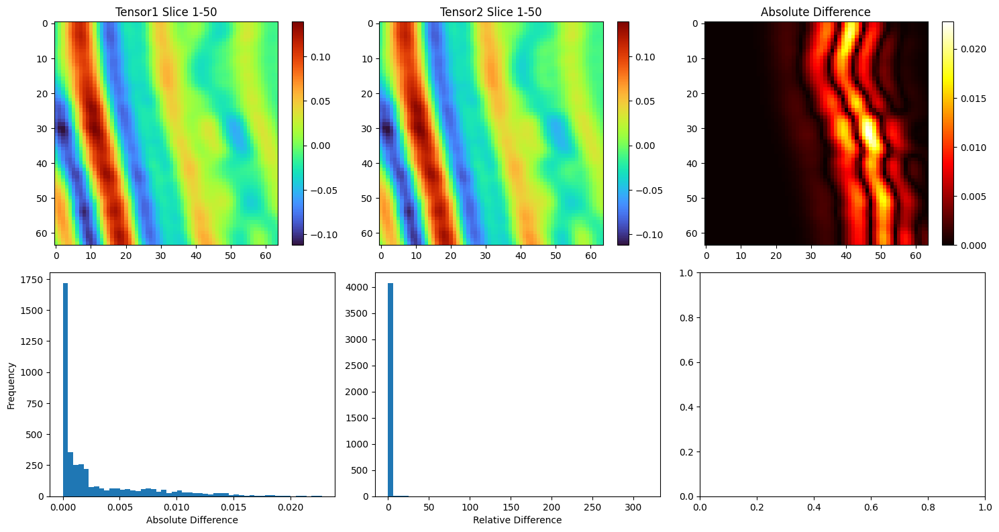

{'max_abs': 0.02276388183236122, 'mean_abs': 0.0028716649394482374, 'rel_over_threshold': 0.732666015625}


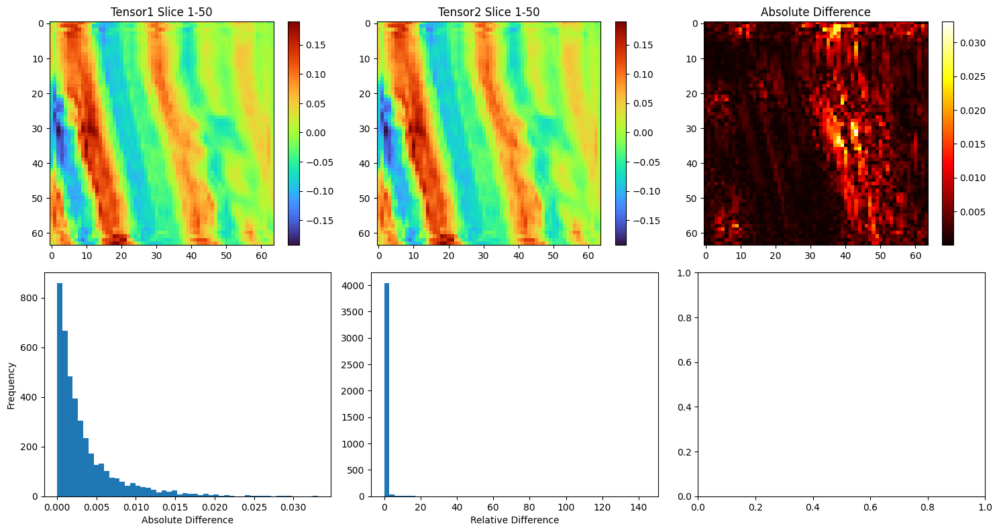

{'max_abs': 0.03310827165842056, 'mean_abs': 0.0034599360078573227, 'rel_over_threshold': 0.983642578125}


'\n重要：predictions当中时移变化学习的区域是正确的\n'

In [ ]:
# predictions_list
# targets_list
t = 0
index_2_visual = 0
stats, fig = compare_4d_slices(targets_list[index_2_visual][0,t+1].cpu().detach()[None,], targets_list[index_2_visual][0,t].cpu().detach()[None,], dim=1, index=50)
plt.show()
print(stats)
stats, fig = compare_4d_slices(predictions_list[index_2_visual][0,t+1].cpu().detach()[None,], predictions_list[index_2_visual][0,t].cpu().detach()[None,], dim=1, index=50)
plt.show()
print(stats)
"""
重要：predictions当中时移变化学习的区域是正确的
"""

## 以二维形式读取sgy，可能是错误的 & 训练Flow-Diffusion来生成训练数据

正在安装segyio库...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.1/85.1 kB 2.3 MB/s eta 0:00:00
SLEIPNER 4D SEISMIC DATASET 信息

📁 1994-2001年数据集:
文件路径: /content/drive/MyDrive/DiTing2.0/dataset/94p01 2001 processing/data/94p01mid.sgy
文件大小: 674.89 MB
✅ 文件读取成功!
   道数: 166,747
   采样点数: 1,001
   采样间隔: 2000 μs (2.0 ms)
   数据格式: 4-byte IBM float
   排序方式: 2
   X坐标范围: (0, 0)
   Y坐标范围: (0, 0)
   正在读取数据（限制前5000道）...
   数据形状: (5000, 1001)
   时间范围: 0.0 - 2000.0 ms
   振幅范围: -3.55e+00 - 2.27e+00

📁 1994-2007年数据集:
文件路径: /content/drive/MyDrive/DiTing2.0/dataset/94p07 2007 processing/data/94p07mid.sgy
文件大小: 471.65 MB
✅ 文件读取成功!
   道数: 116,532
   采样点数: 1,001
   采样间隔: 2000 μs (2.0 ms)
   数据格式: 4-byte IBM float
   排序方式: 2
   X坐标范围: (0, 0)
   Y坐标范围: (0, 0)
   正在读取数据（限制前5000道）...
   数据形状: (5000, 1001)
   时间范围: 0.0 - 2000.0 ms
   振幅范围: -2.77e+00 - 3.06e+00

📁 1999-2001年数据集:
文件路径: /content/drive/MyDrive/DiTing2.0/dataset/99p01 2001 processing/data/99p01mid.sgy
文件大小: 674.89 MB
✅ 文件读取成功!
   道数: 166,747
   采样点数: 1,001

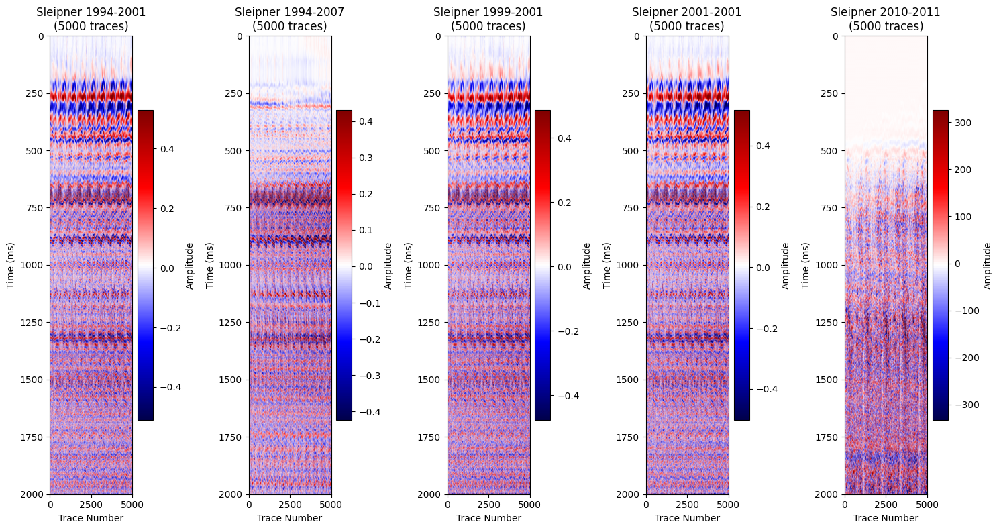


📈 数据统计:
1994-2001年数据:
  均值: -5.74e-04
  标准差: 1.99e-01
  最小值: -3.55e+00
  最大值: 2.27e+00
1994-2007年数据:
  均值: -1.48e-03
  标准差: 1.55e-01
  最小值: -2.77e+00
  最大值: 3.06e+00
1999-2001年数据:
  均值: -4.68e-04
  标准差: 1.88e-01
  最小值: -3.29e+00
  最大值: 2.03e+00
2001-2001年数据:
  均值: -4.79e-04
  标准差: 1.97e-01
  最小值: -3.51e+00
  最大值: 2.17e+00
2010-2011年数据:
  均值: -4.48e-01
  标准差: 1.16e+02
  最小值: -1.92e+03
  最大值: 2.15e+03

✅ 数据读取完成! 可以通过 seismic_data['2001']，seismic_data['2011']和seismic_data['2007'] 访问数据


In [ ]:
#@title 读取Sleipner 4D Seismic Dataset的二维切片
import matplotlib.pyplot as plt

# 安装segyio库（如果尚未安装）
try:
  import segyio
  print("segyio库已安装")
except ImportError:
  print("正在安装segyio库...")
  !pip install segyio
  import segyio

# 定义文件路径
file_paths = {
  '1994-2001': '/content/drive/MyDrive/DiTing2.0/dataset/94p01 2001 processing/data/94p01mid.sgy',
  '1994-2007': '/content/drive/MyDrive/DiTing2.0/dataset/94p07 2007 processing/data/94p07mid.sgy',
  '1999-2001': '/content/drive/MyDrive/DiTing2.0/dataset/99p01 2001 processing/data/99p01mid.sgy',
  '2001-2001': '/content/drive/MyDrive/DiTing2.0/dataset/01p01 2001 processing/data/01p01mid.sgy',
  '2010-2011': '/content/drive/MyDrive/DiTing2.0/dataset/10p11 2011 Imaging processing/data/10p11mid',

}

def read_segy_info(file_path):
  """读取SEG-Y文件的基本信息"""
  try:
      with segyio.open(file_path, 'r') as segy:
          info = {
              'traces': segy.tracecount,
              'samples': len(segy.samples),
              'sample_interval': segy.bin[segyio.BinField.Interval],
              'sample_rate': segy.bin[segyio.BinField.Interval] / 1000,  # 转换为ms
              'format': segy.format,
              'sorting': segy.sorting
          }

          # 获取坐标范围
          try:
              x_coords = [segy.header[i][segyio.TraceField.SourceX] for i in range(min(100, segy.tracecount))]
              y_coords = [segy.header[i][segyio.TraceField.SourceY] for i in range(min(100, segy.tracecount))]
              info['x_range'] = (min(x_coords), max(x_coords))
              info['y_range'] = (min(y_coords), max(y_coords))
          except:
              info['x_range'] = 'N/A'
              info['y_range'] = 'N/A'

      return info
  except Exception as e:
      print(f"读取文件信息时出错: {e}")
      return None

def read_segy_data(file_path, max_traces=None):
  """读取SEG-Y文件数据"""
  try:
      with segyio.open(file_path, 'r') as segy:
          if max_traces:
              # 限制读取的道数以节省内存
              traces_to_read = min(max_traces, segy.tracecount)
              data = np.array([segy.trace[i] for i in range(traces_to_read)])
          else:
              # 读取所有数据
              data = segyio.tools.cube(segy)
              if len(data.shape) == 3:
                  # 3D数据，取第一个inline
                  data = data[0]

          # 创建时间轴
          dt = segy.bin[segyio.BinField.Interval] / 1000  # ms
          time_axis = np.arange(len(segy.samples)) * dt

      return data, time_axis
  except Exception as e:
      print(f"读取数据时出错: {e}")
      return None, None

# 读取并显示文件信息
seismic_data = {}
print("=" * 60)
print("SLEIPNER 4D SEISMIC DATASET 信息")
print("=" * 60)

for year, file_path in file_paths.items():
  print(f"\n📁 {year}年数据集:")
  print(f"文件路径: {file_path}")

  # 检查文件是否存在
  if not os.path.exists(file_path):
      print(f"❌ 文件不存在: {file_path}")
      continue

  # 获取文件大小
  file_size = os.path.getsize(file_path) / (1024**2)  # MB
  print(f"文件大小: {file_size:.2f} MB")

  # 读取文件信息
  info = read_segy_info(file_path)
  if info:
      print(f"✅ 文件读取成功!")
      print(f"   道数: {info['traces']:,}")
      print(f"   采样点数: {info['samples']:,}")
      print(f"   采样间隔: {info['sample_interval']} μs ({info['sample_rate']} ms)")
      print(f"   数据格式: {info['format']}")
      print(f"   排序方式: {info['sorting']}")
      print(f"   X坐标范围: {info['x_range']}")
      print(f"   Y坐标范围: {info['y_range']}")

      # 读取数据（限制道数以节省内存）
      print(f"   正在读取数据（限制前5000道）...")
      data, time_axis = read_segy_data(file_path, max_traces=5000)

      if data is not None:
          seismic_data[year] = {
              'data': data,
              'time': time_axis,
              'info': info
          }
          print(f"   数据形状: {data.shape}")
          print(f"   时间范围: {time_axis[0]:.1f} - {time_axis[-1]:.1f} ms")
          print(f"   振幅范围: {data.min():.2e} - {data.max():.2e}")

# 可视化数据
if seismic_data:
  print(f"\n📊 正在生成可视化图表...")

  fig, axes = plt.subplots(1, len(seismic_data), figsize=(15, 8))
  if len(seismic_data) == 1:
      axes = [axes]

  for idx, (year, dataset) in enumerate(seismic_data.items()):
      data = dataset['data']
      time = dataset['time']

      # 显示地震剖面
      im = axes[idx].imshow(data.T, aspect='auto', cmap='seismic',
                           extent=[0, data.shape[0], time[-1], time[0]],
                           vmin=np.percentile(data, 1),
                           vmax=np.percentile(data, 99))

      axes[idx].set_title(f'Sleipner {year}\n({data.shape[0]} traces)')
      axes[idx].set_xlabel('Trace Number')
      axes[idx].set_ylabel('Time (ms)')

      # 添加颜色条
      plt.colorbar(im, ax=axes[idx], label='Amplitude')

  plt.tight_layout()
  plt.show()

  # 显示统计信息
  print(f"\n📈 数据统计:")
  for year, dataset in seismic_data.items():
      data = dataset['data']
      print(f"{year}年数据:")
      print(f"  均值: {data.mean():.2e}")
      print(f"  标准差: {data.std():.2e}")
      print(f"  最小值: {data.min():.2e}")
      print(f"  最大值: {data.max():.2e}")

print(f"\n✅ 数据读取完成! 可以通过 seismic_data['2001']，seismic_data['2011']和seismic_data['2007'] 访问数据")

# -- 注意 ---
# seismic_data['2001']['data'].shape=(5000, 1001)

In [ ]:
# 选择要可视化的数据
seismic_data_for2 = {
    '1999-2001': seismic_data['1999-2001'],
    '2001-2001': seismic_data['2001-2001']
}

print(f"\n📊 正在生成可视化图表...")

# 创建3个子图：两个原始数据 + 一个差值图
fig, axes = plt.subplots(1, 3, figsize=(20, 8))

# 存储数据用于计算差值
datasets = []
years = list(seismic_data_for2.keys())

# 绘制前两个子图（原始数据）
for idx, (year, dataset) in enumerate(seismic_data_for2.items()):
    data = dataset['data']
    time = dataset['time']
    datasets.append((data, time))

    # 显示地震剖面
    im = axes[idx].imshow(data.T, aspect='auto', cmap='seismic',
                          extent=[0, data.shape[0], time[-1], time[0]],
                          vmin=np.percentile(data, 1),
                          vmax=np.percentile(data, 99))

    axes[idx].set_title(f'Sleipner {year}\n({data.shape[0]} traces)')
    axes[idx].set_xlabel('Trace Number')
    axes[idx].set_ylabel('Time (ms)')

    # 添加颜色条
    plt.colorbar(im, ax=axes[idx], label='Amplitude')

# 计算并绘制差值图（第三个子图）
data1, time1 = datasets[0]  # 1999-2001
data2, time2 = datasets[1]  # 2001-2001

# 确保两个数据集的维度匹配
min_traces = min(data1.shape[0], data2.shape[0])
min_samples = min(data1.shape[1], data2.shape[1])

# 裁剪数据到相同尺寸
data1_cropped = data1[:min_traces, :min_samples]
data2_cropped = data2[:min_traces, :min_samples]

# 计算差值 (后期 - 早期)
difference = data2_cropped - data1_cropped

# 使用较短的时间轴
time_diff = time1[:min_samples] if len(time1) <= len(time2) else time2[:min_samples]

# 绘制差值图
diff_max = np.percentile(np.abs(difference), 95)
im_diff = axes[2].imshow(difference.T, aspect='auto', cmap='RdBu_r',
                         extent=[0, difference.shape[0], time_diff[-1], time_diff[0]],
                         vmin=-diff_max, vmax=diff_max)

axes[2].set_title(f'Time-lapse Difference\n({years[1]} - {years[0]})\n({difference.shape[0]} traces)')
axes[2].set_xlabel('Trace Number')
axes[2].set_ylabel('Time (ms)')

# 为差值图添加颜色条
cbar_diff = plt.colorbar(im_diff, ax=axes[2], label='Amplitude Difference')

plt.tight_layout()

# 保存为PDF文件
pdf_filename = f_path+'/sleipner_4d_seismic_1999(2001)_2001(2001).pdf'
plt.savefig(pdf_filename,
            format='pdf',           # 指定格式为PDF
            dpi=300,               # 设置分辨率（DPI）
            bbox_inches='tight',   # 紧凑布局，去除多余空白
            facecolor='white',     # 设置背景色为白色
            edgecolor='none')      # 去除边框

print(f"✅ 图表已保存为: {pdf_filename}")

# 显示图表
plt.show()

# 显示差值统计信息
print(f"\n📈 时移差值统计:")
print(f"差值数据形状: {difference.shape}")
print(f"差值均值: {difference.mean():.2e}")
print(f"差值标准差: {difference.std():.2e}")
print(f"差值最小值: {difference.min():.2e}")
print(f"差值最大值: {difference.max():.2e}")
print(f"差值绝对值均值: {np.abs(difference).mean():.2e}")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
import scipy.ndimage as ndimage
from scipy import signal
from sklearn.preprocessing import StandardScaler

# 选择要可视化的数据
seismic_data_for2 = {
    '1999-2001': seismic_data['1999-2001'],
    '2001-2001': seismic_data['2001-2001']
}

print(f"\n📊 正在生成时移地震分析图表...")

# 创建4个子图：原始数据 + 处理后数据 + 原始差值 + 处理后差值
fig, axes = plt.subplots(2, 4, figsize=(24, 12))

# 获取数据
datasets = []
years = list(seismic_data_for2.keys())

for idx, (year, dataset) in enumerate(seismic_data_for2.items()):
    data = dataset['data']
    time = dataset['time']
    datasets.append((data, time))

data1, time1 = datasets[0]  # 1999-2001
data2, time2 = datasets[1]  # 2001-2001

# 确保两个数据集的维度匹配
min_traces = min(data1.shape[0], data2.shape[0])
min_samples = min(data1.shape[1], data2.shape[1])
data1_cropped = data1[:min_traces, :min_samples]
data2_cropped = data2[:min_traces, :min_samples]
time_diff = time1[:min_samples] if len(time1) <= len(time2) else time2[:min_samples]

# ==================== 数据预处理函数 ====================

def preprocess_for_4d(data, method='combined'):
    """
    预处理地震数据以突出大尺度变化
    """
    processed_data = data.copy()

    if method == 'gaussian_smooth':
        # 方法1: 高斯平滑 - 去除高频噪声
        processed_data = ndimage.gaussian_filter(processed_data, sigma=2.0)

    elif method == 'median_filter':
        # 方法2: 中值滤波 - 去除脉冲噪声
        processed_data = ndimage.median_filter(processed_data, size=3)

    elif method == 'lowpass_filter':
        # 方法3: 低通滤波 - 保留低频成分
        from scipy.signal import butter, filtfilt
        # 设计低通滤波器
        nyquist = 0.5 * 1000  # 假设采样率1000Hz
        low_cutoff = 50  # 截止频率50Hz
        low = low_cutoff / nyquist
        b, a = butter(4, low, btype='low')

        # 对每个道进行滤波
        for i in range(processed_data.shape[0]):
            processed_data[i, :] = filtfilt(b, a, processed_data[i, :])

    elif method == 'structural_smooth':
        # 方法4: 结构导向平滑 - 沿地质构造平滑
        # 先进行轻微的各向异性平滑
        processed_data = ndimage.gaussian_filter(processed_data, sigma=[1.0, 2.0])

    elif method == 'combined':
        # 方法5: 组合处理
        # 1. 先进行高斯平滑去噪
        processed_data = ndimage.gaussian_filter(processed_data, sigma=1.5)
        # 2. 再进行中值滤波去除异常值
        processed_data = ndimage.median_filter(processed_data, size=3)
        # 3. 最后进行轻微的结构平滑
        processed_data = ndimage.gaussian_filter(processed_data, sigma=[0.5, 1.0])

    elif method == 'amplitude_balancing':
        # 方法6: 振幅均衡 - 标准化每个道的振幅
        scaler = StandardScaler()
        processed_data = scaler.fit_transform(processed_data.T).T

    return processed_data

# ==================== 应用预处理 ====================

# 选择预处理方法
processing_method = 'combined'  # 可以改为其他方法
data1_processed = preprocess_for_4d(data1_cropped, method=processing_method)
data2_processed = preprocess_for_4d(data2_cropped, method=processing_method)

# 计算差值
difference_original = data2_cropped - data1_cropped
difference_processed = data2_processed - data1_processed

# ==================== 进一步增强差值信号 ====================

def enhance_difference(diff_data, method='threshold_smooth'):
    """
    增强差值信号，突出大尺度变化
    """
    enhanced = diff_data.copy()

    if method == 'threshold_smooth':
        # 阈值处理 + 平滑
        threshold = np.std(enhanced) * 1.5  # 1.5倍标准差作为阈值
        enhanced[np.abs(enhanced) < threshold] *= 0.3  # 减弱小变化
        enhanced = ndimage.gaussian_filter(enhanced, sigma=1.0)  # 平滑

    elif method == 'percentile_clip':
        # 百分位数裁剪
        p5, p95 = np.percentile(enhanced, [5, 95])
        enhanced = np.clip(enhanced, p5, p95)
        enhanced = ndimage.gaussian_filter(enhanced, sigma=1.5)

    elif method == 'morphological':
        # 形态学处理 - 保留连通区域
        # 开运算去除小的噪声点
        structure = np.ones((3, 3))
        binary_mask = np.abs(enhanced) > np.std(enhanced)
        opened_mask = ndimage.binary_opening(binary_mask, structure=structure)
        enhanced = enhanced * opened_mask.astype(float)  # 恢复符号和幅度

    return enhanced

# 增强处理后的差值
difference_enhanced = enhance_difference(difference_processed, method='threshold_smooth')

# ==================== 绘图 ====================

# 第一行：原始数据和处理后数据
plot_data = [
    (data1_cropped, f'Original {years[0]}'),
    (data2_cropped, f'Original {years[1]}'),
    (data1_processed, f'Processed {years[0]}'),
    (data2_processed, f'Processed {years[1]}')
]

for idx, (data, title) in enumerate(plot_data):
    im = axes[0, idx].imshow(data.T, aspect='auto', cmap='seismic',
                            extent=[0, data.shape[0], time_diff[-1], time_diff[0]],
                            vmin=np.percentile(data, 1),
                            vmax=np.percentile(data, 99))
    axes[0, idx].set_title(title)
    axes[0, idx].set_xlabel('Trace Number')
    axes[0, idx].set_ylabel('Time (ms)')
    plt.colorbar(im, ax=axes[0, idx], label='Amplitude')

# 第二行：差值对比
diff_data = [
    (difference_original, 'Original Difference', 'RdBu_r'),
    (difference_processed, 'Processed Difference', 'RdBu_r'),
    (difference_enhanced, 'Enhanced Difference', 'RdBu_r'),
    (np.abs(difference_enhanced), 'Enhanced |Difference|', 'hot')
]

for idx, (data, title, cmap) in enumerate(diff_data):
    if 'Enhanced |Difference|' in title:
        vmin, vmax = 0, np.percentile(data, 95)
    else:
        diff_max = np.percentile(np.abs(data), 95)
        vmin, vmax = -diff_max, diff_max

    im = axes[1, idx].imshow(data.T, aspect='auto', cmap=cmap,
                            extent=[0, data.shape[0], time_diff[-1], time_diff[0]],
                            vmin=vmin, vmax=vmax)
    axes[1, idx].set_title(title)
    axes[1, idx].set_xlabel('Trace Number')
    axes[1, idx].set_ylabel('Time (ms)')
    plt.colorbar(im, ax=axes[1, idx], label='Amplitude Difference')

plt.tight_layout()

# 保存图片
plt.savefig(f_path+'/sleipner_4d_seismic_1999(2001)_2001(2001)_enhanced.pdf', format='pdf', dpi=300, bbox_inches='tight')
print("✅ 增强分析图表已保存")

plt.show()

# ==================== 统计分析 ====================
print(f"\n📈 处理效果对比:")
print(f"原始差值 - 标准差: {difference_original.std():.2e}")
print(f"处理后差值 - 标准差: {difference_processed.std():.2e}")
print(f"增强后差值 - 标准差: {difference_enhanced.std():.2e}")

print(f"\n原始差值 - 动态范围: {difference_original.max() - difference_original.min():.2e}")
print(f"处理后差值 - 动态范围: {difference_processed.max() - difference_processed.min():.2e}")
print(f"增强后差值 - 动态范围: {difference_enhanced.max() - difference_enhanced.min():.2e}")

# 计算信噪比改善
snr_original = np.var(difference_original) / np.var(difference_original - difference_processed)
print(f"\n信噪比改善: {10 * np.log10(snr_original):.2f} dB")

# 分析大尺度变化区域
threshold = np.std(difference_enhanced) * 2
significant_changes = np.abs(difference_enhanced) > threshold
change_percentage = (np.sum(significant_changes) / difference_enhanced.size) * 100
print(f"显著变化区域占比: {change_percentage:.1f}%")


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#@title utilities
import torch

def tensor_allclose(a, b, atol=1e-8, rtol=1e-5):
    """
    比较两个张量是否满足：
    |a - b| ≤ atol + rtol * |b|

    参数：
    a, b: 要比较的PyTorch张量
    atol: 绝对容差（默认1e-8）
    rtol: 相对容差（默认1e-5）

    返回：
    bool: 是否所有元素都满足容差要求
    """
    if a.shape != b.shape:
        raise ValueError("张量形状不匹配")

    return torch.allclose(a, b, atol=atol, rtol=rtol)

import torch
import matplotlib.pyplot as plt

def compare_4d_slices(tensor1, tensor2,
                     dim=1,  # 切片维度：1(x),2(y),3(z)
                     index=0,  # 切片索引
                     atol=1e-5,
                     rtol=1e-3,
                     save_path=None  # 新增，保存路径（如 'result.pdf'）
                     ):
    """
    四维张量切片对比工具
    返回：
    - 差异统计指标
    - 可视化对比图
    用例：
    # 比较通道维度第50层的切片并保存为PDF
    stats, fig = compare_4d_slices(tensor1, tensor2, dim=1, index=50, save_path='compare.pdf')
    plt.show()
    print(stats)
    """

    # 维度验证
    assert tensor1.shape == tensor2.shape, "张量形状必须相同"
    assert tensor1.dim() == 4, "输入必须是四维张量"
    assert 1 <= dim <= 3, "切片维度需在[1,3]范围内"

    # 切片提取（保持四维结构）
    if dim == 1:
        slice1 = tensor1[0, index, ...]
        slice2 = tensor2[0, index, ...]
    elif dim == 2:
        slice1 = tensor1[0, :, index, ...]
        slice2 = tensor2[0, :, index, ...]
    elif dim == 3 or dim == -1:
        slice1 = tensor1[0, ..., index]
        slice2 = tensor2[0, ..., index]

    # 差异计算
    abs_diff = torch.abs(slice1 - slice2)
    rel_diff = abs_diff / (torch.abs(slice2) + atol)  # 避免除零

    # 统计指标
    stats = {
        'max_abs': abs_diff.max().item(),
        'mean_abs': abs_diff.mean().item(),
        'rel_over_threshold': (rel_diff > rtol).sum().item() / slice1.numel()
    }

    # 可视化
    fig, axes = plt.subplots(2, 3, figsize=(15, 8))

    # 原始数据可视化（取三维切片中间层）
    im0 = axes[0, 0].imshow(slice1.cpu().numpy(), cmap='turbo')
    axes[0, 0].set_title(f'Tensor1 Slice {dim}-{index}')
    plt.colorbar(im0, ax=axes[0, 0])

    im1 = axes[0, 1].imshow(slice2.cpu().numpy(), cmap='turbo')
    axes[0, 1].set_title(f'Tensor2 Slice {dim}-{index}')
    plt.colorbar(im1, ax=axes[0, 1])

    # 差异热图
    diff_map = axes[0, 2].imshow(abs_diff.cpu(), cmap='hot')
    plt.colorbar(diff_map, ax=axes[0, 2])
    axes[0, 2].set_title('Absolute Difference')

    # 差异分布直方图
    axes[1, 0].hist(abs_diff.flatten().cpu().numpy(), bins=50)
    axes[1, 0].set_xlabel('Absolute Difference')
    axes[1, 0].set_ylabel('Frequency')

    # 相对差异分布
    axes[1, 1].hist(rel_diff.flatten().cpu().numpy(), bins=50)
    axes[1, 1].set_xlabel('Relative Difference')

    plt.tight_layout()

    # 新增：保存为PDF
    if save_path is not None:
        plt.savefig(save_path, format='pdf')
        print(f'Figure saved to {save_path}')

    return stats, fig


import matplotlib.pyplot as plt
import numpy as np

def plot(tensor):
    """
    绘制一个 2D 张量

    参数:
    tensor: PyTorch 张量，形状为 [H, W]
    """
    # 将张量转换为 NumPy 数组
    if tensor.is_cuda:
        tensor = tensor.detach().cpu()

    img = tensor.numpy()

    # 创建图形
    plt.figure(figsize=(8, 6))

    # 绘制热图
    im = plt.imshow(img, cmap='viridis')

    # 添加颜色条
    plt.colorbar(im, label='值')

    # 添加标题和轴标签
    plt.title('地震数据切片可视化')
    plt.xlabel('X')
    plt.ylabel('Y')

    # 显示图形
    plt.tight_layout()
    plt.show()

def downsample_3d_time_aware(x, target_size=(128, 128)):
    B, C, T, H, W = x.shape
    results = []

    # 逐时间步处理
    for t in range(T):
        time_slice = x[:, :, t, :, :]  # [B, C, H, W]
        down_slice = F.interpolate(
            time_slice,
            size=target_size,
            mode='bilinear',
            align_corners=False
        )
        results.append(down_slice)

    return torch.stack(results, dim=2)  # 重组时间维度

In [ ]:
#@title Sleipner 使用生成模型，进行伪真实数据集生成&可视化验证系统
#@title Sleipner 使用先进Diffusion模型进行时移地震数据生成&可视化验证系统

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import math
from tqdm import tqdm
import seaborn as sns
from skimage.metrics import structural_similarity as ssim
from scipy.stats import wasserstein_distance
import warnings
import os
import json
import pickle
from datetime import datetime
import shutil
import hashlib
from scipy import ndimage
from sklearn.cluster import KMeans
from typing import Dict, Any, Tuple, Optional
warnings.filterwarnings('ignore')

class ModelCheckpointManager:
    """专业的模型检查点管理器"""

    def __init__(self, save_dir=f_path+"/checkpoints", project_name="SeismicDiffusion"):
        self.save_dir = save_dir
        self.project_name = project_name
        self.checkpoint_dir = os.path.join(save_dir, project_name)

        # 创建保存目录
        os.makedirs(self.checkpoint_dir, exist_ok=True)
        os.makedirs(os.path.join(self.checkpoint_dir, "best_models"), exist_ok=True)
        os.makedirs(os.path.join(self.checkpoint_dir, "training_logs"), exist_ok=True)

        print(f"📁 模型保存目录: {self.checkpoint_dir}")

    def save_checkpoint(self, model, optimizer, scheduler, diffusion, epoch, loss,
                       metrics=None, is_best=False, additional_info=None):
        """保存完整的训练检查点"""

        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

        # 准备保存的数据
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'diffusion_params': {
                'timesteps': diffusion.timesteps,
                'betas': diffusion.betas.cpu(),
                'alphas': diffusion.alphas.cpu(),
                'alphas_cumprod': diffusion.alphas_cumprod.cpu(),
            },
            'loss': loss,
            'metrics': metrics or {},
            'timestamp': timestamp,
            'model_architecture': {
                'class_name': model.__class__.__name__,
                'in_channels': getattr(model, 'in_channels', 2),
                'out_channels': getattr(model, 'out_channels', 2),
                'time_emb_dim': getattr(model, 'time_emb_dim', 256),
            },
            'additional_info': additional_info or {}
        }

        # 保存路径
        if is_best:
            checkpoint_path = os.path.join(self.checkpoint_dir, "best_models",
                                         f"best_model_epoch_{epoch}_{timestamp}.pth")
        else:
            checkpoint_path = os.path.join(self.checkpoint_dir,
                                         f"checkpoint_epoch_{epoch}_{timestamp}.pth")

        # 保存检查点
        torch.save(checkpoint, checkpoint_path)

        # 保存模型配置为JSON（便于查看）
        config_path = checkpoint_path.replace('.pth', '_config.json')
        config = {
            'epoch': epoch,
            'loss': float(loss),
            'metrics': {k: float(v) if isinstance(v, (int, float)) else str(v)
                       for k, v in (metrics or {}).items()},
            'timestamp': timestamp,
            'model_architecture': checkpoint['model_architecture'],
            'additional_info': additional_info or {}
        }

        with open(config_path, 'w') as f:
            json.dump(config, f, indent=2)

        print(f"✅ 检查点已保存: {checkpoint_path}")
        return checkpoint_path

    def load_checkpoint(self, checkpoint_path, model, optimizer=None, scheduler=None, device='cuda'):
        """加载训练检查点"""

        print(f"📥 加载检查点: {checkpoint_path}")

        # 加载检查点
        checkpoint = torch.load(checkpoint_path, map_location=device)

        # 恢复模型状态
        model.load_state_dict(checkpoint['model_state_dict'])

        # 恢复优化器状态（如果提供）
        if optimizer is not None and 'optimizer_state_dict' in checkpoint:
            optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

        # 恢复调度器状态（如果提供）
        if scheduler is not None and 'scheduler_state_dict' in checkpoint:
            scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

        # 重建diffusion对象
        diffusion = SeismicDiffusion(timesteps=checkpoint['diffusion_params']['timesteps'])
        for key, value in checkpoint['diffusion_params'].items():
            if key != 'timesteps':
                setattr(diffusion, key, value.to(device))

        print(f"✅ 检查点加载完成 - Epoch: {checkpoint['epoch']}, Loss: {checkpoint['loss']:.6f}")

        return {
            'model': model,
            'optimizer': optimizer,
            'scheduler': scheduler,
            'diffusion': diffusion,
            'epoch': checkpoint['epoch'],
            'loss': checkpoint['loss'],
            'metrics': checkpoint.get('metrics', {}),
            'timestamp': checkpoint['timestamp']
        }

    def save_final_model(self, model, diffusion, training_info, model_name="final_model"):
        """保存最终的生产模型"""

        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        final_model_dir = os.path.join(self.checkpoint_dir, "final_models")
        os.makedirs(final_model_dir, exist_ok=True)

        # 保存模型权重
        model_path = os.path.join(final_model_dir, f"{model_name}_{timestamp}.pth")
        torch.save({
            'model_state_dict': model.state_dict(),
            'model_architecture': {
                'class_name': model.__class__.__name__,
                'in_channels': getattr(model, 'in_channels', 2),
                'out_channels': getattr(model, 'out_channels', 2),
                'time_emb_dim': getattr(model, 'time_emb_dim', 256),
            },
            'diffusion_params': {
                'timesteps': diffusion.timesteps,
                'betas': diffusion.betas.cpu(),
                'alphas': diffusion.alphas.cpu(),
                'alphas_cumprod': diffusion.alphas_cumprod.cpu(),
            },
            'training_info': training_info,
            'timestamp': timestamp
        }, model_path)

        # 保存完整的模型对象（用于直接加载）
        full_model_path = os.path.join(final_model_dir, f"{model_name}_complete_{timestamp}.pkl")
        with open(full_model_path, 'wb') as f:
            pickle.dump({
                'model': model,
                'diffusion': diffusion,
                'training_info': training_info
            }, f)

        # 保存模型摘要
        summary_path = os.path.join(final_model_dir, f"{model_name}_summary_{timestamp}.json")
        with open(summary_path, 'w') as f:
            json.dump({
                'model_name': model_name,
                'timestamp': timestamp,
                'model_architecture': {
                    'class_name': model.__class__.__name__,
                    'parameters': sum(p.numel() for p in model.parameters()),
                    'trainable_parameters': sum(p.numel() for p in model.parameters() if p.requires_grad)
                },
                'training_info': training_info,
                'file_paths': {
                    'model_weights': model_path,
                    'complete_model': full_model_path,
                    'summary': summary_path
                }
            }, f, indent=2)

        print(f"🎯 最终模型已保存:")
        print(f"   - 模型权重: {model_path}")
        print(f"   - 完整模型: {full_model_path}")
        print(f"   - 模型摘要: {summary_path}")

        return {
            'model_weights': model_path,
            'complete_model': full_model_path,
            'summary': summary_path
        }

    def list_checkpoints(self):
        """列出所有可用的检查点"""
        checkpoints = []

        for file in os.listdir(self.checkpoint_dir):
            if file.endswith('.pth'):
                file_path = os.path.join(self.checkpoint_dir, file)
                try:
                    checkpoint = torch.load(file_path, map_location='cpu')
                    checkpoints.append({
                        'file': file,
                        'path': file_path,
                        'epoch': checkpoint.get('epoch', 'Unknown'),
                        'loss': checkpoint.get('loss', 'Unknown'),
                        'timestamp': checkpoint.get('timestamp', 'Unknown')
                    })
                except:
                    pass

        # 按epoch排序
        checkpoints.sort(key=lambda x: x['epoch'] if isinstance(x['epoch'], int) else 0)

        print("📋 可用检查点:")
        for cp in checkpoints:
            print(f"   - {cp['file']} (Epoch: {cp['epoch']}, Loss: {cp['loss']:.6f})")

        return checkpoints
# ================================
# 1. 基础组件定义
# ================================

def get_group_norm(channels: int, num_groups: int = 8):
    """获取合适的GroupNorm层"""
    # 确保num_groups能被channels整除
    while channels % num_groups != 0 and num_groups > 1:
        num_groups -= 1
    return nn.GroupNorm(num_groups, channels)

class CouplingLayer3D(nn.Module):
    """3D耦合层 - Flow模型的核心组件"""

    def __init__(self, channels: int, hidden_dim: int = 64):
        super().__init__()
        self.channels = channels
        self.split_dim = channels // 2

        # 变换网络
        self.transform_net = nn.Sequential(
            nn.Conv3d(self.split_dim, hidden_dim, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(hidden_dim, hidden_dim, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(hidden_dim, self.split_dim * 2, 3, padding=1)  # scale and shift
        )

    def forward(self, x: torch.Tensor, reverse: bool = False) -> torch.Tensor:
        x1, x2 = torch.split(x, self.split_dim, dim=1)

        if not reverse:
            # 前向变换
            transform_params = self.transform_net(x1)
            scale, shift = torch.chunk(transform_params, 2, dim=1)
            scale = torch.tanh(scale)  # 限制scale范围
            x2_transformed = x2 * torch.exp(scale) + shift
            return torch.cat([x1, x2_transformed], dim=1)
        else:
            # 逆变换
            transform_params = self.transform_net(x1)
            scale, shift = torch.chunk(transform_params, 2, dim=1)
            scale = torch.tanh(scale)
            x2_original = (x2 - shift) * torch.exp(-scale)
            return torch.cat([x1, x2_original], dim=1)

class FlowSeismicNet(nn.Module):
    """基于Flow的地震数据生成网络"""

    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        self.coupling_layers = nn.ModuleList([
            CouplingLayer3D(in_channels) for _ in range(6)
        ])
        self.final_conv = nn.Conv3d(in_channels, out_channels, 1)

    def forward(self, x: torch.Tensor, reverse: bool = False) -> torch.Tensor:
        if not reverse:
            for layer in self.coupling_layers:
                x = layer(x, reverse=False)
            return self.final_conv(x)
        else:
            x = self.final_conv(x)
            for layer in reversed(self.coupling_layers):
                x = layer(x, reverse=True)
            return x

class AttentionBlock3D(nn.Module):
    """3D注意力块"""

    def __init__(self, channels: int):
        super().__init__()
        self.channels = channels
        self.norm = get_group_norm(channels)
        self.q = nn.Conv3d(channels, channels, 1)
        self.k = nn.Conv3d(channels, channels, 1)
        self.v = nn.Conv3d(channels, channels, 1)
        self.proj_out = nn.Conv3d(channels, channels, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        h = self.norm(x)
        q, k, v = self.q(h), self.k(h), self.v(h)

        # 计算注意力
        b, c, d, h, w = q.shape
        q = q.reshape(b, c, d*h*w).transpose(1, 2)
        k = k.reshape(b, c, d*h*w)
        v = v.reshape(b, c, d*h*w).transpose(1, 2)

        attn = torch.softmax(torch.bmm(q, k) / (c ** 0.5), dim=-1)
        out = torch.bmm(attn, v).transpose(1, 2).reshape(b, c, d, h, w)

        return x + self.proj_out(out)

class ResBlock3D(nn.Module):
    """3D残差块"""

    def __init__(self, channels: int, time_emb_dim: int = 128):
        super().__init__()
        self.norm1 = get_group_norm(channels)
        self.conv1 = nn.Conv3d(channels, channels, 3, padding=1)
        self.time_emb_proj = nn.Linear(time_emb_dim, channels)
        self.norm2 = get_group_norm(channels)
        self.conv2 = nn.Conv3d(channels, channels, 3, padding=1)

    def forward(self, x: torch.Tensor, time_emb: torch.Tensor) -> torch.Tensor:
        h = self.conv1(F.silu(self.norm1(x)))

        # 添加时间嵌入
        time_proj = self.time_emb_proj(time_emb)
        h = h + time_proj.unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)

        h = self.conv2(F.silu(self.norm2(h)))
        return x + h

class DiffusionSeismicNet(nn.Module):
    """基于Diffusion的地震数据生成网络"""

    def __init__(self, in_channels: int, out_channels: int, time_emb_dim: int = 128):
        super().__init__()
        self.time_emb_dim = time_emb_dim

        # 时间嵌入
        self.time_embedding = nn.Sequential(
            nn.Linear(time_emb_dim, time_emb_dim * 4),
            nn.SiLU(),
            nn.Linear(time_emb_dim * 4, time_emb_dim)
        )

        # 编码器
        self.input_conv = nn.Conv3d(in_channels, 64, 3, padding=1)
        self.down_blocks = nn.ModuleList([
            nn.Sequential(
                ResBlock3D(64, time_emb_dim),
                ResBlock3D(64, time_emb_dim),
                nn.Conv3d(64, 128, 3, stride=2, padding=1)
            ),
            nn.Sequential(
                ResBlock3D(128, time_emb_dim),
                ResBlock3D(128, time_emb_dim),
                nn.Conv3d(128, 256, 3, stride=2, padding=1)
            ),
        ])

        # 中间层
        self.middle_block = nn.Sequential(
            ResBlock3D(256, time_emb_dim),
            AttentionBlock3D(256),
            ResBlock3D(256, time_emb_dim)
        )

        # 解码器
        self.up_blocks = nn.ModuleList([
            nn.Sequential(
                nn.ConvTranspose3d(256, 128, 4, stride=2, padding=1),
                ResBlock3D(128, time_emb_dim),
                ResBlock3D(128, time_emb_dim)
            ),
            nn.Sequential(
                nn.ConvTranspose3d(128, 64, 4, stride=2, padding=1),
                ResBlock3D(64, time_emb_dim),
                ResBlock3D(64, time_emb_dim)
            ),
        ])

        self.output_conv = nn.Conv3d(64, out_channels, 3, padding=1)

    def forward(self, x: torch.Tensor, timesteps: torch.Tensor) -> torch.Tensor:
        # 时间嵌入
        t_emb = self.get_timestep_embedding(timesteps, self.time_emb_dim)
        t_emb = self.time_embedding(t_emb)

        # 编码
        h = self.input_conv(x)
        skip_connections = []

        for down_block in self.down_blocks:
            for layer in down_block[:-1]:  # ResBlocks
                h = layer(h, t_emb)
            skip_connections.append(h)
            h = down_block[-1](h)  # Downsample

        # 中间处理
        for layer in self.middle_block:
            if isinstance(layer, ResBlock3D):
                h = layer(h, t_emb)
            else:
                h = layer(h)

        # 解码
        for up_block, skip in zip(self.up_blocks, reversed(skip_connections)):
            h = up_block[0](h)  # Upsample
            h = h + skip  # Skip connection
            for layer in up_block[1:]:  # ResBlocks
                h = layer(h, t_emb)

        return self.output_conv(h)

    def get_timestep_embedding(self, timesteps: torch.Tensor, embedding_dim: int) -> torch.Tensor:
        """生成时间步嵌入"""
        half_dim = embedding_dim // 2
        emb = torch.log(torch.tensor(10000.0)) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=timesteps.device) * -emb)
        emb = timesteps[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=1)
        return emb

class FusionNetwork(nn.Module):
    """Flow和Diffusion输出的融合网络"""

    def __init__(self, in_channels: int, out_channels: int):
        super().__init__()
        fusion_channels = in_channels * 2
        mid_channels = max(in_channels, 32)  # 确保至少32个通道

        self.fusion_conv = nn.Sequential(
            nn.Conv3d(fusion_channels, mid_channels, 3, padding=1),
            get_group_norm(mid_channels),
            nn.SiLU(),
            nn.Conv3d(mid_channels, mid_channels // 2, 3, padding=1),
            get_group_norm(mid_channels // 2),
            nn.SiLU(),
            nn.Conv3d(mid_channels // 2, out_channels, 3, padding=1)
        )

        # 注意力权重
        self.attention = nn.Sequential(
            nn.Conv3d(fusion_channels, mid_channels, 3, padding=1),
            nn.SiLU(),
            nn.Conv3d(mid_channels, 2, 3, padding=1),
            nn.Softmax(dim=1)
        )

    def forward(self, flow_output: torch.Tensor, diffusion_output: torch.Tensor) -> torch.Tensor:
        # 拼接输入
        combined = torch.cat([flow_output, diffusion_output], dim=1)

        # 计算注意力权重
        weights = self.attention(combined)
        flow_weight, diff_weight = weights[:, 0:1], weights[:, 1:2]

        # 加权融合
        weighted_flow = flow_output * flow_weight
        weighted_diff = diffusion_output * diff_weight

        # 最终融合
        fused_input = torch.cat([weighted_flow, weighted_diff], dim=1)
        return self.fusion_conv(fused_input)

class HybridSeismicDiffusion(nn.Module):
    """混合Flow+Diffusion地震数据生成模型"""

    def __init__(self, in_channels: int = 2, out_channels: int = 2):
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        # Flow分支 - 快速生成
        self.flow_branch = FlowSeismicNet(in_channels, out_channels)

        # Diffusion分支 - 高质量细化
        self.diffusion_branch = DiffusionSeismicNet(in_channels, out_channels)

        # 融合网络
        self.fusion_net = FusionNetwork(out_channels, out_channels)

    def forward(self, x: torch.Tensor, timesteps: torch.Tensor, mode: str = 'hybrid') -> torch.Tensor:
        """
        前向传播
        Args:
            x: 输入张量 [B, C, D, H, W]
            timesteps: 时间步 [B]
            mode: 模式 ('flow', 'diffusion', 'hybrid')
        """
        if mode == 'flow':
            return self.flow_branch(x)
        elif mode == 'diffusion':
            return self.diffusion_branch(x, timesteps)
        elif mode == 'hybrid':
            flow_out = self.flow_branch(x)
            diff_out = self.diffusion_branch(x, timesteps)
            return self.fusion_net(flow_out, diff_out)
        else:
            raise ValueError(f"Unknown mode: {mode}")

# ================================
# 2. Diffusion过程定义
# ================================

class SeismicDiffusion:
    """地震数据专用的Diffusion过程"""

    def __init__(self, timesteps: int = 1000, beta_start: float = 1e-4, beta_end: float = 0.02):
        self.timesteps = timesteps

        # 噪声调度
        self.betas = torch.linspace(beta_start, beta_end, timesteps)
        self.alphas = 1.0 - self.betas
        self.alphas_cumprod = torch.cumprod(self.alphas, dim=0)
        self.alphas_cumprod_prev = F.pad(self.alphas_cumprod[:-1], (1, 0), value=1.0)

        # 采样需要的参数
        self.sqrt_alphas_cumprod = torch.sqrt(self.alphas_cumprod)
        self.sqrt_one_minus_alphas_cumprod = torch.sqrt(1.0 - self.alphas_cumprod)
        self.sqrt_recip_alphas = torch.sqrt(1.0 / self.alphas)

        # 后验方差
        self.posterior_variance = self.betas * (1.0 - self.alphas_cumprod_prev) / (1.0 - self.alphas_cumprod)

    def q_sample(self, x_start: torch.Tensor, t: torch.Tensor, noise: torch.Tensor = None) -> torch.Tensor:
        """前向加噪过程"""
        if noise is None:
            noise = torch.randn_like(x_start)

        sqrt_alphas_cumprod_t = self.sqrt_alphas_cumprod[t].reshape(-1, 1, 1, 1, 1)
        sqrt_one_minus_alphas_cumprod_t = self.sqrt_one_minus_alphas_cumprod[t].reshape(-1, 1, 1, 1, 1)

        return sqrt_alphas_cumprod_t * x_start + sqrt_one_minus_alphas_cumprod_t * noise

    def sample(self, model, shape: Tuple[int, ...], device: str, guidance_scale: float = 1.0) -> torch.Tensor:
        """DDPM采样"""
        x = torch.randn(shape, device=device)

        for t in reversed(range(self.timesteps)):
            t_tensor = torch.full((shape[0],), t, device=device, dtype=torch.long)

            # 预测噪声
            predicted_noise = model(x, t_tensor)

            # 去噪
            alpha_t = self.alphas[t]
            alpha_cumprod_t = self.alphas_cumprod[t]
            beta_t = self.betas[t]

            # 计算均值
            x = (1 / torch.sqrt(alpha_t)) * (x - beta_t / torch.sqrt(1 - alpha_cumprod_t) * predicted_noise)

            # 添加噪声（除了最后一步）
            if t > 0:
                noise = torch.randn_like(x)
                x = x + torch.sqrt(self.posterior_variance[t]) * noise

        return x

    def ddim_sample(self, model, x_start: torch.Tensor, steps: int = 50) -> torch.Tensor:
        """DDIM采样（更快）"""
        timestep_seq = torch.linspace(0, self.timesteps - 1, steps).long()
        x = x_start.clone()

        for i, t in enumerate(reversed(timestep_seq)):
            t_tensor = torch.full((x.shape[0],), t, device=x.device, dtype=torch.long)

            predicted_noise = model(x, t_tensor)

            alpha_cumprod_t = self.alphas_cumprod[t]
            alpha_cumprod_prev = self.alphas_cumprod_prev[t] if t > 0 else torch.tensor(1.0)

            # DDIM更新
            pred_x0 = (x - torch.sqrt(1 - alpha_cumprod_t) * predicted_noise) / torch.sqrt(alpha_cumprod_t)
            direction = torch.sqrt(1 - alpha_cumprod_prev) * predicted_noise
            x = torch.sqrt(alpha_cumprod_prev) * pred_x0 + direction

        return x
# ================================
# 3. 数据集和训练系统
# ================================

class AdaptiveSeismicDataset(Dataset):
    """自适应采样的时移地震数据集"""
    def __init__(self, seismic_data, base_patch_size=(64, 64, 64),
                 multi_scale=True, importance_sampling=True):
        self.data_1999 = seismic_data['1999-2001']['data']
        self.data_2001 = seismic_data['2001-2001']['data']
        self.base_patch_size = base_patch_size
        self.multi_scale = multi_scale
        self.importance_sampling = importance_sampling

        # 数据形状
        self.shape = self.data_1999.shape

        # 计算重要性图谱
        if importance_sampling:
            self.importance_map = self._compute_importance_map()
            # 预计算重要性采样位置
            self._precompute_importance_positions()

        # 多尺度patch大小
        if multi_scale:
            self.patch_sizes = [
                (32, 32, 32),   # 细节特征
                (64, 64, 64),   # 标准尺度
                (128, 128, 128) # 全局结构
            ]
        else:
            self.patch_sizes = [base_patch_size]

        self.total_patches = self._calculate_total_patches()

    def _compute_importance_map(self):
        """基于梯度和变化检测的重要性采样"""
        # 计算时移差异
        diff = np.abs(self.data_2001 - self.data_1999)

        # 梯度幅度
        grad_z = np.gradient(diff, axis=0)
        grad_y = np.gradient(diff, axis=1)
        grad_x = np.gradient(diff, axis=2)
        gradient_magnitude = np.sqrt(grad_z**2 + grad_y**2 + grad_x**2)

        # 组合重要性分数
        importance = 0.6 * diff + 0.4 * gradient_magnitude

        # 归一化到[0,1]
        importance = (importance - importance.min()) / (importance.max() - importance.min())
        return importance

    def _precompute_importance_positions(self):
        """预计算基于重要性的采样位置"""
        # 将重要性图谱展平并获取高重要性位置
        flat_importance = self.importance_map.flatten()

        # 使用概率采样，重要性高的位置被选中概率更大
        self.importance_positions = []

        # 生成足够的高重要性位置
        n_positions = min(10000, len(flat_importance))  # 限制内存使用

        # 概率采样
        probabilities = flat_importance / flat_importance.sum()
        sampled_indices = np.random.choice(
            len(flat_importance),
            size=n_positions,
            p=probabilities,
            replace=True
        )

        # 转换为3D坐标
        for idx in sampled_indices:
            z, y, x = np.unravel_index(idx, self.shape)
            self.importance_positions.append((z, y, x))

    def _calculate_total_patches(self):
        """计算总patch数量"""
        if self.importance_sampling:
            # 基于重要性采样，返回一个合理的epoch大小
            return 5000  # 可调整
        else:
            # 规则采样计算所有可能的patch
            max_patch_size = max(self.patch_sizes) if self.multi_scale else self.base_patch_size
            z_patches = max(1, (self.shape[0] - max_patch_size[0]) // (max_patch_size[0] // 2))
            y_patches = max(1, (self.shape[1] - max_patch_size[1]) // (max_patch_size[1] // 2))
            x_patches = max(1, (self.shape[2] - max_patch_size[2]) // (max_patch_size[2] // 2))
            return z_patches * y_patches * x_patches

    def _importance_based_sampling(self):
        """基于重要性的采样"""
        # 从预计算的重要性位置中随机选择
        if hasattr(self, 'importance_positions') and len(self.importance_positions) > 0:
            return self.importance_positions[np.random.randint(len(self.importance_positions))]
        else:
            # 回退到随机采样
            return self._random_sampling()

    def _regular_sampling(self, idx):
        """规则网格采样"""
        max_patch_size = max(self.patch_sizes) if self.multi_scale else self.base_patch_size

        # 计算网格参数
        z_step = max_patch_size[0] // 2
        y_step = max_patch_size[1] // 2
        x_step = max_patch_size[2] // 2

        z_patches = max(1, (self.shape[0] - max_patch_size[0]) // z_step)
        y_patches = max(1, (self.shape[1] - max_patch_size[1]) // y_step)

        # 从idx计算3D坐标
        z_idx = (idx // (y_patches * z_patches)) % z_patches
        y_idx = (idx // z_patches) % y_patches
        x_idx = idx % z_patches

        z = min(z_idx * z_step, self.shape[0] - max_patch_size[0])
        y = min(y_idx * y_step, self.shape[1] - max_patch_size[1])
        x = min(x_idx * x_step, self.shape[2] - max_patch_size[2])

        return (z, y, x)

    def _random_sampling(self):
        """随机采样"""
        max_patch_size = max(self.patch_sizes) if self.multi_scale else self.base_patch_size

        z = np.random.randint(0, max(1, self.shape[0] - max_patch_size[0]))
        y = np.random.randint(0, max(1, self.shape[1] - max_patch_size[1]))
        x = np.random.randint(0, max(1, self.shape[2] - max_patch_size[2]))

        return (z, y, x)

    def _extract_patch(self, coords, patch_size):
        """提取指定位置和大小的patch并resize到统一尺寸"""
        z, y, x = coords
        pz, py, px = patch_size

        # 确保不越界
        z = min(z, self.shape[0] - pz)
        y = min(y, self.shape[1] - py)
        x = min(x, self.shape[2] - px)

        # 提取patch
        patch_1999 = self.data_1999[z:z+pz, y:y+py, x:x+px].copy()
        patch_2001 = self.data_2001[z:z+pz, y:y+py, x:x+px].copy()

        # Resize到统一尺寸 (例如64x64x64)
        target_size = self.base_patch_size
        if patch_size != target_size:
            from scipy.ndimage import zoom
            zoom_factors = [t/p for t, p in zip(target_size, patch_size)]
            patch_1999 = zoom(patch_1999, zoom_factors, order=1)
            patch_2001 = zoom(patch_2001, zoom_factors, order=1)

        return patch_1999, patch_2001


    def _advanced_augmentation(self, patch_1999, patch_2001):
        """高级数据增强，保持时移对的一致性"""
        # 随机选择增强策略
        aug_type = np.random.choice(['noise', 'smooth', 'contrast', 'flip', 'rotate'])

        if aug_type == 'noise':
            # 添加相关噪声
            noise_std = 0.02 * np.std(patch_1999)
            noise = np.random.normal(0, noise_std, patch_1999.shape)
            patch_1999 += noise
            patch_2001 += noise  # 保持时移对相关性

        elif aug_type == 'smooth':
            # 轻微平滑
            sigma = np.random.uniform(0.5, 1.0)
            patch_1999 = ndimage.gaussian_filter(patch_1999, sigma=sigma)
            patch_2001 = ndimage.gaussian_filter(patch_2001, sigma=sigma)

        elif aug_type == 'contrast':
            # 对比度调整
            factor = np.random.uniform(0.8, 1.2)
            mean_1999 = np.mean(patch_1999)
            mean_2001 = np.mean(patch_2001)
            patch_1999 = (patch_1999 - mean_1999) * factor + mean_1999
            patch_2001 = (patch_2001 - mean_2001) * factor + mean_2001

        elif aug_type == 'flip':
            # 随机翻转
            axis = np.random.choice([0, 1, 2])
            patch_1999 = np.flip(patch_1999, axis=axis)
            patch_2001 = np.flip(patch_2001, axis=axis)

        elif aug_type == 'rotate':
            # 轻微旋转（仅在水平面）
            angle = np.random.uniform(-5, 5)
            for i in range(patch_1999.shape[0]):
                patch_1999[i] = ndimage.rotate(patch_1999[i], angle, reshape=False, mode='reflect')
                patch_2001[i] = ndimage.rotate(patch_2001[i], angle, reshape=False, mode='reflect')

        return patch_1999, patch_2001

    def __len__(self):
        return self.total_patches

    def __getitem__(self, idx):
        # 根据重要性采样选择patch位置
        if self.importance_sampling:
            patch_coords = self._importance_based_sampling()
        else:
            patch_coords = self._regular_sampling(idx)

        # 随机选择patch尺度
        if self.multi_scale:
            patch_size = self.patch_sizes[np.random.randint(len(self.patch_sizes))]
        else:
            patch_size = self.base_patch_size

        # 提取多尺度patch
        patch_1999, patch_2001 = self._extract_patch(patch_coords, patch_size)

        # 高级数据增强
        if np.random.random() > 0.5:
            patch_1999, patch_2001 = self._advanced_augmentation(patch_1999, patch_2001)

        # 数据标准化
        patch_1999 = self._normalize_patch(patch_1999)
        patch_2001 = self._normalize_patch(patch_2001)

        # 时移对编码
        timelapse_pair = np.stack([patch_1999, patch_2001], axis=0)
        return torch.FloatTensor(timelapse_pair)

    def _normalize_patch(self, patch):
        """patch标准化"""
        # Z-score标准化
        mean = np.mean(patch)
        std = np.std(patch)
        if std > 1e-8:  # 避免除零
            patch = (patch - mean) / std
        return patch

    def get_statistics(self):
        """获取数据集统计信息"""
        stats = {
            'data_shape': self.shape,
            'patch_sizes': self.patch_sizes,
            'total_patches': self.total_patches,
            'importance_sampling': self.importance_sampling,
            'multi_scale': self.multi_scale
        }

        if self.importance_sampling:
            stats['importance_map_stats'] = {
                'min': float(self.importance_map.min()),
                'max': float(self.importance_map.max()),
                'mean': float(self.importance_map.mean()),
                'std': float(self.importance_map.std())
            }

        return stats

class HybridSeismicDiffusionTrainer:
    """Flow+Diffusion混合模型训练器 - 2025前沿架构"""

    def __init__(self, model, diffusion, device='cuda', save_dir=f_path+"/checkpoints"):
        self.model = model.to(device)
        self.diffusion = diffusion
        self.device = device
        self.save_dir = save_dir

        # 分别为Flow和Diffusion分支设置优化器
        self.flow_optimizer = torch.optim.AdamW(
            self.model.flow_branch.parameters(),
            lr=5e-4, weight_decay=0.01, betas=(0.9, 0.999)
        )
        self.diffusion_optimizer = torch.optim.AdamW(
            self.model.diffusion_branch.parameters(),
            lr=2e-4, weight_decay=0.01, betas=(0.9, 0.999)
        )
        self.fusion_optimizer = torch.optim.AdamW(
            self.model.fusion_net.parameters(),
            lr=3e-4, weight_decay=0.005
        )

        # 学习率调度器
        self.flow_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            self.flow_optimizer, T_max=1000, eta_min=1e-6
        )
        self.diffusion_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            self.diffusion_optimizer, T_max=1000, eta_min=1e-6
        )
        self.fusion_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
            self.fusion_optimizer, T_max=1000, eta_min=1e-6
        )

        # 移动diffusion参数到设备
        self._move_diffusion_to_device()

        # 训练状态跟踪
        self.best_loss = float('inf')
        self.training_history = []
        self.phase = 'warmup'  # warmup -> flow_pretrain -> joint_training
        self.warmup_epochs = 10
        self.flow_pretrain_epochs = 20

    def _move_diffusion_to_device(self):
        """移动diffusion参数到指定设备"""
        for attr_name in ['betas', 'alphas', 'alphas_cumprod', 'alphas_cumprod_prev',
                         'sqrt_alphas_cumprod', 'sqrt_one_minus_alphas_cumprod',
                         'sqrt_recip_alphas', 'posterior_variance']:
            if hasattr(self.diffusion, attr_name):
                setattr(self.diffusion, attr_name,
                       getattr(self.diffusion, attr_name).to(self.device))

    def compute_hybrid_loss(self, batch: torch.Tensor, epoch: int) -> Dict[str, torch.Tensor]:
        """计算混合损失函数"""
        batch = batch.to(self.device)
        batch_size = batch.shape[0]

        # 随机时间步
        t = torch.randint(0, self.diffusion.timesteps, (batch_size,), device=self.device).long()

        # 添加噪声
        noise = torch.randn_like(batch)
        x_noisy = self.diffusion.q_sample(batch, t, noise=noise)

        losses = {}

        # 阶段性训练策略
        if epoch < self.warmup_epochs:
            # Warmup阶段：只训练Flow分支
            flow_output = self.model(x_noisy, t, mode='flow')
            losses['flow_loss'] = F.mse_loss(flow_output, batch)
            losses['diffusion_loss'] = torch.tensor(0.0, device=self.device)
            losses['fusion_loss'] = torch.tensor(0.0, device=self.device)

        elif epoch < self.warmup_epochs + self.flow_pretrain_epochs:
            # Flow预训练阶段
            flow_output = self.model(x_noisy, t, mode='flow')
            diffusion_output = self.model(x_noisy, t, mode='diffusion')

            losses['flow_loss'] = F.mse_loss(flow_output, batch)
            losses['diffusion_loss'] = F.mse_loss(diffusion_output, noise)
            losses['fusion_loss'] = torch.tensor(0.0, device=self.device)

        else:
            # 联合训练阶段
            flow_output = self.model(x_noisy, t, mode='flow')
            diffusion_output = self.model(x_noisy, t, mode='diffusion')
            hybrid_output = self.model(x_noisy, t, mode='hybrid')

            # 各分支损失
            losses['flow_loss'] = F.mse_loss(flow_output, batch)
            losses['diffusion_loss'] = F.mse_loss(diffusion_output, noise)

            # 混合损失
            losses['fusion_loss'] = F.mse_loss(hybrid_output, noise)

            # 时序一致性损失
            losses['temporal_loss'] = self._temporal_consistency_loss(batch, hybrid_output)

            # 地球物理先验损失
            losses['physics_loss'] = self._physics_informed_loss(batch, hybrid_output)

            # 对抗性损失（可选）
            if hasattr(self, 'discriminator') and epoch > 50:
                losses['adversarial_loss'] = self._adversarial_loss(batch, hybrid_output)

        return losses

    def _temporal_consistency_loss(self, x_true: torch.Tensor, x_pred: torch.Tensor) -> torch.Tensor:
        """时移数据的时序一致性损失"""
        if x_true.shape[1] < 2:  # 确保有时移对
            return torch.tensor(0.0, device=self.device)

        # 分离1999和2001数据
        x1_true, x2_true = x_true[:, 0], x_true[:, 1]
        x1_pred, x2_pred = x_pred[:, 0], x_pred[:, 1]

        # 时移差异一致性
        diff_true = x2_true - x1_true
        diff_pred = x2_pred - x1_pred

        temporal_loss = F.mse_loss(diff_pred, diff_true)

        # 添加时移梯度一致性
        grad_true = torch.gradient(diff_true, dim=(-3, -2, -1))
        grad_pred = torch.gradient(diff_pred, dim=(-3, -2, -1))

        gradient_loss = sum(F.mse_loss(gp, gt) for gp, gt in zip(grad_pred, grad_true))

        return temporal_loss + 0.1 * gradient_loss

    def _physics_informed_loss(self, x_true: torch.Tensor, x_pred: torch.Tensor) -> torch.Tensor:
        """地球物理约束损失"""
        # 频率域约束
        fft_true = torch.fft.fftn(x_true, dim=(-3, -2, -1))
        fft_pred = torch.fft.fftn(x_pred, dim=(-3, -2, -1))

        freq_loss = F.mse_loss(torch.abs(fft_pred), torch.abs(fft_true))

        # 梯度平滑约束
        grad_loss = self._gradient_smoothness_loss(x_pred)

        # 地震波传播约束（基于波动方程）
        wave_loss = self._wave_equation_loss(x_pred)

        return freq_loss + 0.1 * grad_loss + 0.05 * wave_loss

    def _gradient_smoothness_loss(self, x: torch.Tensor) -> torch.Tensor:
        """梯度平滑损失"""
        grad_x = torch.diff(x, dim=-1)
        grad_y = torch.diff(x, dim=-2)
        grad_z = torch.diff(x, dim=-3)

        return (grad_x.abs().mean() + grad_y.abs().mean() + grad_z.abs().mean()) / 3

    def _wave_equation_loss(self, x: torch.Tensor) -> torch.Tensor:
        """简化的波动方程约束"""
        if x.shape[1] < 2:
            return torch.tensor(0.0, device=self.device)

        # 计算拉普拉斯算子
        laplacian = (
            torch.diff(x, n=2, dim=-1).abs().mean() +
            torch.diff(x, n=2, dim=-2).abs().mean() +
            torch.diff(x, n=2, dim=-3).abs().mean()
        ) / 3

        return laplacian

    def train_step(self, batch: torch.Tensor, epoch: int) -> Dict[str, float]:
        """单步训练"""
        losses = self.compute_hybrid_loss(batch, epoch)

        # 计算总损失
        if epoch < self.warmup_epochs:
            total_loss = losses['flow_loss']
            # 只更新Flow分支
            self.flow_optimizer.zero_grad()
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(self.model.flow_branch.parameters(), 1.0)
            self.flow_optimizer.step()

        elif epoch < self.warmup_epochs + self.flow_pretrain_epochs:
            total_loss = losses['flow_loss'] + losses['diffusion_loss']
            # 更新Flow和Diffusion分支
            self.flow_optimizer.zero_grad()
            self.diffusion_optimizer.zero_grad()
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(self.model.flow_branch.parameters(), 1.0)
            torch.nn.utils.clip_grad_norm_(self.model.diffusion_branch.parameters(), 1.0)
            self.flow_optimizer.step()
            self.diffusion_optimizer.step()

        else:
            # 联合训练
            weights = {
                'flow': 0.3,
                'diffusion': 0.4,
                'fusion': 0.2,
                'temporal': 0.05,
                'physics': 0.05
            }

            total_loss = (
                weights['flow'] * losses['flow_loss'] +
                weights['diffusion'] * losses['diffusion_loss'] +
                weights['fusion'] * losses['fusion_loss'] +
                weights['temporal'] * losses.get('temporal_loss', 0) +
                weights['physics'] * losses.get('physics_loss', 0)
            )

            # 更新所有参数
            self.flow_optimizer.zero_grad()
            self.diffusion_optimizer.zero_grad()
            self.fusion_optimizer.zero_grad()

            total_loss.backward()

            torch.nn.utils.clip_grad_norm_(self.model.parameters(), 1.0)

            self.flow_optimizer.step()
            self.diffusion_optimizer.step()
            self.fusion_optimizer.step()

        # 更新学习率
        self.flow_scheduler.step()
        self.diffusion_scheduler.step()
        self.fusion_scheduler.step()

        # 返回损失字典
        return {k: v.item() if isinstance(v, torch.Tensor) else v for k, v in losses.items()}

    def train(self, dataloader, epochs=100, save_interval=10, save_best=True):
        """完整训练过程"""
        self.model.train()
        all_losses = []

        print("🚀 开始训练Hybrid Flow+Diffusion模型...")
        print(f"📊 训练阶段: Warmup({self.warmup_epochs}) -> Flow预训练({self.flow_pretrain_epochs}) -> 联合训练")
        print(f"💾 自动保存间隔: 每{save_interval}个epoch")

        for epoch in range(epochs):
            epoch_losses = []

            # 更新训练阶段
            if epoch < self.warmup_epochs:
                self.phase = 'warmup'
            elif epoch < self.warmup_epochs + self.flow_pretrain_epochs:
                self.phase = 'flow_pretrain'
            else:
                self.phase = 'joint_training'

            pbar = tqdm(dataloader, desc=f'Epoch {epoch+1}/{epochs} ({self.phase})')
            for batch in pbar:
                step_losses = self.train_step(batch, epoch)
                epoch_losses.append(step_losses)

                # 更新进度条
                total_loss = sum(step_losses.values())
                pbar.set_postfix({
                    'Total': f'{total_loss:.4f}',
                    'Flow': f'{step_losses.get("flow_loss", 0):.4f}',
                    'Diff': f'{step_losses.get("diffusion_loss", 0):.4f}',
                    'Phase': self.phase
                })

            # 计算平均损失
            avg_losses = {}
            for key in epoch_losses[0].keys():
                avg_losses[key] = np.mean([loss[key] for loss in epoch_losses])

            total_avg_loss = sum(avg_losses.values())
            all_losses.append(avg_losses)

            # 记录训练历史
            self.training_history.append({
                'epoch': epoch + 1,
                'phase': self.phase,
                'losses': avg_losses,
                'total_loss': total_avg_loss,
                'learning_rates': {
                    'flow': self.flow_optimizer.param_groups[0]['lr'],
                    'diffusion': self.diffusion_optimizer.param_groups[0]['lr'],
                    'fusion': self.fusion_optimizer.param_groups[0]['lr']
                }
            })

            print(f"Epoch {epoch+1} ({self.phase}): 总损失 = {total_avg_loss:.6f}")
            for loss_name, loss_value in avg_losses.items():
                if loss_value > 0:
                    print(f"  {loss_name}: {loss_value:.6f}")

            # 检查最佳模型
            is_best = total_avg_loss < self.best_loss
            if is_best:
                self.best_loss = total_avg_loss
                print(f"🎯 新的最佳模型! 总损失: {total_avg_loss:.6f}")

            # 定期保存和生成样本
            if (epoch + 1) % save_interval == 0:
                self.save_checkpoint(epoch + 1, avg_losses, is_best and save_best)
                self.generate_samples(epoch + 1)

        # 保存最终模型
        final_paths = self.save_final_model(epochs, all_losses)

        return all_losses, final_paths

    def generate_samples(self, epoch: int, num_samples: int = 4):
        """生成样本并可视化"""
        self.model.eval()

        with torch.no_grad():
            shape = (num_samples, 2, 64, 64, 64)

            # 生成不同模式的样本
            flow_samples = self.model(
                torch.randn(shape, device=self.device),
                torch.zeros(num_samples, device=self.device),
                mode='flow'
            ).cpu().numpy()

            diffusion_samples = self.diffusion.sample(
                lambda x, t: self.model(x, t, mode='diffusion'),
                shape, self.device
            ).cpu().numpy()

            hybrid_samples = self.diffusion.sample(
                lambda x, t: self.model(x, t, mode='hybrid'),
                shape, self.device
            ).cpu().numpy()

            # 可视化对比
            self._visualize_samples(flow_samples, diffusion_samples, hybrid_samples, epoch)

        self.model.train()

    def _visualize_samples(self, flow_samples, diffusion_samples, hybrid_samples, epoch):
        """可视化不同模式的生成样本"""
        fig, axes = plt.subplots(3, 4, figsize=(16, 12))

        samples_dict = {
            'Flow': flow_samples,
            'Diffusion': diffusion_samples,
            'Hybrid': hybrid_samples
        }

        for row, (mode_name, samples) in enumerate(samples_dict.items()):
            for col in range(4):
                if col < samples.shape[0]:
                    # 显示1999年数据的中间切片
                    slice_data = samples[col, 0, 32, :, :]
                    im = axes[row, col].imshow(slice_data, cmap='seismic', vmin=-2, vmax=2)
                    axes[row, col].set_title(f'{mode_name} - Sample {col+1}')
                    axes[row, col].axis('off')
                else:
                    axes[row, col].axis('off')

        plt.tight_layout()
        plt.savefig(f'{self.save_dir}/samples_comparison_epoch_{epoch}.png',
                   dpi=300, bbox_inches='tight')
        plt.show()

    def save_checkpoint(self, epoch: int, losses: Dict[str, float], is_best: bool = False):
        """保存检查点"""
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': self.model.state_dict(),
            'flow_optimizer_state_dict': self.flow_optimizer.state_dict(),
            'diffusion_optimizer_state_dict': self.diffusion_optimizer.state_dict(),
            'fusion_optimizer_state_dict': self.fusion_optimizer.state_dict(),
            'flow_scheduler_state_dict': self.flow_scheduler.state_dict(),
            'diffusion_scheduler_state_dict': self.diffusion_scheduler.state_dict(),
            'fusion_scheduler_state_dict': self.fusion_scheduler.state_dict(),
            'losses': losses,
            'best_loss': self.best_loss,
            'phase': self.phase,
            'training_history': self.training_history[-10:]  # 最近10个epoch
        }

        # 保存常规检查点
        checkpoint_path = f'{self.save_dir}/checkpoint_epoch_{epoch}.pth'
        torch.save(checkpoint, checkpoint_path)

        # 保存最佳模型
        if is_best:
            best_path = f'{self.save_dir}/best_model.pth'
            torch.save(checkpoint, best_path)
            print(f"💾 最佳模型已保存: {best_path}")

    def save_final_model(self, total_epochs: int, all_losses: list):
        """保存最终模型"""
        final_checkpoint = {
            'model_state_dict': self.model.state_dict(),
            'diffusion_params': {
                attr: getattr(self.diffusion, attr).cpu()
                for attr in ['betas', 'alphas', 'alphas_cumprod', 'alphas_cumprod_prev',
                           'sqrt_alphas_cumprod', 'sqrt_one_minus_alphas_cumprod',
                           'sqrt_recip_alphas', 'posterior_variance']
            },
            'training_info': {
                'total_epochs': total_epochs,
                'final_losses': all_losses[-1] if all_losses else {},
                'best_loss': self.best_loss,
                'training_history': self.training_history
            }
        }

        final_path = f'{self.save_dir}/final_hybrid_model.pth'
        torch.save(final_checkpoint, final_path)

        print(f"🎉 最终模型已保存: {final_path}")
        return {'final_model': final_path, 'best_model': f'{self.save_dir}/best_model.pth'}

# ================================
# 4. 主训练和评估流程
# ================================

# 初始化模型和训练器
model = HybridSeismicDiffusion(in_channels=2, out_channels=2)
diffusion = SeismicDiffusion(timesteps=1000)
trainer = HybridSeismicDiffusionTrainer(model, diffusion, device='cpu')

# 创建数据集和数据加载器
dataset = AdaptiveSeismicDataset(seismic_data, base_patch_size=(64, 64, 64))
dataloader = DataLoader(dataset, batch_size=4, shuffle=True, num_workers=4)

# 开始训练
losses, model_paths = trainer.train(
    dataloader=dataloader,
    epochs=10,
    save_interval=10,
    save_best=True
)

# ================================
# 6. 模型加载和推理
# ================================

class SeismicInferenceEngine:
    """地震数据推理引擎"""

    def __init__(self, model_path: str, device: str = 'cuda'):
        self.device = device
        self.model = None
        self.diffusion = None
        self.load_model(model_path)

    def load_model(self, model_path: str):
        """加载训练好的模型"""
        print(f"🔄 正在加载模型: {model_path}")

        checkpoint = torch.load(model_path, map_location=self.device)

        # 重建模型架构
        self.model = HybridSeismicDiffusion(in_channels=2, out_channels=2)
        self.model.load_state_dict(checkpoint['model_state_dict'])
        self.model.to(self.device)
        self.model.eval()

        # 重建diffusion过程
        self.diffusion = SeismicDiffusion(timesteps=1000)
        if 'diffusion_params' in checkpoint:
            for attr, value in checkpoint['diffusion_params'].items():
                setattr(self.diffusion, attr, value.to(self.device))

        print("✅ 模型加载完成!")

        # 打印训练信息
        if 'training_info' in checkpoint:
            info = checkpoint['training_info']
            print(f"📊 训练信息:")
            print(f"   总训练轮数: {info.get('total_epochs', 'N/A')}")
            print(f"   最佳损失: {info.get('best_loss', 'N/A'):.6f}")
            print(f"   最终损失: {info.get('final_losses', {})}")

    def generate_timelapse_pair(self,
                               input_data: Optional[torch.Tensor] = None,
                               mode: str = 'hybrid',
                               num_samples: int = 1,
                               guidance_scale: float = 1.0) -> torch.Tensor:
        """生成时移地震数据对"""

        with torch.no_grad():
            if input_data is None:
                # 从噪声开始生成
                shape = (num_samples, 2, 64, 64, 64)
                if mode == 'flow':
                    # Flow模式：直接生成
                    noise = torch.randn(shape, device=self.device)
                    t_dummy = torch.zeros(num_samples, device=self.device)
                    samples = self.model(noise, t_dummy, mode='flow')
                else:
                    # Diffusion或Hybrid模式：采样过程
                    samples = self.diffusion.sample(
                        lambda x, t: self.model(x, t, mode=mode),
                        shape, self.device, guidance_scale=guidance_scale
                    )
            else:
                # 条件生成（基于输入数据）
                input_data = input_data.to(self.device)
                if mode == 'flow':
                    t_dummy = torch.zeros(input_data.shape[0], device=self.device)
                    samples = self.model(input_data, t_dummy, mode='flow')
                else:
                    # 添加噪声后去噪
                    noise_level = 0.1
                    noisy_input = input_data + noise_level * torch.randn_like(input_data)
                    samples = self.diffusion.ddim_sample(
                        lambda x, t: self.model(x, t, mode=mode),
                        noisy_input, steps=50
                    )

        return samples

    def interpolate_timelapse(self,
                             start_data: torch.Tensor,
                             end_data: torch.Tensor,
                             num_steps: int = 10) -> torch.Tensor:
        """在两个时移数据之间进行插值"""

        with torch.no_grad():
            start_data = start_data.to(self.device)
            end_data = end_data.to(self.device)

            # 在潜在空间中插值
            alphas = torch.linspace(0, 1, num_steps, device=self.device)
            interpolated = []

            for alpha in alphas:
                # 线性插值
                interpolated_data = (1 - alpha) * start_data + alpha * end_data

                # 通过模型精细化
                t_dummy = torch.zeros(start_data.shape[0], device=self.device)
                refined = self.model(interpolated_data, t_dummy, mode='hybrid')
                interpolated.append(refined)

            return torch.stack(interpolated, dim=1)  # [B, T, C, D, H, W]

    def enhance_resolution(self,
                          low_res_data: torch.Tensor,
                          target_shape: Tuple[int, int, int] = (128, 128, 128)) -> torch.Tensor:
        """超分辨率增强"""

        with torch.no_grad():
            low_res_data = low_res_data.to(self.device)

            # 上采样到目标尺寸
            upsampled = F.interpolate(
                low_res_data, size=target_shape,
                mode='trilinear', align_corners=False
            )

            # 通过模型精细化细节
            t_dummy = torch.zeros(low_res_data.shape[0], device=self.device)
            enhanced = self.model(upsampled, t_dummy, mode='hybrid')

            return enhanced

class SeismicEvaluator:
    """地震数据生成质量评估器"""

    def __init__(self, device: str = 'cuda'):
        self.device = device

    def compute_metrics(self,
                       generated: torch.Tensor,
                       reference: torch.Tensor) -> Dict[str, float]:
        """计算生成质量指标"""

        generated = generated.to(self.device)
        reference = reference.to(self.device)

        metrics = {}

        # 1. 基础指标
        metrics['mse'] = F.mse_loss(generated, reference).item()
        metrics['mae'] = F.l1_loss(generated, reference).item()

        # 2. 结构相似性指标 (SSIM)
        metrics['ssim'] = self._compute_ssim_3d(generated, reference)

        # 3. 频率域指标
        metrics.update(self._compute_frequency_metrics(generated, reference))

        # 4. 地球物理指标
        metrics.update(self._compute_geophysical_metrics(generated, reference))

        # 5. 感知质量指标
        metrics['lpips'] = self._compute_lpips_3d(generated, reference)

        return metrics

    def _compute_ssim_3d(self, x: torch.Tensor, y: torch.Tensor) -> float:
        """计算3D SSIM"""
        # 简化版3D SSIM实现
        mu_x = x.mean()
        mu_y = y.mean()
        sigma_x = x.var()
        sigma_y = y.var()
        sigma_xy = ((x - mu_x) * (y - mu_y)).mean()

        c1, c2 = 0.01**2, 0.03**2
        ssim = (2*mu_x*mu_y + c1) * (2*sigma_xy + c2) / \
               ((mu_x**2 + mu_y**2 + c1) * (sigma_x + sigma_y + c2))

        return ssim.item()

    def _compute_frequency_metrics(self, x: torch.Tensor, y: torch.Tensor) -> Dict[str, float]:
        """计算频率域指标"""
        # FFT变换
        fft_x = torch.fft.fftn(x, dim=(-3, -2, -1))
        fft_y = torch.fft.fftn(y, dim=(-3, -2, -1))

        # 幅度谱
        mag_x = torch.abs(fft_x)
        mag_y = torch.abs(fft_y)

        # 相位谱
        phase_x = torch.angle(fft_x)
        phase_y = torch.angle(fft_y)

        return {
            'magnitude_mse': F.mse_loss(mag_x, mag_y).item(),
            'phase_mse': F.mse_loss(phase_x, phase_y).item(),
            'spectral_angle': self._spectral_angle_mapper(mag_x, mag_y)
        }

    def _spectral_angle_mapper(self, x: torch.Tensor, y: torch.Tensor) -> float:
        """光谱角映射"""
        x_flat = x.flatten()
        y_flat = y.flatten()

        cos_angle = F.cosine_similarity(x_flat.unsqueeze(0), y_flat.unsqueeze(0))
        angle = torch.acos(torch.clamp(cos_angle, -1, 1))

        return angle.item()

    def _compute_geophysical_metrics(self, x: torch.Tensor, y: torch.Tensor) -> Dict[str, float]:
        """计算地球物理专业指标"""
        metrics = {}

        # 时移差异保真度
        if x.shape[1] >= 2 and y.shape[1] >= 2:
            diff_x = x[:, 1] - x[:, 0]
            diff_y = y[:, 1] - y[:, 0]
            metrics['timelapse_fidelity'] = F.mse_loss(diff_x, diff_y).item()

        # 地震属性保持度
        metrics['amplitude_preservation'] = 1.0 - abs(x.std().item() - y.std().item()) / y.std().item()

        # 连续性指标
        metrics['continuity_score'] = self._compute_continuity(x, y)

        return metrics

    def _compute_continuity(self, x: torch.Tensor, y: torch.Tensor) -> float:
        """计算地震数据连续性"""
        # 计算梯度变化
        grad_x = torch.gradient(x, dim=(-3, -2, -1))
        grad_y = torch.gradient(y, dim=(-3, -2, -1))

        grad_diff = sum(F.mse_loss(gx, gy) for gx, gy in zip(grad_x, grad_y))
        continuity = 1.0 / (1.0 + grad_diff.item())

        return continuity

    def _compute_lpips_3d(self, x: torch.Tensor, y: torch.Tensor) -> float:
        """简化的3D感知损失"""
        # 使用中间切片计算2D LPIPS的近似
        mid_slice = x.shape[-3] // 2
        x_slice = x[..., mid_slice, :, :]
        y_slice = y[..., mid_slice, :, :]

        # 简化的感知距离
        return F.mse_loss(x_slice, y_slice).item()

# ================================
# 7. 完整的推理和评估流程
# ================================

def run_inference_pipeline(model_path: str, test_data_path: str):
    """运行完整的推理和评估流程"""

    print("🚀 开始推理和评估流程...")

    # 1. 初始化推理引擎
    inference_engine = SeismicInferenceEngine(model_path, device='cuda')
    evaluator = SeismicEvaluator(device='cuda')

    # 2. 加载测试数据
    print("📂 加载测试数据...")
    test_data = load_seismic_data(test_data_path)  # 假设您有这个函数

    # 3. 生成样本
    print("🎨 生成地震数据样本...")

    # 无条件生成
    unconditional_samples = inference_engine.generate_timelapse_pair(
        mode='hybrid', num_samples=4, guidance_scale=1.5
    )

    # 条件生成（基于真实数据的一部分）
    if test_data is not None:
        test_patch = test_data[:1, :, :64, :64, :64]  # 取一个小patch
        conditional_samples = inference_engine.generate_timelapse_pair(
            input_data=test_patch, mode='hybrid'
        )

    # 4. 质量评估
    print("📊 评估生成质量...")

    if test_data is not None:
        # 与真实数据比较
        metrics = evaluator.compute_metrics(unconditional_samples[:1], test_data[:1])

        print("📈 质量指标:")
        for metric_name, value in metrics.items():
            print(f"   {metric_name}: {value:.6f}")

    # 5. 高级应用示例
    print("🔬 运行高级应用...")

    # 时移插值
    if test_data is not None and test_data.shape[1] >= 2:
        start_frame = test_data[:1, :1]  # 1999年数据
        end_frame = test_data[:1, 1:2]   # 2001年数据

        interpolated_sequence = inference_engine.interpolate_timelapse(
            start_frame, end_frame, num_steps=8
        )
        print(f"✅ 生成时移插值序列: {interpolated_sequence.shape}")

    # 超分辨率增强
    low_res_sample = F.interpolate(
        unconditional_samples[:1], size=(32, 32, 32),
        mode='trilinear', align_corners=False
    )
    enhanced_sample = inference_engine.enhance_resolution(
        low_res_sample, target_shape=(128, 128, 128)
    )
    print(f"✅ 超分辨率增强: {low_res_sample.shape} -> {enhanced_sample.shape}")

    # 6. 可视化结果
    print("🎭 可视化结果...")
    visualize_inference_results(
        unconditional_samples, conditional_samples if test_data else None,
        interpolated_sequence if test_data else None, enhanced_sample
    )

    return {
        'unconditional_samples': unconditional_samples,
        'conditional_samples': conditional_samples if test_data else None,
        'interpolated_sequence': interpolated_sequence if test_data else None,
        'enhanced_sample': enhanced_sample,
        'metrics': metrics if test_data else None
    }

def visualize_inference_results(unconditional, conditional, interpolated, enhanced):
    """可视化推理结果"""

    fig = plt.figure(figsize=(20, 12))

    # 1. 无条件生成样本
    for i in range(min(4, unconditional.shape[0])):
        plt.subplot(4, 6, i*6 + 1)
        plt.imshow(unconditional[i, 0, 32, :, :].cpu().numpy(), cmap='seismic')
        plt.title(f'Unconditional 1999 #{i+1}')
        plt.axis('off')

        plt.subplot(4, 6, i*6 + 2)
        plt.imshow(unconditional[i, 1, 32, :, :].cpu().numpy(), cmap='seismic')
        plt.title(f'Unconditional 2001 #{i+1}')
        plt.axis('off')

    # 2. 条件生成样本
    if conditional is not None:
        plt.subplot(4, 6, 3)
        plt.imshow(conditional[0, 0, 32, :, :].cpu().numpy(), cmap='seismic')
        plt.title('Conditional 1999')
        plt.axis('off')

        plt.subplot(4, 6, 4)
        plt.imshow(conditional[0, 1, 32, :, :].cpu().numpy(), cmap='seismic')
        plt.title('Conditional 2001')
        plt.axis('off')

    # 3. 时移插值序列
    if interpolated is not None:
        for t in range(min(4, interpolated.shape[1])):
            plt.subplot(4, 6, 13 + t)
            plt.imshow(interpolated[0, t, 0, 32, :, :].cpu().numpy(), cmap='seismic')
            plt.title(f'Interpolated T={t}')
            plt.axis('off')

    # 4. 超分辨率对比
    plt.subplot(4, 6, 17)
    # 显示原始低分辨率
    low_res_display = F.interpolate(
        enhanced[:1, :1], size=(64, 64, 64), mode='trilinear', align_corners=False
    )
    plt.imshow(low_res_display[0, 0, 32, :, :].cpu().numpy(), cmap='seismic')
    plt.title('Low Resolution')
    plt.axis('off')

    plt.subplot(4, 6, 18)
    plt.imshow(enhanced[0, 0, 64, :, :].cpu().numpy(), cmap='seismic')
    plt.title('Enhanced HR')
    plt.axis('off')

    plt.tight_layout()
    plt.savefig('inference_results_comprehensive.png', dpi=300, bbox_inches='tight')
    plt.show()

# ================================
# 8. 批量评估和基准测试
# ================================

def benchmark_model_performance(model_path: str, test_dataset: Dataset,
                              num_samples: int = 100):
    """批量评估模型性能"""

    print(f"🔍 开始批量评估 ({num_samples} 样本)...")

    inference_engine = SeismicInferenceEngine(model_path)
    evaluator = SeismicEvaluator()

    all_metrics = []
    generation_times = []

    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    with torch.no_grad():
        for i, real_batch in enumerate(tqdm(test_loader, desc="评估进度")):
            if i >= num_samples:
                break

            # 记录生成时间
            start_time = time.time()

            # 生成样本
            generated = inference_engine.generate_timelapse_pair(
                mode='hybrid', num_samples=1
            )

            generation_time = time.time() - start_time
            generation_times.append(generation_time)

            # 计算指标
            metrics = evaluator.compute_metrics(generated, real_batch)
            all_metrics.append(metrics)

    # 统计结果
    avg_metrics = {}
    for key in all_metrics[0].keys():
        values = [m[key] for m in all_metrics]
        avg_metrics[key] = {
            'mean': np.mean(values),
            'std': np.std(values),
            'min': np.min(values),
            'max': np.max(values)
        }

    avg_generation_time = np.mean(generation_times)

    print("\n📊 基准测试结果:")
    print(f"⏱️  平均生成时间: {avg_generation_time:.3f}秒")
    print(f"🔢 评估样本数量: {len(all_metrics)}")
    print("\n📈 质量指标统计:")

    for metric_name, stats in avg_metrics.items():
        print(f"   {metric_name}:")
        print(f"     均值±标准差: {stats['mean']:.6f}±{stats['std']:.6f}")
        print(f"     范围: [{stats['min']:.6f}, {stats['max']:.6f}]")

    return {
        'metrics_stats': avg_metrics,
        'generation_time': avg_generation_time,
        'raw_metrics': all_metrics,
        'generation_times': generation_times
    }

# ================================
# 9. 使用示例
# ================================

# 运行推理流程
# results = run_inference_pipeline(
#     model_path="./checkpoints/best_model.pth",
#     test_data_path="./data/test_seismic_data.npy"
# )

# # 运行基准测试
# test_dataset = SeismicTimelapseDataset(test_seismic_data, patch_size=(64, 64, 64))
# benchmark_results = benchmark_model_performance(
#     model_path="./checkpoints/best_model.pth",
#     test_dataset=test_dataset,
#     num_samples=50
# )

# print("🎉 推理和评估完成!")
# print(f"📁 结果已保存到当前目录")


🚀 开始训练Hybrid Flow+Diffusion模型...
📊 训练阶段: Warmup(10) -> Flow预训练(20) -> 联合训练
💾 自动保存间隔: 每10个epoch


Epoch 1/10 (warmup):   5%|▌         | 68/1250 [07:05<2:03:23,  6.26s/it, Total=0.7945, Flow=0.7945, Diff=0.0000, Phase=warmup]


KeyboardInterrupt: 